In [8]:
import numpy as np
from numpy.linalg import inv, svd, pinv
import pandas as pd
pd.options.mode.chained_assignment = None
import math
import itertools
import random
import networkx as nx

import scipy
import scipy.cluster.hierarchy as sch
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from scipy.spatial.distance import squareform, mahalanobis
from scipy.stats import gaussian_kde, pearsonr, linregress
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import minimum_spanning_tree
from scipy.ndimage import gaussian_filter

from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn import manifold
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics.cluster import normalized_mutual_info_score

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from matplotlib.lines import Line2D
from matplotlib.ticker import NullFormatter
from matplotlib.collections import LineCollection
import matplotlib.transforms
import matplotlib.path

import seaborn as sns
import plotly.express as px
from tabulate import tabulate

from string import ascii_letters
import sys

Load ANES dataset. Create a list of dataframes, one for every edition considered in the paper (1992, 2000, 2008, 2016, 2020).

In [17]:
processed = pd.read_csv("ANESdataset.csv")

yearsSubset = (1992, 2000, 2008, 2016, 2020)
dataframes = list()
for i in range(len(yearsSubset)):
    year = yearsSubset[i]
    dataframes.append(processed.query("VCF0004 == @year"))
    dataframes[i] = dataframes[i].drop(columns="VCF0004")
    for col in dataframes[i]:
        dataframes[i][col] = pd.to_numeric(dataframes[i][col], errors='coerce')
    dataframes[i][dataframes[i] < 0] = np.nan

Setting certain values to NaN for every question.

In [18]:
def eraseElementsDics(dataframes, dic):
    """ Set to NaN some values for every question

    Parameters:
    dataframes -- list of dataframes
    dic -- dictionary {question: list(values to be NaN)}
    """
    for i in range(len(dataframes)):
        for elem in dic.keys():
            try:
                dataframes[i][elem] = dataframes[i][elem].replace(dic[elem],np.nan)
            except:
                pass

Missing values for every question.

In [19]:
missingValues = {
    'VCF0310':[0,9],
    'VCF0313':[0,9],
    'VCF0601':[0],
    'VCF0602':[0],
    'VCF0603':[0],
    'VCF0604':[0,9],
    'VCF0606':[0,9],
    'VCF0608':[0,9],
    'VCF0609':[0,9], 
    'VCF0622':[0,9],
    'VCF0623':[0,9],
    'VCF0624':[0,9],
    'VCF0625':[0,9],
    'VCF0675':[8,9],
    'VCF0733':[9],
    'VCF0806':[0,9],
    'VCF0809':[0,9],
    'VCF0811':[0,9],
    'VCF0814':[0,9],
    'VCF0815':[0,9],
    'VCF0817':[0,9],
    'VCF0818':[9],
    'VCF0820':[0,9],
    'VCF0821':[0,9],
    'VCF0830':[0,9],
    'VCF0832':[0,9],
    'VCF0834':[0,9],
    'VCF0837':[0,9],
    'VCF0838':[0,9],
    'VCF0839':[0,9],
    'VCF0842':[0,9],
    'VCF0843':[0,9],
    'VCF0844':[8,9],
    'VCF0847':[0,8],
    'VCF0848':[0,9],
    'VCF0848a':[8,9],
    'VCF0850':[0,9],
    'VCF0851':[8,9],
    'VCF0852':[8,9],
    'VCF0853':[8,9],
    'VCF0854':[8,9],
    'VCF0867a':[7,8,9],
    'VCF0871':[0,8,9],
    'VCF0872':[0,8,9],
    'VCF0876a':[7,9],
    'VCF0877a':[7,9],
    'VCF0879':[8,9],
    'VCF0886':[8,9],
    'VCF0887':[8,9],
    'VCF0888':[8,9],
    'VCF0889':[8,9],
    'VCF0890':[8,9],
    'VCF0891':[8,9],
    'VCF0892':[8,9],
    'VCF0893':[8,9],
    'VCF0894':[8,9],
    'VCF9003':[98,99],
    'VCF9004':[98,99],
    'VCF9005':[98,99],
    'VCF9013':[8,9],
    'VCF9014':[8,9],
    'VCF9015':[8,9],
    'VCF9016':[8,9],
    'VCF9017':[8,9],
    'VCF9018':[8,9],
    'VCF9038':[8,9],
    'VCF9039':[8,9],
    'VCF9040':[8,9],
    'VCF9041':[8,9],
    'VCF9042':[8,9],
    'VCF9043':[0,9],
    'VCF9046':[7,8,9],
    'VCF9047':[7,8,9],
    'VCF9048':[7,8,9],
    'VCF9049':[7,8,9],
    'VCF9050':[7,8,9],
    'VCF9206':[],
    'VCF9223':[],
    'VCF9226':[],
    'VCF9233':[],
    'VCF9237':[],
    'VCF9238':[],
    'VCF9239':[],
    'VCF9244':[],
    'VCF9245':[],
    'VCF9246':[],
    'VCF9248':[],
    'VCF9249':[],
    'VCF9251':[],
    'VCF9254':[],
    'VCF9255':[],
    'VCF9267':[],
    'VCF9268':[],
    'VCF9269':[],
    'VCF9270':[],
    'VCF9271':[],
    'VCF9272':[],
    'VCF9273':[],
    'VCF9274':[],
    'VCF9275':[]}
len(missingValues.keys())

100

In [20]:
# Setting missing values to NaN
eraseElementsDics(dataframes, missingValues)

## List of variable changes


### VCF0609
GOVERNMENT OFFICIALS CARE WHAT PEOPLE LIKE RESPONDENT THINK has options
1. Agree
2. Disagree
3. Neither agree nor disagree (1988 and later only)

Options will be changed so point 3 is in between.


### VCF0847 
HOW MUCH GUIDANCE FROM RELIGION has options
1. Some
2. Quite a bit
3. A great deal
5. Religion not important

5 will turn into option 0.


### VCF0867a, VCF0872, VCF0876a, VCF0877a, VCF9237

have 4 non-consecutive numerical options. They will be changed so all four options are consecutive.

In [21]:
for i in range(len(dataframes)):
    # try:
    dataframes[i].VCF0609 = dataframes[i].VCF0609.replace([2.0,3.0],[3.0,2.0])
    
#    dataframes[i].VCF0847 = dataframes[i].VCF0847.replace([5.0],[0.0])
    
    dataframes[i].VCF0867a = dataframes[i].VCF0867a.replace([4.0,5.0],[3.0,4.0])
    dataframes[i].VCF0872 = dataframes[i].VCF0872.replace([3.0,5.0],[2.0,3.0])
    dataframes[i].VCF0876a = dataframes[i].VCF0876a.replace([4.0,5.0],[3.0,4.0])
#    dataframes[i].VCF0877a = dataframes[i].VCF0877a.replace([4.0,5.0],[3.0,4.0])
    dataframes[i].VCF9237 = dataframes[i].VCF9237.replace([4.0,5.0],[3.0,4.0])
    # except:
    #     pass

    
for i in range(len(dataframes)):
    dataframes[i] = dataframes[i].reindex(sorted(dataframes[i].columns), axis=1)

## Flipping answers

Some questions have the numerical classification inverted, where the lowest number implies maximum satisfaction.

In [22]:
questionsToFlip = ['VCF0606','VCF0608','VCF0609','VCF0675','VCF0806','VCF0809','VCF0811','VCF0815','VCF0817','VCF0818',
    'VCF0830','VCF0832','VCF0834','VCF0842','VCF0844','VCF0850','VCF0851','VCF0852','VCF0853','VCF0854','VCF0867a','VCF0871',
    'VCF0872','VCF0876a','VCF0877a','VCF0879','VCF0886','VCF0887','VCF0888','VCF0889','VCF0890','VCF0891','VCF0892','VCF0893',
    'VCF0894','VCF9013','VCF9014','VCF9015','VCF9016','VCF9017','VCF9018','VCF9039','VCF9040','VCF9041','VCF9042','VCF9046','VCF9047',
    'VCF9048','VCF9049','VCF9050','VCF9223','VCF9233','VCF9237','VCF9238','VCF9239','VCF9244','VCF9245','VCF9251','VCF9254','VCF9255',
    'VCF9270','VCF9271','VCF9272','VCF9273','VCF9274']
print(len(questionsToFlip))


def flipAnswers(DataframeList, flipQuestions):
    """ Flip the list of dataframes (numerical options) for the selected questions

    Parameters:
    DataframeList -- list of dataframes
    flipQuestions -- list of questions to flip 
    """
    for i in range(len(DataframeList)):
        for column in flipQuestions:
            try:
                dataframes[i][column] = dataframes[i][column].max() + dataframes[i][column].min() - dataframes[i][column]
            except:
                pass

65


In [23]:
flipAnswers(dataframes, questionsToFlip)

## Question renaming

In [24]:
questionsResume = {
  'VCF0310': "Interest in elections",
  'VCF0313': "Interest in public affairs",
  'VCF0601': "Approve participation in protests",
  'VCF0602': "Approve civil dissobedience",
  'VCF0603': "Approve demonstrations",
  'VCF0604': "Government wastes money",
  'VCF0606': "Federal wasted money",
  'VCF0608': "Government crooked",
  'VCF0609': "Government cares what people think",
  'VCF0622': "Government pays attention to public opinion",
  'VCF0623': "Parties make government pay attention",
  'VCF0624': "Elections make government pay attention",
  'VCF0625': "Congressmen attention to constituents",
  'VCF0733': "Frequency of political discussions",
  'VCF0675': "Trust in media",
  'VCF0806': "Government health insurance",
  'VCF0809': "Guaranteed jobs and income",
  'VCF0811': "Urban unrest force-solve",
  'VCF0814': "Civil rights pushed too fast",
  'VCF0815': "Segregation vs desegregation",
  'VCF0817': "Use school bus to integrate",
  'VCF0818': "Ensure jobs/house for blacks",
  'VCF0820': "Whites favor segregation",
  'VCF0821': "Black favor desegregation",
  'VCF0830': "Aid to blacks",
  'VCF0832': "Protect rights of accused",
  'VCF0834': "Women equal role",
  'VCF0837': "Abortion allowed",
  'VCF0838': "Abortion allowed by law",
  'VCF0839': "Government services-spending scale",
  'VCF0842': "Harder environmental regulations",
  'VCF0843': "Defense spending scale",
  'VCF0844': "Use of military force",
  'VCF0847': "Guidance from religion",
  'VCF0848': "Concern conventional war",
  'VCF0848a':"Concern nuclear war",
  'VCF0850': "Authority of the bible",
  'VCF0851': "Newer lifestyles contribute to society",
  'VCF0852': "Should adjust view of moral behavior to changes",
  'VCF0853': "Should be more emphasis on traditional values",
  'VCF0854': "Tolerance on different moralities",
  'VCF0867a':"Preference on blacks when hiring",
  'VCF0871': "Better economy than past year",
  'VCF0872': "Better economy next year",
  'VCF0876a':"Protection to homosexuals",
  'VCF0877a':"Gays in military",
  'VCF0879': "Allow more immigrants",
  'VCF0886': "Federal spending: poor people",
  'VCF0887': "Federal Spending: child care",
  'VCF0888': "Federal spending: dealing with crime",
  'VCF0889': "Federal spending: AIDS",
  'VCF0890': "Federal spending: public schools",
  'VCF0891': "Federal spending: students",
  'VCF0892': "Federal spending: foreigners",
  'VCF0893': "Federal spending: homeless",
  'VCF0894': "Federal spending: welfare programs",
  'VCF9003': "Opinion- evangelical groups",
  'VCF9004': "Opinion- elderly",
  'VCF9005': "Opinion- supreme court",
  'VCF9013': "Ensure equal opportunity to succeed",
  'VCF9014': "Too far pushing equal rights",
  'VCF9015': "Big problem not equal chance",
  'VCF9016': "Life unfair by default",
  'VCF9017': "Should worry less about how equal people are",
  'VCF9018': "All should be treated equally",
  'VCF9038': "Guaranteed equal opportunity by government",
  'VCF9039': "Blacks have it difficult to succeed",
  'VCF9040': "Blacks should not be favored",
  'VCF9041': "Blacks must try harder",
  'VCF9042': "Blacks gotten less than deserved",
  'VCF9043': "School prayer",
  'VCF9046': "Federal spending: food stamps",
  'VCF9047': "Federal spending: environment",
  'VCF9048': "Federal spending: science",
  'VCF9049': "Federal spending: social security",
  'VCF9050': "Federal spending: assist blacks",
  'VCF9206': "Presidency and congress splitted",
  'VCF9223': "Immigrants take jobs away",
  'VCF9226': "Unemployment increase",
  'VCF9233': "Torture",
  'VCF9237': "Death penalty",
  'VCF9238': "Should be harder to buy a gun",
  'VCF9239': "Importance of gun control",
  'VCF9244': "Trust other people",
  'VCF9245': "Satisfied with life",
  'VCF9246': "Child attribute: curiosity vs good manners",
  'VCF9248': "Child attribute: considerate vs well-behaved",
  'VCF9249': "Child attribute: independence vs respect for elders",
  'VCF9251': "Knowledge political issues",
  'VCF9254': "Satisfied with democracy in U.S. (Former)",
  'VCF9255': "Satisfied with democracy in U.S. (Latter)",
  'VCF9267': "Opinion- muslims",
  'VCF9268': "Opinion- rich",
  'VCF9269': "Opinion- christians",
  'VCF9270': "Hardworking for whites",
  'VCF9271': "Hardworking for blacks",
  'VCF9272': "Hardworking for Hispanic-Americans",
  'VCF9273': "Hardworking Asian-Americans",
  'VCF9274': "Black influence"
}
print(len(questionsResume.keys()))


sns.set_theme(style="white")

for i in range(len(dataframes)):
    dataframes[i].rename(questionsResume,axis=1, inplace=True)

99


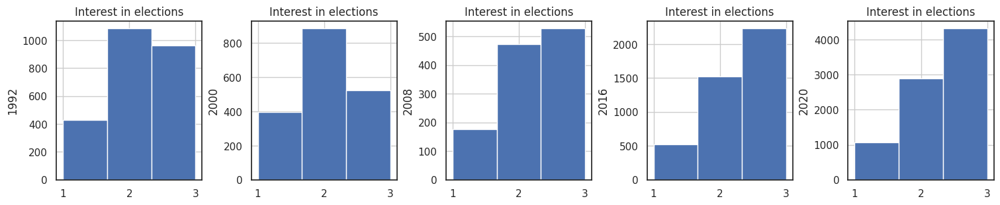

In [25]:
length = len(dataframes)
for col in dataframes[0]:  
    _, axs = plt.subplots(1, length, figsize=(3*length,3), constrained_layout=True)
    for i in range(length):
        axs[i].set_title(yearsSubset[i])
        axs[i].set_ylabel(yearsSubset[i])
        uniq = dataframes[i][col].unique() 
        uniq = uniq[~np.isnan(uniq)]
        nbins = math.floor(max(uniq) - min(uniq))
        dataframes[i].hist(column=col, bins = nbins + 1, ax=axs[i])
    break

## Missing deletion

In [26]:
missingThreshold = 0.2
dataframesOriginal = dataframes.copy()


# Redefine numerical options within the interval [0,1]
for i in range(len(dataframes)):
    dataframes[i] = (dataframes[i] - dataframes[i].min())/(dataframes[i].max() - dataframes[i].min())


# Numerical ordering for each year according to the missing rate of 1992
for i in range(len(dataframes)):
    dataframesOriginal[i] = dataframesOriginal[i].reindex((dataframes[0].isna().sum()/len(dataframes[i])).sort_values(ascending=False, kind='mergesort').index, axis=1)
    dataframes[i] = dataframes[i].reindex((dataframes[0].isna().sum()/len(dataframes[i])).sort_values(ascending=False, kind='mergesort').index, axis=1)

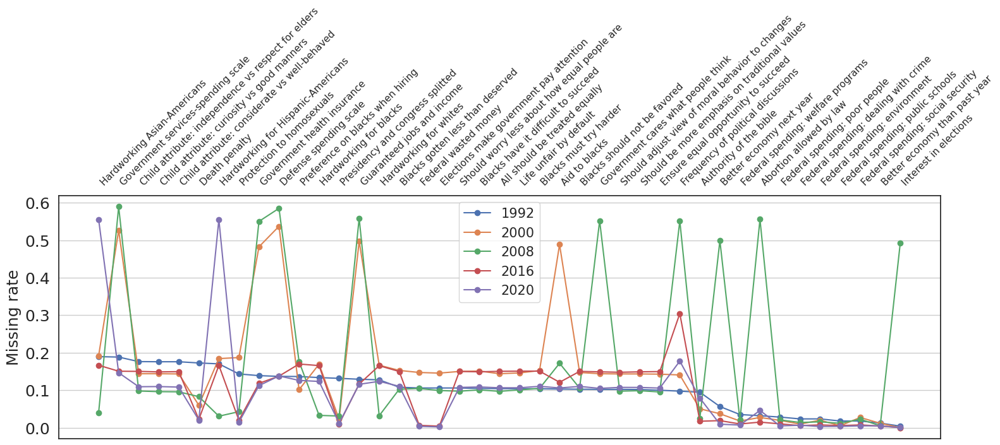

In [27]:
fig, ax = plt.subplots(figsize=(18, 5))
for i in range(len(dataframes)):
    cols = dataframes[i].columns
    y = list(dataframes[i].isna().sum()/len(dataframes[i]))

    plt.tick_params(labelbottom=False, labeltop=True)
    plt.setp(ax.get_xticklabels(), rotation=45, horizontalalignment='left')
    ax.plot(cols,y, '-o', label=str(yearsSubset[i]))
#    plt.title("missings")
    plt.ylabel('Missing rate', fontsize=18)
    plt.yticks(fontsize=18)
plt.grid(axis='y')
plt.legend(loc='best', fontsize=15)
#plt.savefig('../missing_rates.pdf', bbox_inches="tight")

Let's drop.

29


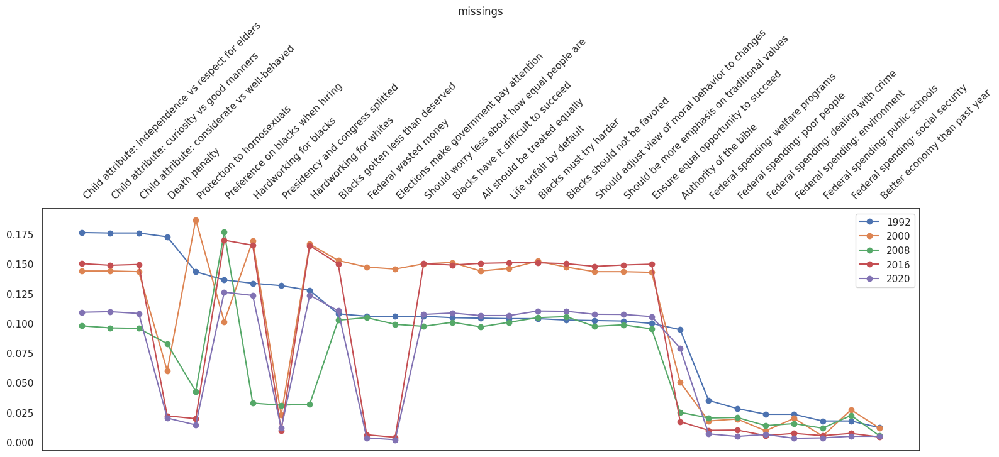

In [28]:
for _ in range(2): # for some reason a variable is not dropped the first time
    todrop=list()
    for i in range(len(dataframes)):
        cols = dataframes[i].columns
        rate = list(dataframes[i].isna().sum()/len(dataframes[i]))
        # print([cols[rate.index(x)] for x in rate if x >=missingThreshold])
        todrop.append([cols[rate.index(x)] for x in rate if x >=missingThreshold]) # variables exceding threshold
    
    todrop = np.unique(np.concatenate(todrop, axis=0))
    for i in range(len(dataframes)):
        # drop variables
        dataframes[i].drop(todrop, axis=1, inplace=True)
print(len(dataframes[0].columns))


fig, ax = plt.subplots(figsize=(18, 5))
for i in range(len(dataframes)):
    cols = dataframes[i].columns
    y = list(dataframes[i].isna().sum()/len(dataframes[i]))

    plt.tick_params(labelbottom=False,labeltop=True)
    plt.setp(ax.get_xticklabels(), rotation=45, horizontalalignment='left')
    ax.plot(cols,y, '-o', label=str(yearsSubset[i]))
    plt.title("missings")
plt.legend()

In [29]:
# Now for the original data
for _ in range(2):
    todrop=list()
    for i in range(len(dataframesOriginal)):
        cols = dataframesOriginal[i].columns
        rate = list(dataframesOriginal[i].isna().sum()/len(dataframesOriginal[i]))
        todrop.append([cols[rate.index(x)] for x in rate if x >=missingThreshold]) # variables exceding threshold
    
    todrop = np.unique(np.concatenate(todrop, axis=0))
    for i in range(len(dataframesOriginal)):
        # drop variables
        dataframesOriginal[i].drop(todrop, axis=1, inplace=True)
print(len(dataframesOriginal[0].columns))

29


(array([13.,  3., 11.,  0.,  2.]),
 array([2.5, 3.5, 4.5, 5.5, 6.5, 7.5]),
 <BarContainer object of 5 artists>)

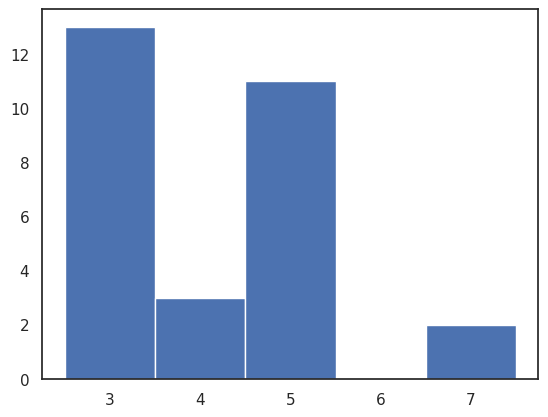

In [47]:
options = []
for i in range(len(dataframesOriginal)):
    options.append(dataframesOriginal[i].max())

plt.hist(options[0][:], bins=np.arange(2.5, 8.5))

Missing imputation with KNN.

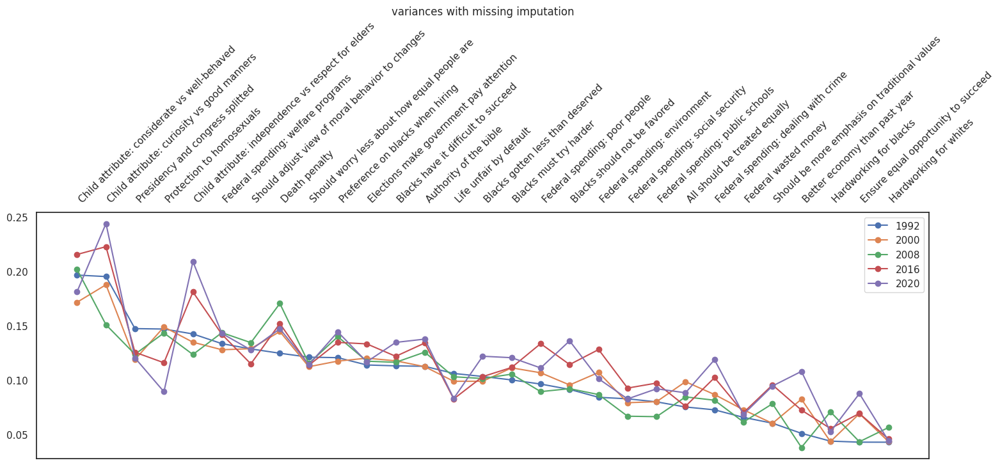

In [29]:
sys.setrecursionlimit(100000) # increase the recursion limit of the OS
cols = dataframes[0].columns

# Start the KNN training
for i in range(len(dataframes)):
    imputer = KNNImputer(n_neighbors=1, weights="uniform")
    imputed_training = imputer.fit_transform(dataframes[i])
    dataframes[i] = pd.DataFrame(imputed_training, columns=cols)


# Numerical ordering for each year according to the variance of the 1992-data
for i in range(len(dataframes)):
    dataframes[i] = dataframes[i].reindex(dataframes[0].var().sort_values(ascending=False).index, axis=1)


fig, ax = plt.subplots(figsize=(18, 5))
for i in range(len(dataframes)):
    cols = dataframes[i].columns
    y = list(dataframes[i].var())

    plt.tick_params(labelbottom=False,labeltop=True)
    plt.setp(ax.get_xticklabels(), rotation=45, horizontalalignment='left')
    ax.plot(cols,y, '-o', label=str(yearsSubset[i]))
    plt.title("variances with missing imputation")
plt.legend()

# Low dimensional embedding

Addition of attributes to the collection of questions.

In [30]:
def copyDataframeArray(arr):
    """ Copy list of dataframes by value

    Parameters:
    arr -- list of dataframes
    """
    result = list()
    for i in range(len(arr)):
        result.append(arr[i].copy())
    return result

In [31]:
dataframesWithAttributes = copyDataframeArray(dataframes)
dataframesWithAttributesSplit = copyDataframeArray(dataframes)

In [32]:
# Reducing population for years with population greater than 2500
tot = 2500
random.seed(9708 + 0)
todrop = list()
for i in range(len(yearsSubset)):
    NN = len(dataframesWithAttributesSplit[i])
    if NN <= tot:
        todrop.append(list())
    else:
        todrop.append(random.sample(range(NN), NN - tot))
    dataframesWithAttributesSplit[i].drop(todrop[i], inplace=True)
    # Relabel index
    index = list(dataframesWithAttributesSplit[i].index.values)
    relabel = {}
    for j in range(len(index)):
        relabel.update({index[j]: j})
    dataframesWithAttributesSplit[i].rename(index=relabel, inplace=True)

In [33]:
# Party
for i in range(len(yearsSubset)):
    year = yearsSubset[i]
    addGroup = data.query("VCF0004 == @year").VCF0303
    addGroup = pd.to_numeric(addGroup, errors='coerce') # some codes are in integer format, others in float format
    addGroup = list(addGroup)
    # Removing
    for j in sorted(todrop[i], reverse=True):
        del addGroup[j]
    dataframesWithAttributesSplit[i]["party"] = addGroup
    dataframesWithAttributesSplit[i].party = dataframesWithAttributesSplit[i].party.replace([0.0,1.0,2.0,3.0],["DK","Democrats","Independents","Republicans"]) # DK = Dont know, missing values

# Age
for i in range(len(yearsSubset)):
    year = yearsSubset[i]
    addGroup = data.query("VCF0004 == @year").VCF0102
    addGroup = pd.to_numeric(addGroup, errors='coerce')
    addGroup = list(addGroup)
    # Removing
    for j in sorted(todrop[i], reverse=True):
        del addGroup[j]
    dataframesWithAttributesSplit[i]["age"] = addGroup
    dataframesWithAttributesSplit[i]["age"] = dataframesWithAttributesSplit[i]["age"].replace([0,1,2,3,4,5,6,7],['DK','17-34', '17-34','35-54','35-54','55+','55+','55+'])

# Class
for i in range(len(yearsSubset)):
    year = yearsSubset[i]
    addGroup = data.query("VCF0004 == @year").VCF0148a
    addGroup = pd.to_numeric(addGroup, errors='coerce')
    addGroup = list(addGroup)
    # Removing
    for j in sorted(todrop[i], reverse=True):
        del addGroup[j]
    dataframesWithAttributesSplit[i]["class"] = addGroup
    dataframesWithAttributesSplit[i]["class"] = dataframesWithAttributesSplit[i]["class"].replace([1,2,3,4,5,6,9],['Working','Working','Working','Middle','Middle','Middle','DK'])

# Etnicity
for i in range(len(yearsSubset)):
    year = yearsSubset[i]
    addGroup = data.query("VCF0004 == @year").VCF0106
    addGroup = pd.to_numeric(addGroup, errors='coerce')
    addGroup = list(addGroup)
    # Removing
    for j in sorted(todrop[i], reverse=True):
        del addGroup[j]
    dataframesWithAttributesSplit[i]["race"] = addGroup
    dataframesWithAttributesSplit[i]["race"] = dataframesWithAttributesSplit[i]["race"].replace([1,2,3,0,9],['White','Black','DK','DK','DK'])

# Gender
for i in range(len(yearsSubset)):
    year = yearsSubset[i]
    addGroup = data.query("VCF0004 == @year").VCF0104
    addGroup = pd.to_numeric(addGroup, errors='coerce')
    addGroup = list(addGroup)
    # Removing
    for j in sorted(todrop[i], reverse=True):
        del addGroup[j]
    dataframesWithAttributesSplit[i]["gender"] = addGroup
    dataframesWithAttributesSplit[i]["gender"] = dataframesWithAttributesSplit[i]["gender"].replace([1,2,3],['Male','Female','DK'])

# Income
for i in range(len(yearsSubset)):
    year = yearsSubset[i]
    addGroup = data.query("VCF0004 == @year").VCF0114
    addGroup = pd.to_numeric(addGroup, errors='coerce')
    addGroup = list(addGroup)
    # Removing
    for j in sorted(todrop[i], reverse=True):
        del addGroup[j]
    dataframesWithAttributesSplit[i]["affluence"] = addGroup
    dataframesWithAttributesSplit[i]["affluence"] = dataframesWithAttributesSplit[i]["affluence"].replace([1,2,3,4,5,0],['Low-Income','Low-Income','34-66%','High-Income','High-Income','DK']) # poor = 0-33%, rich = 67-100%

# Education
for i in range(len(yearsSubset)):
    year = yearsSubset[i]
    addGroup = data.query("VCF0004 == @year").VCF0140
    addGroup = pd.to_numeric(addGroup, errors='coerce')
    addGroup = list(addGroup)
    # Removing
    for j in sorted(todrop[i], reverse=True):
        del addGroup[j]
    dataframesWithAttributesSplit[i]["education"] = addGroup
    dataframesWithAttributesSplit[i]["education"] = dataframesWithAttributesSplit[i]["education"].replace([1,2,3,4,5,6,8,9],['No-College','No-College','No-College','No-College','College','College','DK','DK'])

In [34]:
# All subsets' dataframes into a single one
dfsCombined = pd.concat(dataframesWithAttributesSplit)
dfsCombined = dfsCombined.reset_index(drop=True)

In [35]:
separator = dfsCombined.columns.get_loc('party')
features = dfsCombined.iloc[:, :separator]

## PCA

Generation of the embedding.
<br>
MDS and PCA behave the same, since both measure distances within an Euclidean metric.
<br>
Very similar results to the ones obtained with ISOMAP (?).

In [36]:
def customPCA(dfs, dim=2):
    """ Data dimensionality reduction using PCA

    Parameters:
    dfs -- dataframe containing all users
    dim -- number of dimensions of the generated embedding
    """
    
    separator = dfs.columns.get_loc('party')
    features = dfs.iloc[:, :separator].values
    x = StandardScaler().fit_transform(features)
    pca = PCA(n_components=dim)
    principalComponents = pca.fit_transform(x)
    print(f"explained variance {sum(pca.explained_variance_ratio_)}")
    return principalComponents

In [37]:
points2dPCA = customPCA(dfs=dfsCombined, dim=2) # get 2d-points in the embedding

explained variance 0.2726455028985373


## ISOMAP

Generation of the embedding.
<br>
ISOMAP coordinates are tricky. Due to the structure of the data, having no gaps, Euclidean and geodesic distances are very similar.
<br>
Using geodesic distance is not always possible, such as the application of the null model simulation.

In [36]:
def customISOMAP(dfs, dim, k):
    """ Data dimensionality reduction using ISOMAP

    Parameters:
    dfs -- dataframe containing all users
    dim -- number of dimensions of the generated embedding
    k -- number of neighbors
    """

    iso = manifold.Isomap(
        n_neighbors=k, 
        n_components=dim, 
        n_jobs=-1,
        path_method='D',
        eigen_solver='dense'
        )

    separator = dfs.columns.get_loc('party') # only considers columns previous to 'party'
    features = dfs.iloc[:, :separator]

    proj_2d = iso.fit_transform(features)
    return proj_2d

In [37]:
points2d = customISOMAP(dfs=dfsCombined, dim=2, k=10) # get 2d-points in the embedding

Density map.

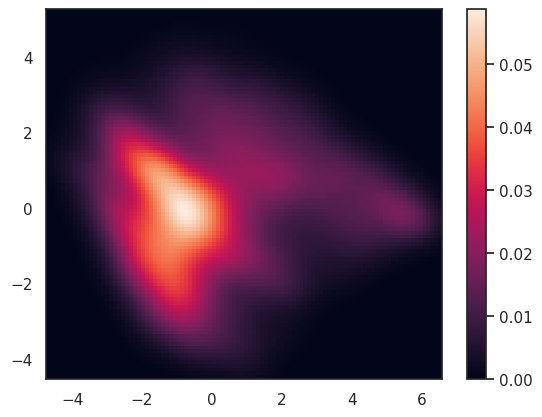

In [38]:
# x,y coordinates of 2d-points
x = points2d[:,0]
y = points2d[:,1]


nbins = 100
k = gaussian_kde([x,y])
xi, yi = np.mgrid[x.min():x.max():nbins*1j, y.min():y.max():nbins*1j]
zi = k(np.vstack([xi.flatten(), yi.flatten()]))
 
plt.pcolormesh(xi, yi, zi.reshape(xi.shape), shading='auto')
plt.colorbar()
plt.show()

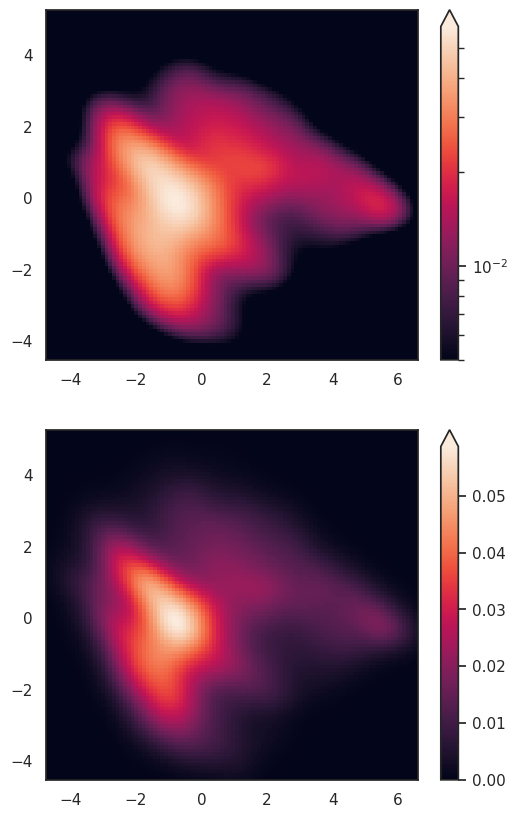

In [39]:
fig, ax = plt.subplots(2,1, figsize=(6,10))

Z = zi.reshape(xi.shape)
Z2 = np.array([])
thres = 5e-3
for d in zi:
    if d > thres:
        Z2 = np.append(Z2, d)
    else:
        Z2 = np.append(Z2, thres)
Z2 = Z2.reshape(Z.shape)

pcm = ax[0].pcolor(xi, yi, Z2, norm=colors.LogNorm(vmin=Z2.min(), vmax=Z2.max()), shading='auto')
fig.colorbar(pcm, ax=ax[0], extend='max')

pcm = ax[1].pcolor(xi, yi, Z, shading='auto')
fig.colorbar(pcm, ax=ax[1], extend='max')

plt.show()

Interactive plot.

In [40]:
def interactivePlot(dfs, points2d, categ, title): 
    """ Generate interactive plot

    Parameters:
    dfs -- dataframe containing all users
    points2d -- 2d coordinates for all users in dfs
    categ -- attribute to plot
    title -- title of the plot
    """

    if categ not in dfs.columns:
        return

    labels = list(dfs[categ])

    fig_2d = px.scatter(
        points2d, x=0, y=1, width=700, height=500,
        custom_data=[labels], 
            title=title,
        color=labels , labels={'color': 'Question'}
    )

    fig_2d.update_traces(
        hovertemplate="<br>".join([
            "Question: %{customdata[0]}"
        ])
    )

    fig_2d.show()

In [41]:
interactivePlot(dfsCombined, points2d, 'party', 'By partisanship') # a different one for every attribute

## Classification task

Prediction via logistic regression before doing embedding.

In [45]:
# Drop DK and Independents
featuresTarget = features.copy()
politics = np.array(dfsCombined['party'])
targetTrain = list()
todrop = list()
for i,part in enumerate(politics):
    if part == 'Democrats':
        targetTrain.append(0)
    elif part == 'Republicans':
        targetTrain.append(1)
    else:
        todrop.append(i)
todrop = np.sort(todrop)[::-1]
featuresTarget.drop(todrop, inplace=True)

# Relabel index
index = list(featuresTarget.index.values)
relabel = {}
for j in range(len(index)):
    relabel.update({index[j]: j})
featuresTarget.rename(index=relabel, inplace=True)

# Training set of 10000 samples
target = targetTrain.copy()
featuresTrain = featuresTarget.copy()
random.seed(9708 + 1)
todropTrain = np.sort(random.sample(range(len(featuresTrain)), len(featuresTrain) - 8092))[::-1]
featuresTrain.drop(todropTrain, inplace=True)
for index in todropTrain:
    targetTrain.pop(index)

In [46]:
print(features.shape, featuresTarget.shape, featuresTrain.shape)

(11614, 29) (10115, 29) (8092, 29)


In [47]:
LogReg = LogisticRegression(random_state=0).fit(featuresTrain, targetTrain)

In [48]:
featuresPredict = pd.DataFrame(data={})
targetPredict = list()
for index in todropTrain:
    featuresPredict = pd.concat([featuresPredict, featuresTarget.iloc[index]], ignore_index=True, axis=1)
    targetPredict.append(target[index])
featuresPredict = featuresPredict.T

In [49]:
LogReg.score(featuresPredict, targetPredict)

0.7582797825012358

In [50]:
LogReg.coef_

array([[-0.15864253, -0.22735514, -0.03990824, -0.15290576,  0.13156209,
        -0.59589487, -0.6998275 ,  0.77716297,  0.42445613, -0.51946214,
        -0.05047074, -0.11670777,  0.25473153,  0.25410887, -0.55829769,
         0.33651884, -0.88385525,  0.24020963, -0.96878354, -0.71508662,
        -0.53345382, -0.67620364,  0.30288643,  0.21525096,  0.82647393,
         0.3601275 , -0.03653742, -0.65943537,  0.1809423 ]])

After doing embedding (PCA).

In [51]:
# Drop DK and Independents
featuresTarget = points2dPCA.copy()
for index in todrop:
    featuresTarget = np.delete(featuresTarget, index, 0)

# Training set of 10000 samples
featuresTrain = featuresTarget.copy()
for index in todropTrain:
    featuresTrain = np.delete(featuresTrain, index, 0)

print(points2dPCA.shape, featuresTarget.shape, featuresTrain.shape)

(11614, 2) (10115, 2) (8092, 2)


In [52]:
LogReg = LogisticRegression(random_state=0).fit(featuresTrain, targetTrain)
featuresPredict = np.take(featuresTarget, todropTrain, axis=0)
LogReg.score(featuresPredict, targetPredict)

0.7488877904102818

In [53]:
np.arctan2(LogReg.coef_[0][1], LogReg.coef_[0][0])*180./np.pi

152.91811548163295

After doing embedding (ISOMAP).

In [54]:
# Drop DK and Independents
featuresTarget = points2d.copy()
for index in todrop:
    featuresTarget = np.delete(featuresTarget, index, 0)

# Training set of 10000 samples
featuresTrain = featuresTarget.copy()
for index in todropTrain:
    featuresTrain = np.delete(featuresTrain, index, 0)

print(points2d.shape, featuresTarget.shape, featuresTrain.shape)

(11614, 2) (10115, 2) (8092, 2)


In [55]:
LogReg = LogisticRegression(random_state=0).fit(featuresTrain, targetTrain)
featuresPredict = np.take(featuresTarget, todropTrain, axis=0)
LogReg.score(featuresPredict, targetPredict)

0.7394957983193278

In [56]:
np.arctan2(LogReg.coef_[0][1], LogReg.coef_[0][0])*180./np.pi

129.33095426453852

## Cross-validation

Prediction via logistic regression before doing embedding.

In [57]:
# Drop DK and Independents
featuresTarget = features.copy()
politics = np.array(dfsCombined['party'])
target = list()
todrop = list()
for i,part in enumerate(politics):
    if part == 'Democrats':
        target.append(0)
    elif part == 'Republicans':
        target.append(1)
    else:
        todrop.append(i)
todrop = np.sort(todrop)[::-1]
featuresTarget.drop(todrop, inplace=True)

# Relabel index
index = list(featuresTarget.index.values)
relabel = {}
for j in range(len(index)):
    relabel.update({index[j]: j})
featuresTarget.rename(index=relabel, inplace=True)

In [58]:
LogReg = LogisticRegression(random_state=0)
scores = cross_val_score(LogReg, featuresTarget, target, cv=10)
print("Accuracy: %0.3f    Std: %0.3f" % (scores.mean(), scores.std()))

Accuracy: 0.760    Std: 0.058


After doing embedding (PCA).

In [59]:
# Drop DK and Independents
featuresTarget = points2dPCA.copy()
for index in todrop:
    featuresTarget = np.delete(featuresTarget, index, 0)

LogReg = LogisticRegression(random_state=0)
scores = cross_val_score(LogReg, featuresTarget, target, cv=10)
print("Accuracy: %0.3f    Std: %0.3f" % (scores.mean(), scores.std()))

Accuracy: 0.756    Std: 0.055


After doing embedding (ISOMAP).

In [60]:
# Drop DK and Independents
featuresTarget = points2d.copy()
for index in todrop:
    featuresTarget = np.delete(featuresTarget, index, 0)

LogReg = LogisticRegression(random_state=0)
scores = cross_val_score(LogReg, featuresTarget, target, cv=10)
print("Accuracy: %0.3f    Std: %0.3f" % (scores.mean(), scores.std()))

Accuracy: 0.753    Std: 0.057


In [61]:
sum(target)/len(target)

0.4244191794364805

## Finding centers

Graphic location.

In [42]:
def meanPoints(coords):
    """ Get mean point 'center' for N-dimensional set of points 
    
    Parameters:
    coords: list of coordinates
    """
    res = list()
    for i in range(len(coords[0])):
        res.append(np.mean(coords[:,i]))
    return tuple(res)
    # return (np.mean(coords[:,0]), np.mean(coords[:,1])) 2d


def differByAttAndplotCenters(data, points2d, id, attributes, title, plotGeneral=True, plotIntermediates = False):
    """ Get all the users' locations for every community in an attribute, and plots the respective centers 

    Parameters:
    data -- dataframe containing all users
    points2d -- 2d coordinates for all users in data
    id -- attribute to plot
    attributes -- communities within an attribute
    title -- title of the plot
    plotGeneral -- plot centers of all years
    plotIntermediates -- plot centers of every year individually
    """
    # points2d contains the points for all years, let's locate the year they belong to
    separators = list()
    for i in range(len(yearsSubset)):
        separators.append(len(data[i]))
    separators = [0] + separators
    cumulativeSeparators = list(np.cumsum(separators))


    points2dByYear = list()
    for i in range(len(yearsSubset)):
        points2dByYear.append(points2d[cumulativeSeparators[i]:cumulativeSeparators[i+1]])

    dens_perCategory = list()
    for cat in range(len(points2dByYear)):
        categInYear = list(data[cat][id])
        separator = data[0].columns.get_loc('party')
        indicators = data[0].columns[separator:]
        axx = {x:[] for x in data[0][indicators[indicators.get_loc(id)]]}
        for j in range(len(points2dByYear[cat])):
            for key in axx:
                if categInYear[j] == key:
                    axx[key].append(points2dByYear[cat][j])
        dens_perCategory.append(axx)
        
    
    markers = ['v', 'X', 'o', '$A$', '$B$', '$C$', '$D$', '$E$']
    colors = ["lightblue", "orange", "green", "violet", 'blue', 'yellow']
    fig, axs = plt.subplots(1, len(yearsSubset), figsize=(32, 8))

    fig.suptitle(f"{attributes[0]} against {attributes[1]}")
    fig.suptitle(title)
    users = list()
    centroid = list()
    for i in range(len(yearsSubset)):
        for att in range(len(attributes)):
            
            users.append(np.array(dens_perCategory[i][str(attributes[att])]))
            centroid.append(meanPoints(users[-1]))
            try:
                x = users[-1][:,0]
                y = users[-1][:,1]
                axs[i].scatter(x,y, s=10, color=colors[att])
                axs[i].set_title(str(yearsSubset[i]))
            except:
                pass
        custom_lines = [Line2D([0], [0], color=colors[c], lw=4) for c in range(len(colors))]
        axs[i].legend(custom_lines, attributes)

    for i in range(len(yearsSubset) * len(attributes)):
            axs[math.floor(i/len(attributes))].scatter(centroid[i][0], centroid[i][1], edgecolors='black', s=500, marker=markers[i % len(attributes)], color=colors[i % len(attributes)])

    if (plotIntermediates):
        plt.show()
    else:
        plt.close()

    if plotGeneral:
        fig, axs = plt.subplots(1, 1, figsize=(6, 6))
        fig.suptitle(f"{title}:  {attributes[0]} against {attributes[1]}")
        axs.scatter(points2d[:,0], points2d[:,1], s=10,color='lightcoral')
        for i in range(len(yearsSubset) * len(attributes)):
            axs.scatter(centroid[i][0], centroid[i][1], s=200, edgecolors='black', marker=markers[i % len(attributes)], color=colors[math.floor(i/len(attributes))])

            custom_lines = [Line2D([0], [0], color=colors[c], lw=4) for c in range(len(colors))]
            axs.legend(custom_lines, yearsSubset, fontsize="large")
        plt.show()

    return dens_perCategory

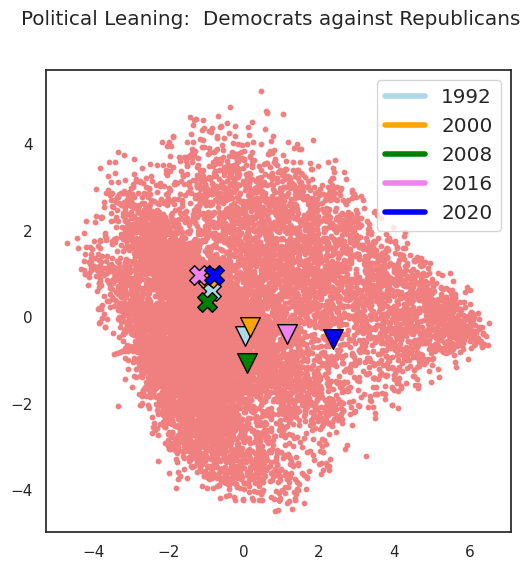

In [43]:
dens_perParty       = differByAttAndplotCenters(dataframesWithAttributesSplit, points2d, id='party', attributes = ['Democrats', 'Republicans'], title='Political Leaning', plotGeneral=True, plotIntermediates=False)
dens_perAge         = differByAttAndplotCenters(dataframesWithAttributesSplit, points2d, id='age', attributes = ['17-34', '55+'], title='Age', plotGeneral=False, plotIntermediates=False)
#dens_perClass       = differByAttAndplotCenters(dataframesWithAttributesSplit, points2d, id='class', attributes = ['Working', 'Middle'], title='Social Class', plotGeneral=False, plotIntermediates=False)
dens_perRace        = differByAttAndplotCenters(dataframesWithAttributesSplit, points2d, id='race', attributes = ['White', 'Black'], title='Ethnicity', plotGeneral=False, plotIntermediates=False)
dens_perSex         = differByAttAndplotCenters(dataframesWithAttributesSplit, points2d, id='gender', attributes = ['Male', 'Female'], title='Gender', plotGeneral=False, plotIntermediates=False)
dens_perIncome      = differByAttAndplotCenters(dataframesWithAttributesSplit, points2d, id='affluence', attributes = ['Low-Income', 'High-Income'], title='Affluence', plotGeneral=False, plotIntermediates=False)
dens_perEducation   = differByAttAndplotCenters(dataframesWithAttributesSplit, points2d, id='education', attributes = ['No-College', 'College'], title='Education', plotGeneral=False, plotIntermediates=False)

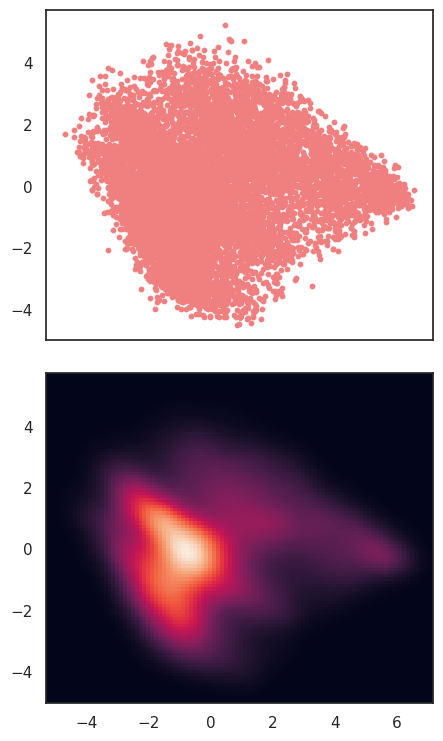

In [44]:
fig, ax = plt.subplots(2,1, sharex = True, figsize = (5,9))
fig.subplots_adjust(hspace=0.1)

ax[0].scatter(points2d[:,0], points2d[:,1], s=10, color='lightcoral')

# x,y coordinates of 2d-points
x = points2d[:,0]
y = points2d[:,1]

nbins = 100
k = gaussian_kde([x,y])
#xi, yi = np.mgrid[x.min():x.max():nbins*1j, y.min():y.max():nbins*1j]
xmin, xmax = ax[0].get_xlim()
ymin, ymax = ax[0].get_ylim()
xi, yi = np.mgrid[xmin:xmax:nbins*1j, ymin:ymax:nbins*1j]
zi = k(np.vstack([xi.flatten(), yi.flatten()]))
 
im = ax[1].pcolormesh(xi, yi, zi.reshape(xi.shape), shading='auto')
#fig.colorbar(im, ax=ax[1])
#plt.show()
#plt.savefig('../embedding_2.pdf', bbox_inches="tight")

In [45]:
def redBlueHeatmap(points2d, attributes, dens_perGroup, attName):
    """ Plot dominance map, how dominant are two communities within an attribute in every sector of the embedding

    Parameters:
    points2d -- 2d coordinates for all users
    attributes -- pair of communities in an attribute to plot
    dens_perGroup -- attribute density to plot
    attName -- attribute name
    """
    # only consider if attribute length is 2
    if (len(attributes)!= 2):
        return

    # find bounding box
    points2d[:,0]
    bbox = {
        'minX': np.min(points2d[:,0]),
        'maxX': np.max(points2d[:,0]),
        'minY': np.min(points2d[:,1]),
        'maxY': np.max(points2d[:,1])
    }
    plotRangeX = np.arange(
        math.floor(bbox['minX'] - 0.5),
        math.ceil(bbox['maxX'] + 1),
        0.5)
    plotRangeY = np.arange(
        math.floor(bbox['minY'] - 0.5),
        math.ceil(bbox['maxY'] + 1),
        0.5)

    # custom color map
    cmap_reversed = matplotlib.cm.get_cmap('seismic').reversed()
    cmap_reversed.set_bad('lightgray', 1.)

    # generate the plot
    for i in range(len(yearsSubset)):
        fig, ax = plt.subplots(figsize=(15,12))
        lsD = np.array(dens_perGroup[i][attributes[0]])
        lsD = np.round(lsD, decimals=3)
        x = lsD[:,0]
        y = lsD[:,1]
        histDem, xbinsDem, ybinsDem, imDem = ax.hist2d(x,y, bins=[plotRangeX,plotRangeY], cmap = 'plasma')
        plt.close()

        ls = np.array(dens_perGroup[i][attributes[0]] + dens_perGroup[i][attributes[1]])
        l = len(ls)
        ls = np.round(ls, decimals=3)
        fig, ax = plt.subplots(figsize=(15,12))

        x = ls[:,0]
        y = ls[:,1]

        hist, xbins, ybins, im = ax.hist2d(x,y, bins=[plotRangeX,plotRangeY], cmap = 'plasma')
        plt.close()
        hist = histDem / hist 
        masked_array = np.ma.array (hist, mask=np.isnan(hist))

        plt.figure(figsize=(6,6))
        plt.title(str(yearsSubset[i]) + "    Placement by " + str(attName))
        plt.imshow(np.flip(masked_array.T, axis=0), interpolation='nearest', cmap=cmap_reversed)
        plt.axis('off')
        cbar = plt.colorbar(shrink=0.8,ticks=[0,0.5,1])
        cbar.ax.set_yticklabels([attributes[1], '', attributes[0]])
        plt.show()

/tmp/ipykernel_69940/1864033166.py:55: RuntimeWarning:

invalid value encountered in true_divide



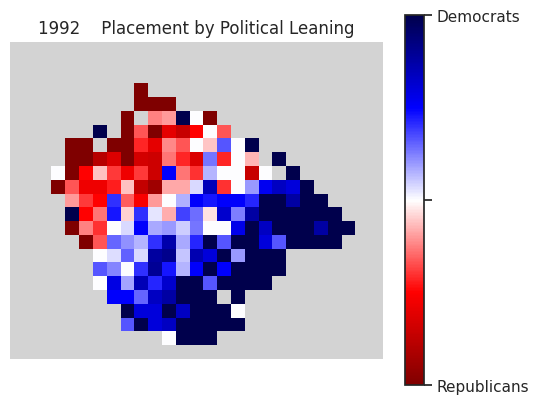

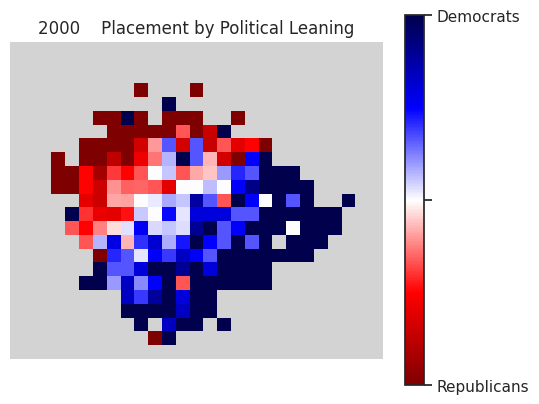

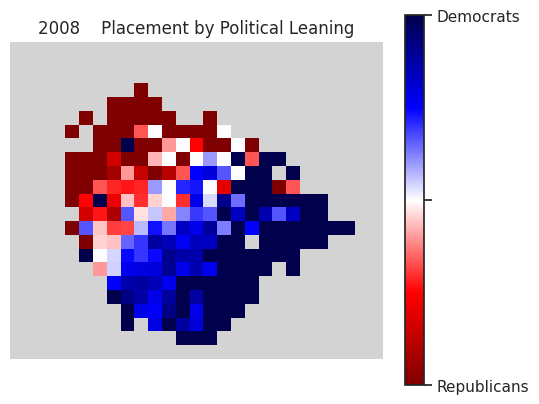

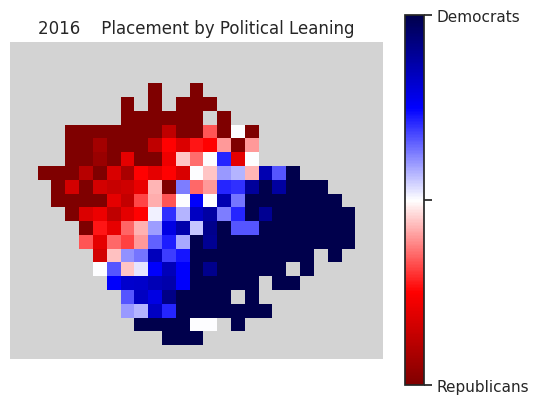

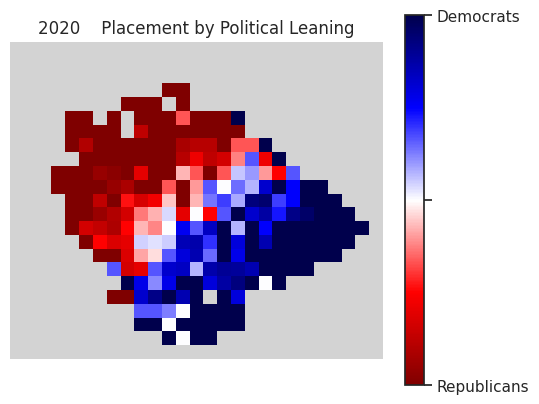

In [46]:
redBlueHeatmap(points2d, attributes = ['Democrats','Republicans'], dens_perGroup=dens_perParty, attName='Political Leaning')
# redBlueHeatmap(points2d, attributes = ['Working','Middle'], dens_perGroup=dens_perClass, attName='class')
# redBlueHeatmap(points2d, attributes = ['17-34', '55+'], dens_perGroup=dens_perAge, attName='age')
# redBlueHeatmap(points2d, attributes = ['White', 'Black'], dens_perGroup=dens_perRace, attName='ethnicity')
# redBlueHeatmap(points2d, attributes = ['Male', 'Female'], dens_perGroup=dens_perSex, attName="gender")
# redBlueHeatmap(points2d, attributes = ['Low-Income', 'High-Income'], dens_perGroup=dens_perIncome, attName="affluence")
# redBlueHeatmap(points2d, attributes = ['College', 'No-College'], dens_perGroup=dens_perEducation, attName="education")

In [47]:
attributesData = { # variable containing every attributes' data
    'party': dens_perParty,
#    'class': dens_perClass,
    'race': dens_perRace,
    'gender': dens_perSex,
    'age': dens_perAge,
    'affluence': dens_perIncome,
    'education': dens_perEducation
}

subcats = { # communities within each attribute
    'party': ['Democrats', 'Republicans'],
#    'class': ['Middle', 'Working'],
    'race': ['Black', 'White'],
    'gender': ['Female', 'Male'],
    'age': ['17-34', '55+'],
    'affluence': ['Low-Income', 'High-Income'],
    'education': ['No-College', 'College']
}

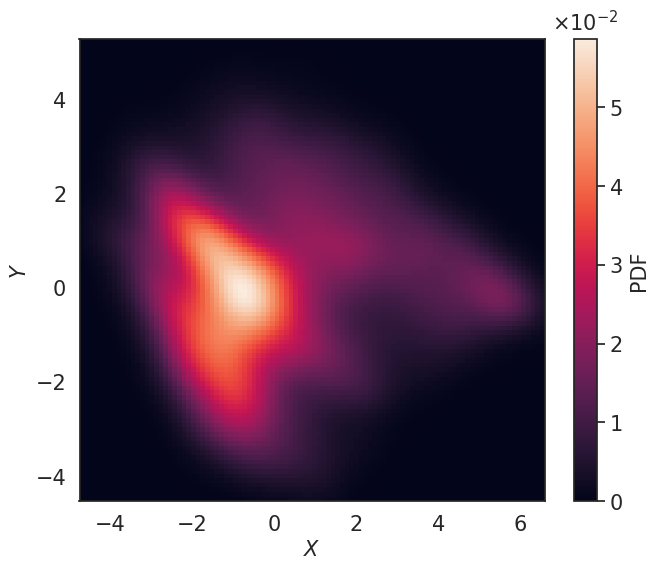

In [48]:
# x,y coordinates of 2d-points
x = points2d[:,0]
y = points2d[:,1]


nbins = 100
k = gaussian_kde([x,y])
xi, yi = np.mgrid[x.min():x.max():nbins*1j, y.min():y.max():nbins*1j]
zi = k(np.vstack([xi.flatten(), yi.flatten()]))

markers = ['$A$', '$B$', '$C$', '$D$', '$E$']
plt.figure(figsize=(7.5,6))
plt.pcolormesh(xi, yi, zi.reshape(xi.shape), shading='auto')
cbar = plt.colorbar(ticks=[0.00, 0.01, 0.02, 0.03, 0.04, 0.05])
cbar.ax.set_yticklabels(['0', '1', '2', '3', '4', '5'])
cbar.ax.tick_params(labelsize=15)
cbar.ax.set_title(r'$\mathregular{\times 10^{-2}}$', fontsize=15)
cbar.ax.set_ylabel('PDF', fontsize=15)

#plt.axis('off')
#plt.axis('equal')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('$X$', fontsize=15)
plt.ylabel('$Y$', fontsize=15)
plt.show()
#plt.savefig('../embedding.pdf', bbox_inches="tight")

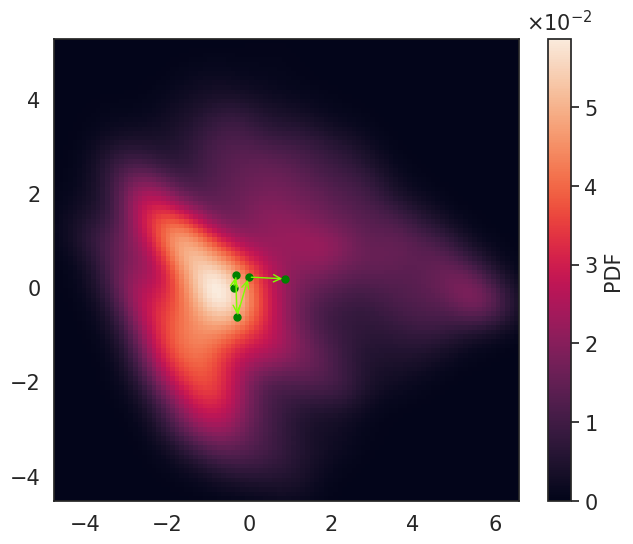

In [49]:
centerGlob = np.array([[0,0]])
for k in range(len(yearsSubset)):
    attributesYear = np.array([[0,0]])
    for sub in np.array(list(attributesData['party'][k].keys())):
        attributesYear = np.concatenate((attributesYear, attributesData['party'][k][sub]), axis=0)
    attributesYear = np.delete(attributesYear, 0, axis=0)
    center = meanPoints(attributesYear)
    centerGlob = np.concatenate((centerGlob, [np.array(center)]), axis=0)
centerGlob = np.delete(centerGlob, 0, axis=0)

# x,y coordinates of 2d-points
x = points2d[:,0]
y = points2d[:,1]


nbins = 100
k = gaussian_kde([x,y])
xi, yi = np.mgrid[x.min():x.max():nbins*1j, y.min():y.max():nbins*1j]
zi = k(np.vstack([xi.flatten(), yi.flatten()]))

markers = ['$A$', '$B$', '$C$', '$D$', '$E$']
plt.figure(figsize=(7.5,6))
plt.pcolormesh(xi, yi, zi.reshape(xi.shape), shading='auto')
cbar = plt.colorbar(ticks=[0.00, 0.01, 0.02, 0.03, 0.04, 0.05])
cbar.ax.set_yticklabels(['0', '1', '2', '3', '4', '5'])
cbar.ax.tick_params(labelsize=15)
cbar.ax.set_title(r'$\mathregular{\times 10^{-2}}$', fontsize=15)
cbar.ax.set_ylabel('PDF', fontsize=15)

# Arrows
for k in range(len(yearsSubset)):
    plt.scatter(centerGlob[k,0], centerGlob[k,1], marker='.', c='green', s=100)
for k in range(len(yearsSubset) - 1):
    plt.annotate('', xy=centerGlob[k+1], xytext=centerGlob[k], 
                 arrowprops={'arrowstyle': '->', 'mutation_scale': 13, 'color': 'chartreuse'}, va='center')

#plt.axis('off')
#plt.axis('equal')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()
#plt.savefig('../embedding.pdf', bbox_inches="tight")

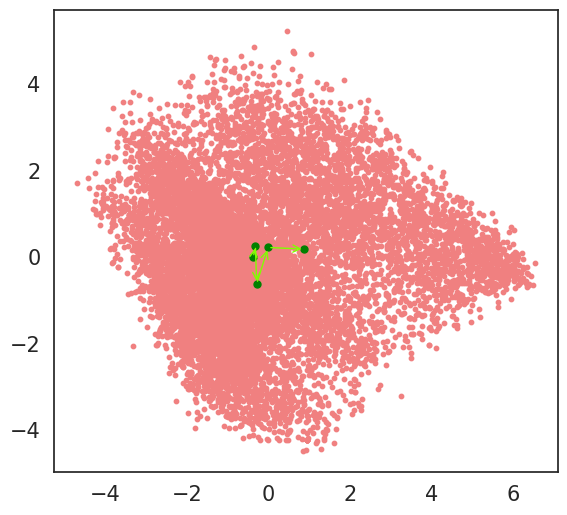

In [50]:
fig, ax = plt.subplots(figsize = (6.5,6))

ax.scatter(points2d[:,0], points2d[:,1], s=10, color='lightcoral')
# Arrows
for k in range(len(yearsSubset)):
    plt.scatter(centerGlob[k,0], centerGlob[k,1], marker='.', c='green', s=100)
for k in range(len(yearsSubset) - 1):
    plt.annotate('', xy=centerGlob[k+1], xytext=centerGlob[k], 
                 arrowprops={'arrowstyle': '->', 'mutation_scale': 13, 'color': 'chartreuse'}, va='center')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()
#plt.savefig('../embedding_arrows.pdf', bbox_inches="tight")

In [51]:
def allHeatmap(points2d, attributes, objs, attName):
    """ Plot dominance map, how dominant are two communities within an attribute for the whole year subset

    Parameters:
    points2d -- 2d coordinates for all users
    attributes -- pair of communities in an attribute to plot
    objs -- list of the attributes under study
    attName -- attribute name
    """
    dens_allGroup = dict()
    for categ in objs:
        for sub in np.array(list(attributesData[categ][0].keys())):
            subUsers = np.array([[0,0]])
            for i in range(len(yearsSubset)):
                subUsers = np.concatenate((subUsers, attributesData[categ][i][sub]), axis=0)
            subUsers = np.delete(subUsers, 0, axis=0)
            dens_allGroup[sub] = list(subUsers)
    
    centerGlob = np.array([[0,0]])
    for k in range(len(yearsSubset)):
        attributesYear = np.array([[0,0]])
        for sub in np.array(list(attributesData['party'][k].keys())):
            attributesYear = np.concatenate((attributesYear, attributesData['party'][k][sub]), axis=0)
        attributesYear = np.delete(attributesYear, 0, axis=0)
        center = meanPoints(attributesYear)
        centerGlob = np.concatenate((centerGlob, [np.array(center)]), axis=0)
    centerGlob = np.delete(centerGlob, 0, axis=0)
    
    
    # only consider if attribute length is 2
    if (len(attributes)!= 2):
        return

    # find bounding box
    bbox = {
        'minX': np.min(points2d[:,0]),
        'maxX': np.max(points2d[:,0]),
        'minY': np.min(points2d[:,1]),
        'maxY': np.max(points2d[:,1])
    }
    xMin, xMax = math.floor(bbox['minX'] - 0.5), math.ceil(bbox['maxX'] + 1)
    yMin, yMax = math.floor(bbox['minY'] - 0.5), math.ceil(bbox['maxY'] + 1)
    step = 0.5
    plotRangeX = np.arange(xMin,xMax,step)
    plotRangeY = np.arange(yMin,yMax,step)

    # custom color map
    cmap_reversed = matplotlib.cm.get_cmap('seismic').reversed()
    cmap_reversed.set_bad('lightgray', 1.)
    
    # generate the plot
    fig, ax = plt.subplots(figsize=(15,12))
    lsD = np.array(dens_allGroup[attributes[0]])
    lsD = np.round(lsD, decimals=3)
    x = lsD[:,0]
    y = lsD[:,1]
    histDem, xbinsDem, ybinsDem, imDem = ax.hist2d(x,y, bins=[plotRangeX,plotRangeY], cmap = 'plasma')
    plt.close()

    ls = np.array(dens_allGroup[attributes[0]] + dens_allGroup[attributes[1]])
    l = len(ls)
    ls = np.round(ls, decimals=3)
    fig, ax = plt.subplots(figsize=(15,12))

    x = ls[:,0]
    y = ls[:,1]

    hist, xbins, ybins, im = ax.hist2d(x,y, bins=[plotRangeX,plotRangeY], cmap = 'plasma')
    plt.close()
    hist = histDem / hist 
    masked_array = np.ma.array (hist, mask=np.isnan(hist))

    markers = ['$A$', '$B$', '$C$', '$D$', '$E$']
    plt.figure(figsize=(8,8))
#    plt.title("Placement by " + str(attName))
    plt.imshow(np.flip(masked_array.T, axis=0), interpolation='nearest', 
               cmap=cmap_reversed, extent=[xMin, xMax, yMin, yMax])
    plt.axis('off')
    cbar = plt.colorbar(shrink=0.8,ticks=[0,0.5,1])
    cbar.ax.set_yticklabels([attributes[1], '', attributes[0]])
    
#    centerGlobBin = np.empty([len(yearsSubset),2])
    for k in range(len(yearsSubset)):
#         for i in range(len(plotRangeX)):
#             if plotRangeX[i] > centerGlob[k][0]:
#                 centerGlobBin[k,0] = i - 1
#                 break
#         for j in range(len(plotRangeY)):
#             if plotRangeY[j] > centerGlob[k][1]:
#                 centerGlobBin[k,1] = j - 1
#                 break
        plt.scatter(centerGlob[k,0], centerGlob[k,1], marker=markers[k], c='chartreuse', s=100)
    plt.show()
#    plt.savefig('../party_density.pdf', bbox_inches="tight")

/tmp/ipykernel_69940/708336975.py:70: RuntimeWarning:

invalid value encountered in true_divide



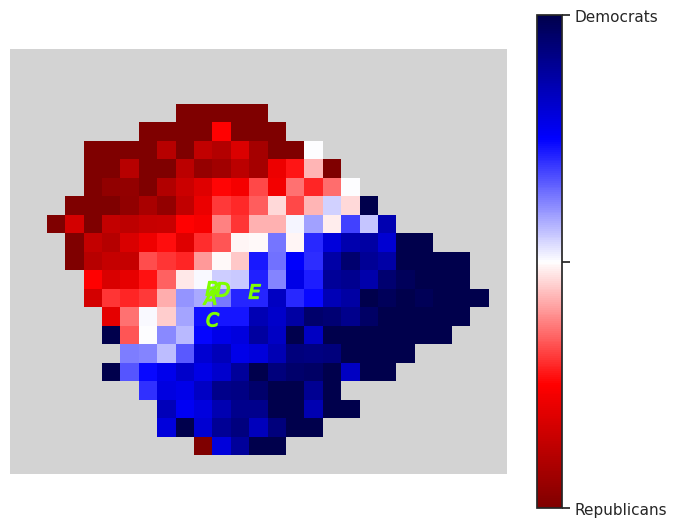

In [52]:
allHeatmap(points2d, attributes=['Democrats','Republicans'], objs=['party'], attName='Political Leaning')

In [59]:
def allHeatmapAttr(points2d, attributes, objs, acr):
    """ Plot dominance map, how dominant are two communities within an attribute for the whole year subset

    Parameters:
    points2d -- 2d coordinates for all users
    attributes -- dictionary of pair of communities in an attribute to plot
    objs -- list of the attributes under study
    acr -- list of the community acronyms under study
    """
    dens_allGroup = dict()
    for categ in objs:
        for sub in np.array(list(attributesData[categ][0].keys())):
            subUsers = np.array([[0,0]])
            for i in range(len(yearsSubset)):
                subUsers = np.concatenate((subUsers, attributesData[categ][i][sub]), axis=0)
            subUsers = np.delete(subUsers, 0, axis=0)
            dens_allGroup[sub] = list(subUsers)
    
    pointsFilter = gaussian_filter(points2d, sigma=0.5)
#    pointsFilter = points2d
    
    # find bounding box
    bbox = {
        'minX': np.min(pointsFilter[:,0]),
        'maxX': np.max(pointsFilter[:,0]),
        'minY': np.min(pointsFilter[:,1]),
        'maxY': np.max(pointsFilter[:,1])
    }
    plotRangeX = np.arange(
        math.floor(bbox['minX'] - 0.5),
        math.ceil(bbox['maxX'] + 1),
        0.3)
    plotRangeY = np.arange(
        math.floor(bbox['minY'] - 0.5),
        math.ceil(bbox['maxY'] + 1),
        0.3)
    
#    print(len(plotRangeX), len(plotRangeY))
    
    label = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)']
    
    fig, ax = plt.subplots(3,2, sharex = True, sharey = True, figsize=(8,12))
    fig.subplots_adjust(hspace=-0.5)
    fig.subplots_adjust(wspace=0.13)
    for n,attr in enumerate(objs):

        # only consider if attribute length is 2
        if (len(attributes[attr])!= 2):
            return

        # custom color map
        cmap_reversed = matplotlib.cm.get_cmap('seismic').reversed()
        cmap_reversed.set_bad('lightgray', 1.)

        # generate the plot
        fig2, ax2 = plt.subplots(figsize=(15,12))
        lsD = np.array(dens_allGroup[attributes[attr][0]])
        lsD = gaussian_filter(lsD, sigma=0.5)
        lsD = np.round(lsD, decimals=3)
        x = lsD[:,0]
        y = lsD[:,1]
        histDem, xbinsDem, ybinsDem, imDem = ax2.hist2d(x,y, bins=[plotRangeX,plotRangeY], cmap = 'plasma')
        plt.close(fig=fig2)

        ls = np.array(dens_allGroup[attributes[attr][0]] + dens_allGroup[attributes[attr][1]])
        ls = gaussian_filter(ls, sigma=0.5)
        l = len(ls)
        ls = np.round(ls, decimals=3)
        fig2, ax2 = plt.subplots(figsize=(15,12))

        x = ls[:,0]
        y = ls[:,1]
        
        hist, xbins, ybins, im = ax2.hist2d(x,y, bins=[plotRangeX,plotRangeY], cmap = 'plasma')
        plt.close(fig=fig2)
#        hist[hist < 10] = np.nan
        hist = 2.*histDem / hist - 1.
        masked_array = np.ma.array (hist, mask=np.isnan(hist))

#        markers = ['$A$', '$B$', '$C$', '$D$', '$E$']
#        ax[int(np.floor(n/2)), n % 2].set_title(attr.capitalize())
        ax[int(np.floor(n/2)), n % 2].text(30, 4, label[n], fontsize=15)
        im = ax[int(np.floor(n/2)), n % 2].imshow(np.flip(masked_array.T, axis=0), interpolation='nearest', cmap=cmap_reversed)
#        ax[int(np.floor(n/2)), n % 2].axis('off')
#         ax[int(np.floor(n/2)), n % 2].set_yticks([0, 5, 10, 15, 20, 25],
#             labels=[str(4.7), str(3.2), str(1.7), str(0.2), str(-1.3), str(-2.8)],
#             fontsize=12)
        ax[int(np.floor(n/2)), n % 2].set_yticks([0, 5, 10, 15, 20, 25],
            labels=[str(4.5), str(3.0), str(1.5), str(0.0), str(-1.5), str(-3.0)],
            fontsize=12)
        ax[int(np.floor(n/2)), n % 2].set_xticks([0, 10, 20, 30],
            labels=[str(-4 + 0*0.3), str(-4 + 10*0.3), str(-4 + 20*0.3), str(-4 + 30*0.3)], fontsize=12)
        cbar = fig.colorbar(im, ax=ax[int(np.floor(n/2)), n % 2], ticks=[-1,1], fraction=0.036)
        cbar.ax.set_yticklabels([acr[n][1], acr[n][0]], fontsize=12)
    plt.show()

/tmp/ipykernel_69940/3938427342.py:77: RuntimeWarning:

invalid value encountered in true_divide



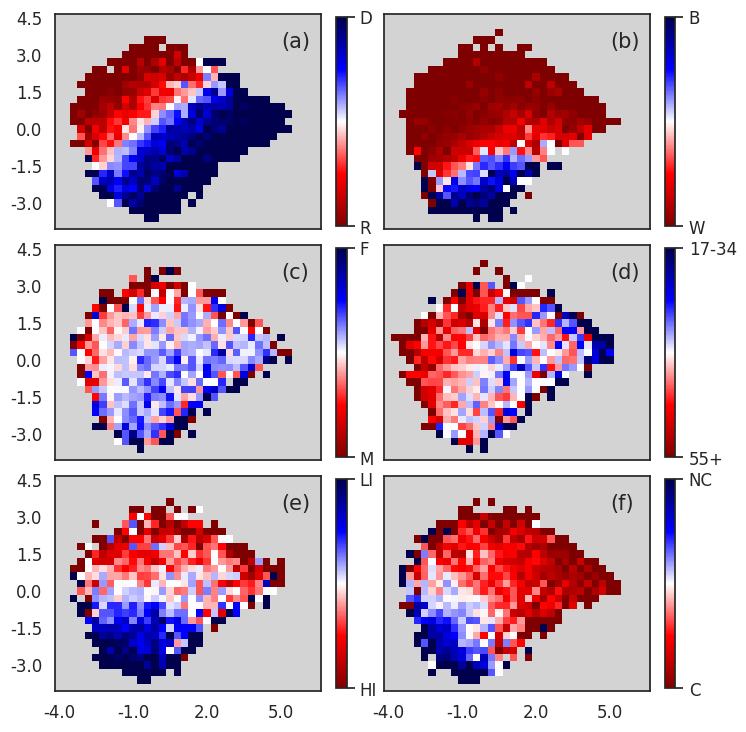

In [60]:
allHeatmapAttr(points2d, attributes=subcats, objs=['party', 'race', 'gender', 'age', 'affluence', 'education'],
               acr=[['D', 'R'], ['B', 'W'], ['F', 'M'], ['17-34', '55+'], ['LI', 'HI'], ['NC', 'C']])
#plt.savefig('../respondents_density.pdf', bbox_inches="tight")

In [60]:
def allHeatmapAttrYear(points2d, attributes, objs, acr, year):
    """ Plot dominance map, how dominant are two communities within an attribute for a certain year

    Parameters:
    points2d -- 2d coordinates for all users
    attributes -- dictionary of pair of communities in an attribute to plot
    objs -- list of the attributes under study
    acr -- list of the community acronyms under study
    """
    dens_allGroup = dict()
    for categ in objs:
        for sub in np.array(list(attributesData[categ][0].keys())):
            dens_allGroup[sub] = attributesData[categ][year][sub]
    
    pointsFilter = gaussian_filter(points2d, sigma=0.3)
#    pointsFilter = points2d
    
    # find bounding box
    bbox = {
        'minX': np.min(pointsFilter[:,0]),
        'maxX': np.max(pointsFilter[:,0]),
        'minY': np.min(pointsFilter[:,1]),
        'maxY': np.max(pointsFilter[:,1])
    }
    plotRangeX = np.arange(
        math.floor(bbox['minX'] - 0.5),
        math.ceil(bbox['maxX'] + 1),
        0.4)
    plotRangeY = np.arange(
        math.floor(bbox['minY'] - 0.5),
        math.ceil(bbox['maxY'] + 1),
        0.4)
    
    label = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)']
    
    fig, ax = plt.subplots(3,2, sharex = True, sharey = True, figsize=(8,12))
    fig.subplots_adjust(hspace=-0.5)
    fig.subplots_adjust(wspace=0.13)
    for n,attr in enumerate(objs):

        # only consider if attribute length is 2
        if (len(attributes[attr])!= 2):
            return

        # custom color map
        cmap_reversed = matplotlib.cm.get_cmap('seismic').reversed()
        cmap_reversed.set_bad('lightgray', 1.)

        # generate the plot
        fig2, ax2 = plt.subplots(figsize=(15,12))
        lsD = np.array(dens_allGroup[attributes[attr][0]])
        lsD = gaussian_filter(lsD, sigma=0.3)
        lsD = np.round(lsD, decimals=3)
        x = lsD[:,0]
        y = lsD[:,1]
        histDem, xbinsDem, ybinsDem, imDem = ax2.hist2d(x,y, bins=[plotRangeX,plotRangeY], cmap = 'plasma')
        plt.close(fig=fig2)

        ls = np.array(dens_allGroup[attributes[attr][0]] + dens_allGroup[attributes[attr][1]])
        ls = gaussian_filter(ls, sigma=0.3)
        l = len(ls)
        ls = np.round(ls, decimals=3)
        fig2, ax2 = plt.subplots(figsize=(15,12))

        x = ls[:,0]
        y = ls[:,1]
        
        hist, xbins, ybins, im = ax2.hist2d(x,y, bins=[plotRangeX,plotRangeY], cmap = 'plasma')
        plt.close(fig=fig2)
#        hist[hist < 10] = np.nan
        hist = 2.*histDem / hist - 1.
        masked_array = np.ma.array (hist, mask=np.isnan(hist))

#        markers = ['$A$', '$B$', '$C$', '$D$', '$E$']
#        ax[int(np.floor(n/2)), n % 2].set_title(attr.capitalize())
#        ax[int(np.floor(n/2)), n % 2].text(30, 4, label[n], fontsize=15)
        im = ax[int(np.floor(n/2)), n % 2].imshow(np.flip(masked_array.T, axis=0), interpolation='nearest', cmap=cmap_reversed)
#        ax[int(np.floor(n/2)), n % 2].axis('off')
#        ax[int(np.floor(n/2)), n % 2].set_yticks([0, 5, 10, 15, 20, 25],
#            labels=[str(4.7), str(3.2), str(1.7), str(0.2), str(-1.3), str(-2.8)],
#            fontsize=12)
#        ax[int(np.floor(n/2)), n % 2].set_xticks([0, 10, 20, 30],
#            labels=[str(-4 + 0*0.3), str(-4 + 10*0.3), str(-4 + 20*0.3), str(-4 + 30*0.3)], fontsize=12)
        cbar = fig.colorbar(im, ax=ax[int(np.floor(n/2)), n % 2], ticks=[-1,1], fraction=0.036)
        cbar.ax.set_yticklabels([acr[n][1], acr[n][0]], fontsize=12)
    ax[0,0].set_title(str(yearsSubset[year]))
    plt.show()

/tmp/ipykernel_56116/690082456.py:71: RuntimeWarning:

invalid value encountered in true_divide



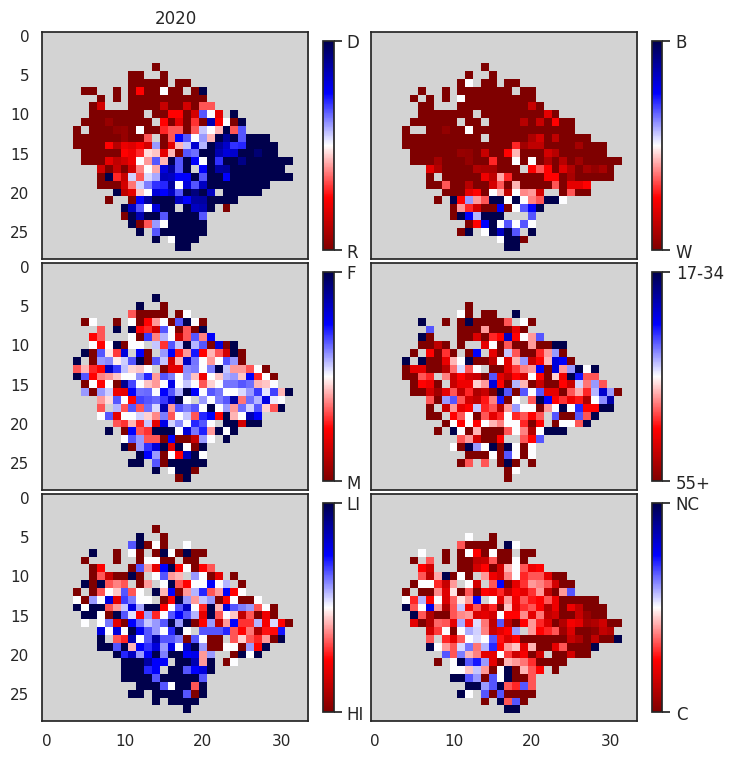

In [61]:
allHeatmapAttrYear(points2d, attributes=subcats, objs=['party', 'race', 'gender', 'age', 'affluence', 'education'],
               acr=[['D', 'R'], ['B', 'W'], ['F', 'M'], ['17-34', '55+'], ['LI', 'HI'], ['NC', 'C']],
               year=4)

In [62]:
def allHeatmapArrows(points2d, attributes, objs):
    """ Plot dominance map with gradient arrows within an attribute for the whole year subset

    Parameters:
    points2d -- 2d coordinates for all users
    attributes -- dictionary of pair of communities in an attribute to plot
    objs -- list of the attributes under study
    """
    dens_allGroup = dict()
    for categ in objs:
        for sub in np.array(list(attributesData[categ][0].keys())):
            subUsers = np.array([[0,0]])
            for i in range(len(yearsSubset)):
                subUsers = np.concatenate((subUsers, attributesData[categ][i][sub]), axis=0)
            subUsers = np.delete(subUsers, 0, axis=0)
            dens_allGroup[sub] = list(subUsers)
    
    pointsFilter = gaussian_filter(points2d, sigma=0.5)
#    pointsFilter = points2d
    
    # find bounding box
    bbox = {
        'minX': np.min(pointsFilter[:,0]),
        'maxX': np.max(pointsFilter[:,0]),
        'minY': np.min(pointsFilter[:,1]),
        'maxY': np.max(pointsFilter[:,1])
    }
    xMin, xMax = math.floor(bbox['minX'] - 0.5), math.ceil(bbox['maxX'] + 1)
    yMin, yMax = math.floor(bbox['minY'] - 0.5), math.ceil(bbox['maxY'] + 1)
    step = 0.3
    plotRangeX = np.arange(xMin,xMax,step)
    plotRangeY = np.arange(yMin,yMax,step)
    
    arrowCenters = [(-1.1, 2.2), (-0.6, 1.2), (0.3, 1.0), (-0.3, 0.5), (-0.1, 1.5), (0.7, 0.5)]
    
    fig, ax = plt.subplots(3,2, figsize=(8,12))
    def func_to_vectorize(x, y, dx, dy, scaling=0.1):
        ax[int(np.floor(n/2)), n % 2].arrow(x, y, dx*scaling, dy*scaling, fc="chartreuse", ec="k", 
                                            linewidth=2., head_width=0.5, head_length=0.7)
    for n,attr in enumerate(objs):

        # only consider if attribute length is 2
        if (len(attributes[attr])!= 2):
            return

        # custom color map
        cmap_reversed = matplotlib.cm.get_cmap('seismic').reversed()
        cmap_reversed.set_bad('lightgray', 1.)

        # generate the plot
        fig2, ax2 = plt.subplots(figsize=(15,12))
        lsD = np.array(dens_allGroup[attributes[attr][0]])
        lsD = gaussian_filter(lsD, sigma=0.5)
        lsD = np.round(lsD, decimals=3)
        x = lsD[:,0]
        y = lsD[:,1]
        histDem, xbinsDem, ybinsDem, imDem = ax2.hist2d(x,y, bins=[plotRangeX,plotRangeY], cmap = 'plasma')
        plt.close(fig=fig2)

        ls = np.array(dens_allGroup[attributes[attr][0]] + dens_allGroup[attributes[attr][1]])
        ls = gaussian_filter(ls, sigma=0.5)
        l = len(ls)
        ls = np.round(ls, decimals=3)
        fig2, ax2 = plt.subplots(figsize=(15,12))

        x = ls[:,0]
        y = ls[:,1]

        hist, xbins, ybins, im = ax2.hist2d(x,y, bins=[plotRangeX,plotRangeY], cmap = 'plasma')
        plt.close(fig=fig2)
        cases = hist.T >= 10
        hist = histDem / hist 
        masked_array = np.ma.array (hist, mask=np.isnan(hist))

        # gradient arrows
        histGradient = hist.T
        histGradient[np.isnan(histGradient)] = 0
        yd, xd = np.gradient(histGradient)
        
        vectorized_arrow_drawing = np.vectorize(func_to_vectorize)
        xGrad, yGrad = np.delete(xbins+step/2., -1), np.delete(ybins+step/2., -1)
        xv, yv = np.meshgrid(xGrad, yGrad)

        
        ax[int(np.floor(n/2)), n % 2].set_title(attr.capitalize())
        ax[int(np.floor(n/2)), n % 2].imshow(np.flip(masked_array.T, axis=0), interpolation='nearest', 
                                             cmap=cmap_reversed, extent=[xMin, xMax, yMin, yMax])
        ax[int(np.floor(n/2)), n % 2].axis('off')
        vectorized_arrow_drawing(arrowCenters[n][0], arrowCenters[n][1], 
                                 np.sum(xd[cases]), np.sum(yd[cases]), 0.25)
        # cbar = plt.colorbar(shrink=0.8,ticks=[0,0.5,1])
        # cbar.ax.set_yticklabels([attributes[attr][1], '', attributes[attr][0]])
    plt.show()

/tmp/ipykernel_56116/2598505534.py:72: RuntimeWarning:

invalid value encountered in true_divide



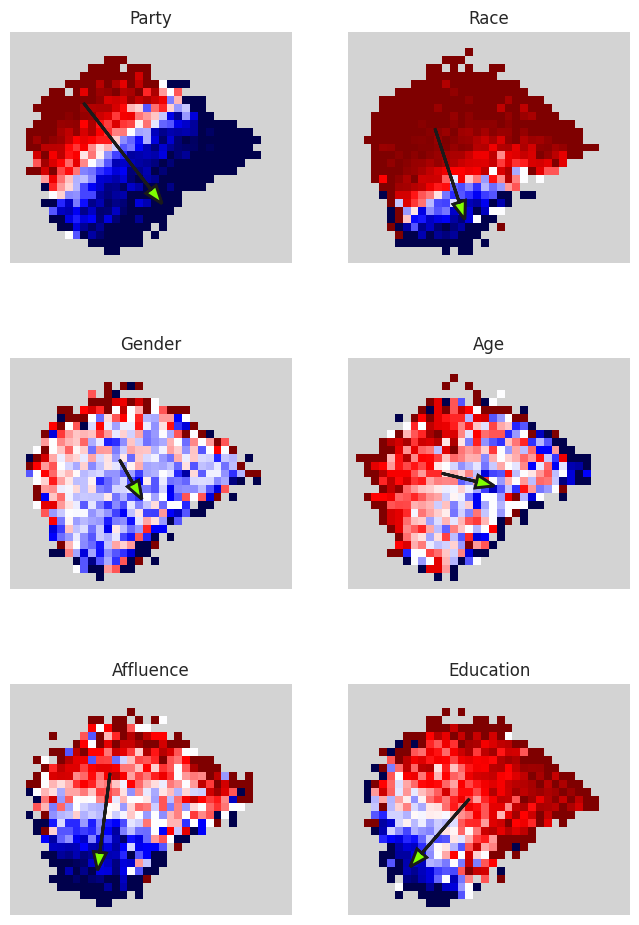

In [63]:
allHeatmapArrows(points2d, attributes=subcats, objs=['party', 'race', 'gender', 'age', 'affluence', 'education'])

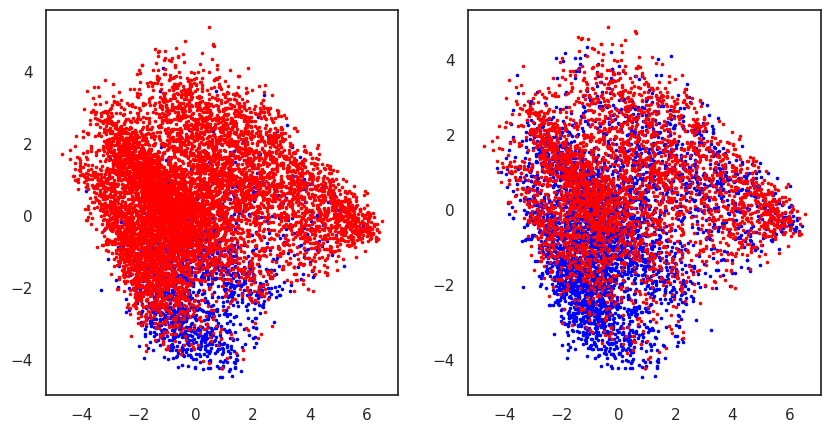

In [64]:
dens_allGroup = dict()
for categ in ['race', 'affluence']:
    for sub in subcats[categ]:
        subUsers = np.array([[0,0]])
        for i in range(len(yearsSubset)):
            subUsers = np.concatenate((subUsers, attributesData[categ][i][sub]), axis=0)
        subUsers = np.delete(subUsers, 0, axis=0)
        dens_allGroup[sub] = np.array(list(subUsers))

fig, ax = plt.subplots(1,2, figsize=(10,5))
color = ['blue', 'red']
for n,categ in enumerate(['race', 'affluence']):
    for i,sub in enumerate(subcats[categ]):
        ax[n].scatter(dens_allGroup[sub][:,0], dens_allGroup[sub][:,1], s=10, 
                      color=color[i], alpha=1.0, marker='.')

In [65]:
def allArrows(points2d, attributes, objs):
    """ Plot gradient arrows for the different attributes for the whole year subset

    Parameters:
    points2d -- 2d coordinates for all users
    attributes -- dictionary of pair of communities in an attribute to plot
    objs -- list of the attributes under study
    """
    dens_allGroup = dict()
    for categ in objs:
        for sub in np.array(list(attributesData[categ][0].keys())):
            subUsers = np.array([[0,0]])
            for i in range(len(yearsSubset)):
                subUsers = np.concatenate((subUsers, attributesData[categ][i][sub]), axis=0)
            subUsers = np.delete(subUsers, 0, axis=0)
            dens_allGroup[sub] = list(subUsers)
    
    pointsFilter = gaussian_filter(points2d, sigma=0.5)
#    pointsFilter = points2d
    
    # find bounding box
    bbox = {
        'minX': np.min(pointsFilter[:,0]),
        'maxX': np.max(pointsFilter[:,0]),
        'minY': np.min(pointsFilter[:,1]),
        'maxY': np.max(pointsFilter[:,1])
    }
    xMin, xMax = math.floor(bbox['minX'] - 0.5), math.ceil(bbox['maxX'] + 1)
    yMin, yMax = math.floor(bbox['minY'] - 0.5), math.ceil(bbox['maxY'] + 1)
    step = 0.3
    plotRangeX = np.arange(xMin,xMax,step)
    plotRangeY = np.arange(yMin,yMax,step)
    
    
    fig, ax = plt.subplots(figsize=(6,6))
    def func_to_vectorize(x, y, dx, dy, scaling=0.1):
        ax.annotate(attributes[attr][0], xy=[x,y], xytext=[dx*scaling - 1.1, dy*scaling - 2.], size=10)
        ax.annotate(attributes[attr][1], xy=[x,y], xytext=[-dx*scaling - 1.5, -dy*scaling + 1.3], size=10)
        ax.arrow(x, y, dx*scaling, dy*scaling, fc="C" + str(n), ec="C" + str(n), 
                                            linewidth=0.7, head_width=0.7, head_length=0.7)
        ax.arrow(x, y, -dx*scaling, -dy*scaling, fc="C" + str(n), ec="C" + str(n), 
                                            linewidth=0.7, head_width=0.7, head_length=0.7)
    for n,attr in enumerate(objs):

        # generate histogram
        fig2, ax2 = plt.subplots(figsize=(15,12))
        lsD = np.array(dens_allGroup[attributes[attr][0]])
        lsD = gaussian_filter(lsD, sigma=0.5)
        lsD = np.round(lsD, decimals=3)
        x = lsD[:,0]
        y = lsD[:,1]
        histDem, xbinsDem, ybinsDem, imDem = ax2.hist2d(x,y, bins=[plotRangeX,plotRangeY], cmap = 'plasma')
        plt.close(fig=fig2)

        ls = np.array(dens_allGroup[attributes[attr][0]] + dens_allGroup[attributes[attr][1]])
        ls = gaussian_filter(ls, sigma=0.5)
        l = len(ls)
        ls = np.round(ls, decimals=3)
        fig2, ax2 = plt.subplots(figsize=(15,12))

        x = ls[:,0]
        y = ls[:,1]

        hist, xbins, ybins, im = ax2.hist2d(x,y, bins=[plotRangeX,plotRangeY], cmap = 'plasma')
        plt.close(fig=fig2)
        cases = hist.T >= 10
        hist = histDem / hist 

        # gradient arrows
        histGradient = hist.T
        histGradient[np.isnan(histGradient)] = 0
        yd, xd = np.gradient(histGradient)
        
        vectorized_arrow_drawing = np.vectorize(func_to_vectorize)
        xGrad, yGrad = np.delete(xbins+step/2., -1), np.delete(ybins+step/2., -1)
        xv, yv = np.meshgrid(xGrad, yGrad)

        ax.set_aspect(1.0)
        ax.axis('off')
        vectorized_arrow_drawing(0., 0., np.sum(xd[cases]), np.sum(yd[cases]), 1.)
        print(180. + np.arctan2(np.sum(yd[cases]), np.sum(xd[cases]))*180./np.pi)
    plt.show()

127.9430317904955
108.19103372672095
119.54500214810082
166.57774866416332
82.67119500851513
48.842494066013955


/tmp/ipykernel_56116/885897613.py:67: RuntimeWarning:

invalid value encountered in true_divide



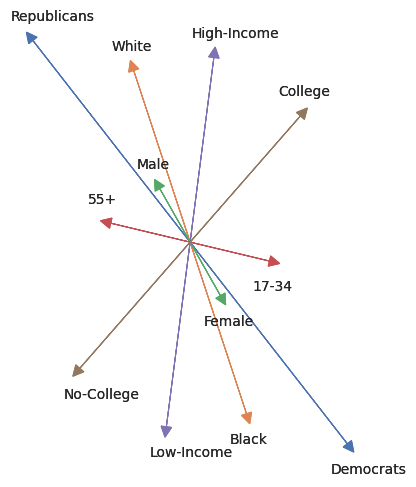

In [66]:
allArrows(points2d, attributes=subcats, objs=['party', 'race', 'gender', 'age', 'affluence', 'education'])

In [67]:
def allArrowsYear(points2d, attributes, objs, year):
    """ Plot gradient arrows for the different attributes for a certain year

    Parameters:
    points2d -- 2d coordinates for all users
    attributes -- dictionary of pair of communities in an attribute to plot
    objs -- list of the attributes under study
    """
    dens_allGroup = dict()
    for categ in objs:
        for sub in np.array(list(attributesData[categ][0].keys())):
            dens_allGroup[sub] = attributesData[categ][year][sub]
    
    pointsFilter = gaussian_filter(points2d, sigma=0.3)
#    pointsFilter = points2d
    
    # find bounding box
    bbox = {
        'minX': np.min(pointsFilter[:,0]),
        'maxX': np.max(pointsFilter[:,0]),
        'minY': np.min(pointsFilter[:,1]),
        'maxY': np.max(pointsFilter[:,1])
    }
    xMin, xMax = math.floor(bbox['minX'] - 0.5), math.ceil(bbox['maxX'] + 1)
    yMin, yMax = math.floor(bbox['minY'] - 0.5), math.ceil(bbox['maxY'] + 1)
    step = 0.4
    plotRangeX = np.arange(xMin,xMax,step)
    plotRangeY = np.arange(yMin,yMax,step)
    
    
    fig, ax = plt.subplots(figsize=(6,6))
    def func_to_vectorize(x, y, dx, dy, scaling=0.1):
        ax.annotate(attributes[attr][0], xy=[x,y], xytext=[dx*scaling, dy*scaling], size=10)
        ax.annotate(attributes[attr][1], xy=[x,y], xytext=[-dx*scaling, -dy*scaling], size=10)
        ax.arrow(x, y, dx*scaling, dy*scaling, fc="C" + str(n), ec="C" + str(n), 
                                            linewidth=0.7, head_width=0.4, head_length=0.4)
        ax.arrow(x, y, -dx*scaling, -dy*scaling, fc="C" + str(n), ec="C" + str(n), 
                                            linewidth=0.7, head_width=0.4, head_length=0.4)
    for n,attr in enumerate(objs):

        # generate histogram
        fig2, ax2 = plt.subplots(figsize=(15,12))
        lsD = np.array(dens_allGroup[attributes[attr][0]])
        lsD = gaussian_filter(lsD, sigma=0.3)
        lsD = np.round(lsD, decimals=3)
        x = lsD[:,0]
        y = lsD[:,1]
        histDem, xbinsDem, ybinsDem, imDem = ax2.hist2d(x,y, bins=[plotRangeX,plotRangeY], cmap = 'plasma')
        plt.close(fig=fig2)

        ls = np.array(dens_allGroup[attributes[attr][0]] + dens_allGroup[attributes[attr][1]])
        ls = gaussian_filter(ls, sigma=0.3)
        l = len(ls)
        ls = np.round(ls, decimals=3)
        fig2, ax2 = plt.subplots(figsize=(15,12))

        x = ls[:,0]
        y = ls[:,1]

        hist, xbins, ybins, im = ax2.hist2d(x,y, bins=[plotRangeX,plotRangeY], cmap = 'plasma')
        plt.close(fig=fig2)
#        cases = hist.T >= 10
        cases = hist.T >= 5
        hist = histDem / hist 

        # gradient arrows
        histGradient = hist.T
        histGradient[np.isnan(histGradient)] = 0
        yd, xd = np.gradient(histGradient)
        
        vectorized_arrow_drawing = np.vectorize(func_to_vectorize)
        xGrad, yGrad = np.delete(xbins+step/2., -1), np.delete(ybins+step/2., -1)
        xv, yv = np.meshgrid(xGrad, yGrad)

        ax.set_aspect(1.0)
        ax.axis('off')
        vectorized_arrow_drawing(0., 0., np.sum(xd[cases]), np.sum(yd[cases]), 1.)
    plt.title(str(yearsSubset[year]))
    plt.show()

/tmp/ipykernel_56116/1721232666.py:64: RuntimeWarning:

invalid value encountered in true_divide



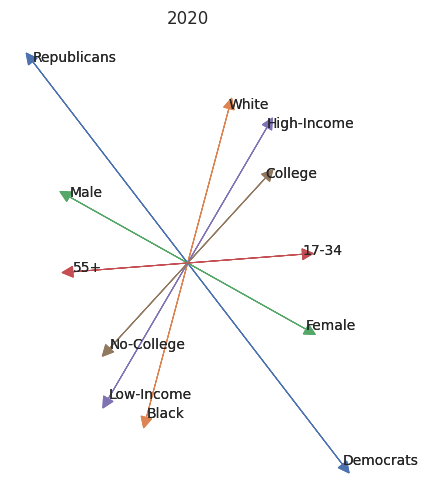

In [68]:
allArrowsYear(points2d, attributes=subcats, objs=['party', 'race', 'gender', 'age', 'affluence', 'education'], 
              year=4)

/tmp/ipykernel_56116/4282495153.py:59: RuntimeWarning:

invalid value encountered in true_divide

/tmp/ipykernel_56116/4282495153.py:145: RuntimeWarning:

invalid value encountered in true_divide



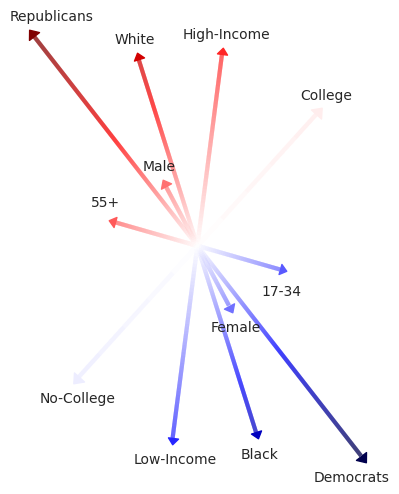

In [70]:
objs = ['party', 'race', 'gender', 'age', 'affluence', 'education']
attributes=subcats

dens_allGroup = dict()
for categ in objs:
    for sub in np.array(list(attributesData[categ][0].keys())):
        subUsers = np.array([[0,0]])
        for i in range(len(yearsSubset)):
            subUsers = np.concatenate((subUsers, attributesData[categ][i][sub]), axis=0)
        subUsers = np.delete(subUsers, 0, axis=0)
        dens_allGroup[sub] = list(subUsers)

pointsFilter = gaussian_filter(points2d, sigma=0.5)
#pointsFilter = points2d

# find bounding box
bbox = {
    'minX': np.min(pointsFilter[:,0]),
    'maxX': np.max(pointsFilter[:,0]),
    'minY': np.min(pointsFilter[:,1]),
    'maxY': np.max(pointsFilter[:,1])
}
xMin, xMax = math.floor(bbox['minX'] - 0.5), math.ceil(bbox['maxX'] + 1)
yMin, yMax = math.floor(bbox['minY'] - 0.5), math.ceil(bbox['maxY'] + 1)
step = 0.3
plotRangeX = np.arange(xMin,xMax,step)
plotRangeY = np.arange(yMin,yMax,step)
loc = [[-6.0, -3.2], [-3.0, 2.0], [-2.0, -3.2], [-3.0, 2.0], [-2.3, -3.2], [-3.0, 2.0],
       [-2.3, -3.2], [-3.0, 2.0], [-5.0, -3.2], [-5.0, 2.0], [-5.0, -3.2], [-2.0, 2.0]]


cmap = plt.get_cmap('seismic')
#fig, ax = plt.subplots(facecolor='gainsboro', figsize=(6,6))
fig, ax = plt.subplots(figsize=(6,6))
attr = 'party'

# generate histogram for party
fig2, ax2 = plt.subplots(figsize=(15,12))
lsD = np.array(dens_allGroup[attributes[attr][0]])
lsD = gaussian_filter(lsD, sigma=0.5)
lsD = np.round(lsD, decimals=3)
x = lsD[:,0]
y = lsD[:,1]
histDem, xbinsDem, ybinsDem, imDem = ax2.hist2d(x,y, bins=[plotRangeX,plotRangeY], cmap = 'plasma')
plt.close(fig=fig2)

ls = np.array(dens_allGroup[attributes[attr][0]] + dens_allGroup[attributes[attr][1]])
ls = gaussian_filter(ls, sigma=0.5)
l = len(ls)
ls = np.round(ls, decimals=3)
fig2, ax2 = plt.subplots(figsize=(15,12))

x = ls[:,0]
y = ls[:,1]

hist, xbins, ybins, im = ax2.hist2d(x,y, bins=[plotRangeX,plotRangeY], cmap = 'plasma')
plt.close(fig=fig2)
cases = hist.T >= 10
hist = 2.*histDem / hist - 1.

# gradient arrows
histGradient = hist.T
histGradient[np.isnan(histGradient)] = 0
yd, xd = np.gradient(histGradient)
def arrow_drawing(x, y, dx, dy, cmap, vmin, vmax, locmin, locmax, n, i, loc, lw=3):
    
    # community labels
    ax.annotate(attributes[attr][0], xy=[x,y], xytext=[dx + loc[2*i][0], dy + loc[2*i][1]], fontsize=10)
    ax.annotate(attributes[attr][1], xy=[x,y], xytext=[-dx + loc[2*i+1][0], -dy + loc[2*i+1][1]], fontsize=10)
    
    # blue-half arrow
    ini = np.linspace(x,dx,n)
    fin = np.linspace(y,dy,n)
    points = np.array([ini,fin]).T.reshape(-1,1,2)
    segments = np.concatenate([points[:-1],points[1:]], axis=1)
    lc = LineCollection(segments, cmap='seismic', linewidth=lw, norm=plt.Normalize(vmin=vmin,vmax=vmax))
    lc.set_array(np.linspace(0,locmin,n))
    ax.add_collection(lc)
    
    # triangle blue-head
    tricoords = [(0,-0.4),(0.5,0),(0,0.4),(0,-0.4)]
    angle = np.arctan2(dy-y, dx-x)
    rot = matplotlib.transforms.Affine2D().rotate(angle)
    tricoords2 = rot.transform(tricoords)
    tri = matplotlib.path.Path(tricoords2, closed=True)
    ax.scatter(dx, dy, c=locmin, s=(3*lw)**2, marker=tri, cmap=cmap, norm=plt.Normalize(vmin=vmin,vmax=vmax))
    
    # red-half arrow
    ini = np.linspace(x,-dx,n)
    fin = np.linspace(y,-dy,n)
    points = np.array([ini,fin]).T.reshape(-1,1,2)
    segments = np.concatenate([points[:-1],points[1:]], axis=1)
    lc = LineCollection(segments, cmap='seismic', linewidth=lw, norm=plt.Normalize(vmin=vmin,vmax=vmax))
    lc.set_array(np.linspace(0,locmax,n))
    ax.add_collection(lc)
    
    # triangle red-head
    tricoords = [(0,-0.4),(0.5,0),(0,0.4),(0,-0.4)]
    angle = np.arctan2(-dy-y, -dx-x)
    rot = matplotlib.transforms.Affine2D().rotate(angle)
    tricoords2 = rot.transform(tricoords)
    tri = matplotlib.path.Path(tricoords2, closed=True)
    ax.scatter(-dx, -dy, c=locmax, s=(3*lw)**2, marker=tri, cmap=cmap, norm=plt.Normalize(vmin=vmin,vmax=vmax))

locX = np.sum(xd[cases])
locY = np.sum(yd[cases])
ext = np.sqrt(locX**2 + locY**2)
n = 501
arrow_drawing(0., 0., locX, locY, cmap, -ext, ext, -ext, ext, n + 1, 0, loc)

# colormesh
sop = np.linspace(-ext, ext, n)
sopX = np.linspace(-abs(locX), abs(locX), n)
sopY = np.linspace(-abs(locY), abs(locY), n)
C = np.array([np.zeros(n)])
for i in sop:
    C = np.concatenate((C, [np.linspace((i + ext)/2., (i - ext)/2., n)]), axis=0)
C = np.delete(C, 0, axis=0)

# the remaining attributes
for k,attr in enumerate(objs[1:]):
    
    # generate histogram
    fig2, ax2 = plt.subplots(figsize=(15,12))
    lsD = np.array(dens_allGroup[attributes[attr][0]])
    lsD = gaussian_filter(lsD, sigma=0.5)
    lsD = np.round(lsD, decimals=3)
    x = lsD[:,0]
    y = lsD[:,1]
    histDem, xbinsDem, ybinsDem, imDem = ax2.hist2d(x,y, bins=[plotRangeX,plotRangeY], cmap = 'plasma')
    plt.close(fig=fig2)

    ls = np.array(dens_allGroup[attributes[attr][0]] + dens_allGroup[attributes[attr][1]])
    ls = gaussian_filter(ls, sigma=0.5)
    l = len(ls)
    ls = np.round(ls, decimals=3)
    fig2, ax2 = plt.subplots(figsize=(15,12))

    x = ls[:,0]
    y = ls[:,1]

    hist, xbins, ybins, im = ax2.hist2d(x,y, bins=[plotRangeX,plotRangeY], cmap = 'plasma')
    plt.close(fig=fig2)
    cases = hist.T >= 10
    hist = 2.*histDem / hist - 1.

    # gradient arrows
    histGradient = hist.T
    histGradient[np.isnan(histGradient)] = 0
    yd, xd = np.gradient(histGradient)
    locX = np.sum(xd[cases])
    locY = np.sum(yd[cases])
    for i in range(n-1):
        if locX > sopX[i] and locX < sopX[i+1]:
            break
    for j in range(n-1):
        if locY > sopY[j] and locY < sopX[j+1]:
            break
    arrow_drawing(0., 0., locX, locY, cmap, -ext, ext, -C[i][j], C[i][j], n + 1, k + 1, loc)

ax.autoscale_view()
ax.set_aspect(1.0)
ax.axis('off')
#ax.axis([-20, 20, -20, 20])
plt.show()
#plt.savefig('../respondents_density_arrows.pdf', bbox_inches="tight")

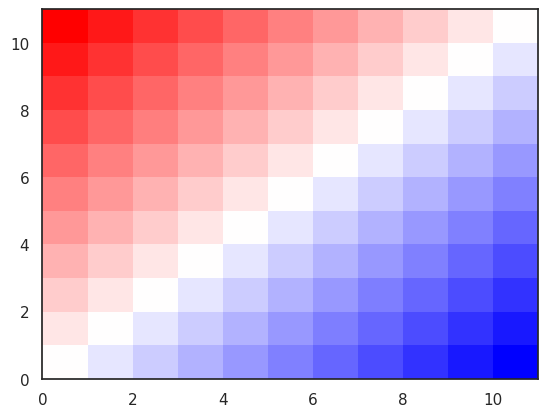

In [71]:
n = 11
sup = np.sqrt(np.sum(xd[cases])**2 + np.sum(yd[cases])**2)
x = np.linspace(-sup, sup, n)
C = np.array([np.zeros(n)])
for i in x:
    C = np.concatenate((C, [np.linspace((i + sup)/2., (i - sup)/2., n)]), axis=0)
C = np.delete(C, 0, axis=0)
plt.pcolormesh(C, cmap='bwr')

In [72]:
def allArrowsSameBins(points2d, attributes, objs):
    """ Plot gradient arrows for the different attributes using the same bins for the whole year subset

    Parameters:
    points2d -- 2d coordinates for all users
    attributes -- dictionary of pair of communities in an attribute to plot
    objs -- list of the attributes under study
    """
    dens_allGroup = dict()
    for categ in objs:
        for sub in np.array(list(attributesData[categ][0].keys())):
            subUsers = np.array([[0,0]])
            for i in range(len(yearsSubset)):
                subUsers = np.concatenate((subUsers, attributesData[categ][i][sub]), axis=0)
            subUsers = np.delete(subUsers, 0, axis=0)
            dens_allGroup[sub] = list(subUsers)
    
    pointsFilter = gaussian_filter(points2d, sigma=0.5)
#    pointsFilter = points2d
    
    # find bounding box
    bbox = {
        'minX': np.min(pointsFilter[:,0]),
        'maxX': np.max(pointsFilter[:,0]),
        'minY': np.min(pointsFilter[:,1]),
        'maxY': np.max(pointsFilter[:,1])
    }
    xMin, xMax = math.floor(bbox['minX'] - 0.5), math.ceil(bbox['maxX'] + 1)
    yMin, yMax = math.floor(bbox['minY'] - 0.5), math.ceil(bbox['maxY'] + 1)
    step = 0.3
    plotRangeX = np.arange(xMin,xMax,step)
    plotRangeY = np.arange(yMin,yMax,step)
    
    
    embed = np.zeros((len(plotRangeX)-1, len(plotRangeY)-1))
    plant = dict()
    for attr in objs:

        # generate histogram
        fig2, ax2 = plt.subplots(figsize=(15,12))
        lsD = np.array(dens_allGroup[attributes[attr][0]])
        lsD = gaussian_filter(lsD, sigma=0.5)
        lsD = np.round(lsD, decimals=3)
        x = lsD[:,0]
        y = lsD[:,1]
        histDem, xbinsDem, ybinsDem, imDem = ax2.hist2d(x,y, bins=[plotRangeX,plotRangeY], cmap = 'plasma')
        plt.close(fig=fig2)

        ls = np.array(dens_allGroup[attributes[attr][0]] + dens_allGroup[attributes[attr][1]])
        ls = gaussian_filter(ls, sigma=0.5)
        l = len(ls)
        ls = np.round(ls, decimals=3)
        fig2, ax2 = plt.subplots(figsize=(15,12))

        x = ls[:,0]
        y = ls[:,1]

        hist, xbins, ybins, im = ax2.hist2d(x,y, bins=[plotRangeX,plotRangeY], cmap = 'plasma')
        plt.close(fig=fig2)
        cases = hist < 10
        hist = histDem / hist
        
        # devise the embedding
        hist = np.array(hist)
        embed[cases] = np.nan
        plant[attr] = hist
        
        
    # gradient arrows
    cases = ~np.isnan(embed.T)
    fig, ax = plt.subplots(figsize=(6,6))
    for n,attr in enumerate(objs):

        histGradient = plant[attr].T
        histGradient[cases] = 0
        yd, xd = np.gradient(histGradient)
        def func_to_vectorize(x, y, dx, dy, scaling=0.1):
            ax.annotate(attributes[attr][0], xy=[x,y], xytext=[dx*scaling - 0.9, dy*scaling - 1.], size=10)
            ax.annotate(attributes[attr][1], xy=[x,y], xytext=[-dx*scaling - 1.1, -dy*scaling + 0.8], size=10)
            ax.arrow(x, y, dx*scaling, dy*scaling, fc="C" + str(n), ec="C" + str(n), 
                                                linewidth=0.7, head_width=0.4, head_length=0.4)
            ax.arrow(x, y, -dx*scaling, -dy*scaling, fc="C" + str(n), ec="C" + str(n), 
                                                linewidth=0.7, head_width=0.4, head_length=0.4)
        vectorized_arrow_drawing = np.vectorize(func_to_vectorize)
        xGrad, yGrad = np.delete(xbins+step/2., -1), np.delete(ybins+step/2., -1)
        xv, yv = np.meshgrid(xGrad, yGrad)

        ax.set_aspect(1.0)
        ax.axis('off')
        vectorized_arrow_drawing(0., 0., np.sum(xd[cases]), np.sum(yd[cases]), 1.)
    plt.show()

/tmp/ipykernel_56116/2331033345.py:61: RuntimeWarning:

invalid value encountered in true_divide



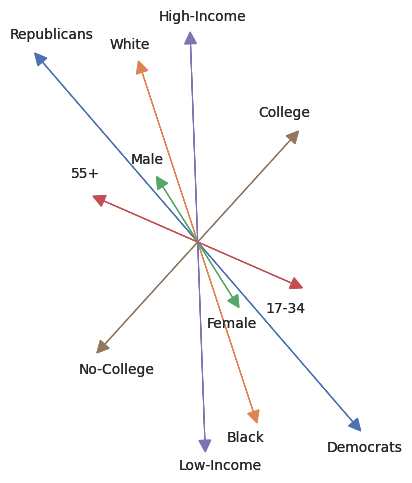

In [73]:
allArrowsSameBins(points2d, attributes=subcats, objs=['party', 'race', 'gender', 'age', 'affluence', 'education'])

In [74]:
def allHeatmapSimilarities(points2d, attributes, objs):
    """ Obtain similarities among communities for the whole year subset

    Parameters:
    points2d -- 2d coordinates for all users
    attributes -- dictionary of pair of communities in an attribute to plot
    objs -- list of the attributes under study
    """
    dens_allGroup = dict()
    for categ in objs:
        for sub in np.array(list(attributesData[categ][0].keys())):
            subUsers = np.array([[0,0]])
            for i in range(len(yearsSubset)):
                subUsers = np.concatenate((subUsers, attributesData[categ][i][sub]), axis=0)
            subUsers = np.delete(subUsers, 0, axis=0)
            dens_allGroup[sub] = list(subUsers)
    
    pointsFilter = gaussian_filter(points2d, sigma=0.5)
    
    # find bounding box
    bbox = {
        'minX': np.min(pointsFilter[:,0]),
        'maxX': np.max(pointsFilter[:,0]),
        'minY': np.min(pointsFilter[:,1]),
        'maxY': np.max(pointsFilter[:,1])
    }
    plotRangeX = np.arange(
        math.floor(bbox['minX'] - 0.5),
        math.ceil(bbox['maxX'] + 1),
        0.3)
    plotRangeY = np.arange(
        math.floor(bbox['minY'] - 0.5),
        math.ceil(bbox['maxY'] + 1),
        0.3)
    
    embed = np.zeros((len(plotRangeX)-1, len(plotRangeY)-1))
    plant = dict()
    for attr in objs:

        # generate histogram
        fig2, ax2 = plt.subplots(figsize=(15,12))
        lsD = np.array(dens_allGroup[attributes[attr][0]])
        lsD = gaussian_filter(lsD, sigma=0.5)
        lsD = np.round(lsD, decimals=3)
        x = lsD[:,0]
        y = lsD[:,1]
        histDem, xbinsDem, ybinsDem, imDem = ax2.hist2d(x,y, bins=[plotRangeX,plotRangeY], cmap = 'plasma')
        plt.close(fig=fig2)

        ls = np.array(dens_allGroup[attributes[attr][0]] + dens_allGroup[attributes[attr][1]])
        ls = gaussian_filter(ls, sigma=0.5)
        l = len(ls)
        ls = np.round(ls, decimals=3)
        fig2, ax2 = plt.subplots(figsize=(15,12))

        x = ls[:,0]
        y = ls[:,1]
        
        hist, xbins, ybins, im = ax2.hist2d(x,y, bins=[plotRangeX,plotRangeY], cmap = 'plasma')
        plt.close(fig=fig2)
        hist = histDem / hist
        
        # devise the embedding
        hist = np.array(hist)
        embed[np.isnan(hist)] = np.nan
        plant[attr] = hist
    
    # Density differences
    cases = ~np.isnan(embed)
    tot = np.sum(np.ones((len(plotRangeX)-1, len(plotRangeY)-1))[cases])
    objsSize = len(objs)
    sim = np.zeros((objsSize,objsSize))
    simDic = dict()
    for i in range(objsSize):
        for j in range(objsSize):
            diff = np.absolute(plant[objs[i]][cases] - plant[objs[j]][cases])
            sim[i,j] = 1. - np.sum(diff)/tot
        simDic[objs[i]] = sim[i,:]
    simData = pd.DataFrame(data=simDic, index=objs)

    mask = np.triu(np.ones_like(sim, dtype=bool))
    plt.figure(figsize=(8,8))
    plot = sns.heatmap(simData, mask=mask, annot=True, annot_kws={"size":12}, fmt=".2f", square=True, 
                linewidths=.5, cbar_kws={"shrink": .5}).set(title=f"Leaning similarity")
    plt.show()

/tmp/ipykernel_56116/2363927548.py:61: RuntimeWarning:

invalid value encountered in true_divide



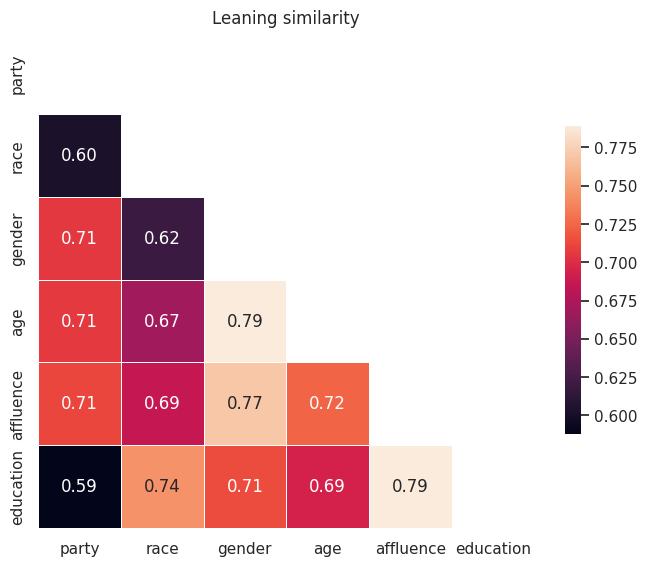

In [75]:
allHeatmapSimilarities(points2d, attributes=subcats, objs=['party', 'race', 'gender', 'age', 'affluence', 'education'])

In [76]:
def allHeatmapPearson(points2d, attributes, objs):
    """ Obtain Pearson coefficient among communities for the whole year subset

    Parameters:
    points2d -- 2d coordinates for all users
    attributes -- dictionary of pair of communities in an attribute to plot
    objs -- list of the attributes under study
    """
    dens_allGroup = dict()
    for categ in objs:
        for sub in np.array(list(attributesData[categ][0].keys())):
            subUsers = np.array([[0,0]])
            for i in range(len(yearsSubset)):
                subUsers = np.concatenate((subUsers, attributesData[categ][i][sub]), axis=0)
            subUsers = np.delete(subUsers, 0, axis=0)
            dens_allGroup[sub] = list(subUsers)

    pointsFilter = gaussian_filter(points2d, sigma=0.5)

    # find bounding box
    bbox = {
        'minX': np.min(pointsFilter[:,0]),
        'maxX': np.max(pointsFilter[:,0]),
        'minY': np.min(pointsFilter[:,1]),
        'maxY': np.max(pointsFilter[:,1])
    }
    plotRangeX = np.arange(
        math.floor(bbox['minX'] - 0.5),
        math.ceil(bbox['maxX'] + 1),
        0.3)
    plotRangeY = np.arange(
        math.floor(bbox['minY'] - 0.5),
        math.ceil(bbox['maxY'] + 1),
        0.3)

    embed = np.zeros((len(plotRangeX)-1, len(plotRangeY)-1))
    plant = dict()
    for attr in objs:

        # generate histogram
        fig2, ax2 = plt.subplots(figsize=(15,12))
        lsD = np.array(dens_allGroup[attributes[attr][0]])
        lsD = gaussian_filter(lsD, sigma=0.5)
        lsD = np.round(lsD, decimals=3)
        x = lsD[:,0]
        y = lsD[:,1]
        histDem, xbinsDem, ybinsDem, imDem = ax2.hist2d(x,y, bins=[plotRangeX,plotRangeY], cmap = 'plasma')
        plt.close(fig=fig2)

        ls = np.array(dens_allGroup[attributes[attr][0]] + dens_allGroup[attributes[attr][1]])
        ls = gaussian_filter(ls, sigma=0.5)
        l = len(ls)
        ls = np.round(ls, decimals=3)
        fig2, ax2 = plt.subplots(figsize=(15,12))

        x = ls[:,0]
        y = ls[:,1]

        hist, xbins, ybins, im = ax2.hist2d(x,y, bins=[plotRangeX,plotRangeY], cmap = 'plasma')
        plt.close(fig=fig2)
        cases = hist < 10
        hist = histDem / hist

        # devise the embedding
        hist = np.array(hist)
        embed[cases] = np.nan
        plant[attr] = hist

    # Pearson correlation
    cases = ~np.isnan(embed)
    objsSize = len(objs)
    sim = np.zeros((objsSize,objsSize))
    simDic = dict()
    for i in range(objsSize):
        for j in range(objsSize):
            sim[i,j] = pearsonr(plant[objs[i]][cases], plant[objs[j]][cases])[0]
        simDic[objs[i]] = sim[i,:]
    simData = pd.DataFrame(data=simDic, index=objs)

    mask = np.triu(np.ones_like(sim, dtype=bool))
    plt.figure(figsize=(8,8))
    plot = sns.heatmap(simData, mask=mask, annot=True, annot_kws={"size":12}, fmt=".2f", square=True, 
                linewidths=.5, cbar_kws={"shrink": .5}).set(title=f"Leaning correlation")
    plt.show()

/tmp/ipykernel_56116/3685010261.py:62: RuntimeWarning:

invalid value encountered in true_divide



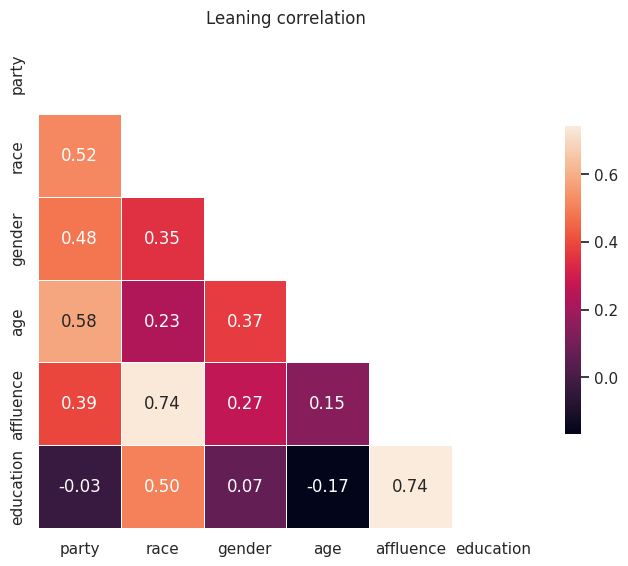

In [77]:
allHeatmapPearson(points2d, attributes=subcats, objs=['party', 'race', 'gender', 'age', 'affluence', 'education'])

In [55]:
def plotCentersSubset(objs):
    """ Plot centers of a sample of communities for the whole year subset

    Parameters:
    objs -- list of the attributes under study
    """
    for i in range(len(yearsSubset)):
        plt.figure(figsize=(5,4))
        for categ in objs:
            for sub in subcats[categ]:
                center = meanPoints(np.array(attributesData[categ][i][sub]))
                plt.scatter(center[0], center[1], label=sub)
                plt.annotate(sub, (center[0], center[1]))
        plt.title(str(yearsSubset[i]))
        plt.axis('equal')
        plt.show()

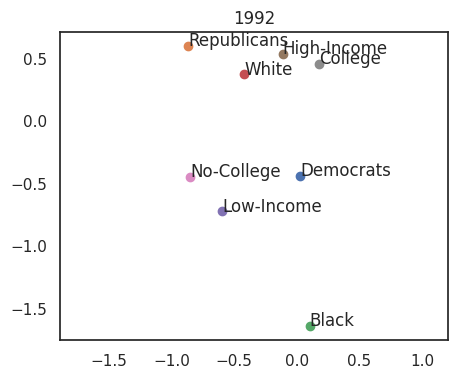

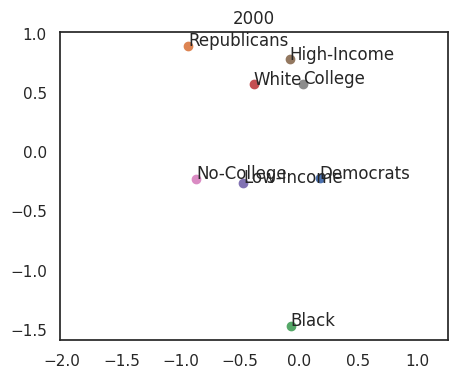

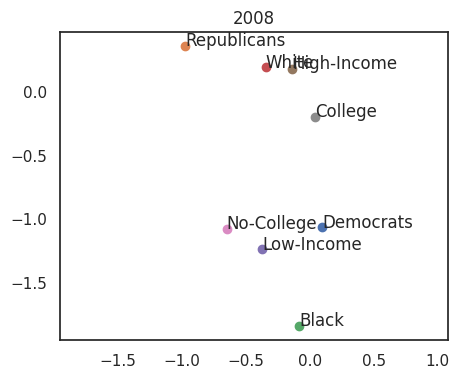

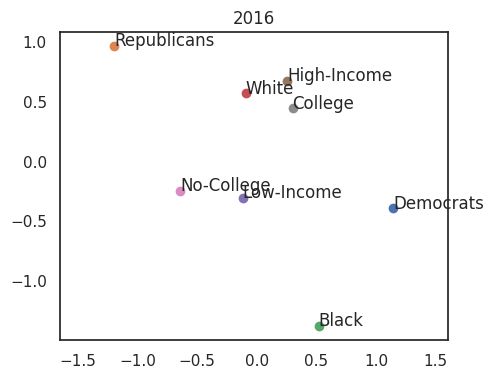

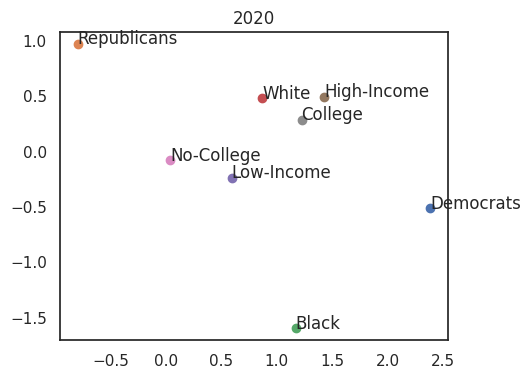

In [56]:
plotCentersSubset(['party', 'race', 'affluence', 'education'])

In [65]:
def plotCentersWhole(objs):
    """ Plot centers of a sample of communities for the whole year subset in the same space

    Parameters:
    objs -- list of the attributes under study
    """
    attributes = list()
    for categ in objs:
        for sub in subcats[categ]:
            attributes.append(sub)
    
    centerGlob = np.array([[0,0]])
    for k in range(len(yearsSubset)):
        attributesYear = np.array([[0,0]])
        for sub in np.array(list(attributesData['party'][k].keys())):
            attributesYear = np.concatenate((attributesYear, attributesData['party'][k][sub]), axis=0)
        attributesYear = np.delete(attributesYear, 0, axis=0)
        center = meanPoints(attributesYear)
        centerGlob = np.concatenate((centerGlob, [np.array(center)]), axis=0)
    centerGlob = np.delete(centerGlob, 0, axis=0)
    
    acronym = ['$D$', '$R$', '$B$', '$W$', '$LI$', '$HI$', '$NC$', '$C$']
    colors = ['C0', 'C3', 'C5', 'C6', 'C4', 'C2', 'C7', 'C1']
    edco = ['blue', 'red', 'brown', 'pink', 'purple', 'green', 'gray', 'orange']
    centroids = list()
    plt.figure(figsize=(8,8))
    for k in range(len(yearsSubset)):
        for i,categ in enumerate(objs):
            for j,sub in enumerate(subcats[categ]):
                center = meanPoints(np.array(attributesData[categ][k][sub])) - centerGlob[k]
                plt.scatter(center[0], center[1], marker='.', c=edco[j + 2*i], s=50)
                centroids.append(center)
                
    items = len(yearsSubset) - 1
    for k in range(items):
        for i,categ in enumerate(objs):
            for j in range(len(subcats[categ])):
                c1 = centroids[2*k*items + j + 2*i]
                c2 = centroids[2*(k + 1)*items + j + 2*i]
                diff = c2 - c1
                plus = c2 + c1
                plt.arrow(c1[0], c1[1], diff[0], diff[1], color=colors[j + 2*i])
                plt.arrow(plus[0]/2, plus[1]/2, 0.01*diff[0], 0.01*diff[1], color=colors[j + 2*i], 
                          shape='full', lw=0, head_width=.06, overhang=0.2)
            
    
    plt.scatter(0, 0, marker='*', c='yellow', ec='k', s=150)
    custom_lines = [Line2D([0], [0], color=colors[c], lw=4) for c in range(len(colors))]
    plt.legend(custom_lines, attributes, loc='lower left', fontsize=15)
    plt.axis('equal')
    plt.xticks(fontsize=17)
    plt.yticks(fontsize=17)
    plt.xlabel('$X$', fontsize=17)
    plt.ylabel('$Y$', fontsize=17)
    plt.grid()
    plt.show()
#    plt.savefig('../centers_communities_arrows_sns.pdf', bbox_inches="tight")

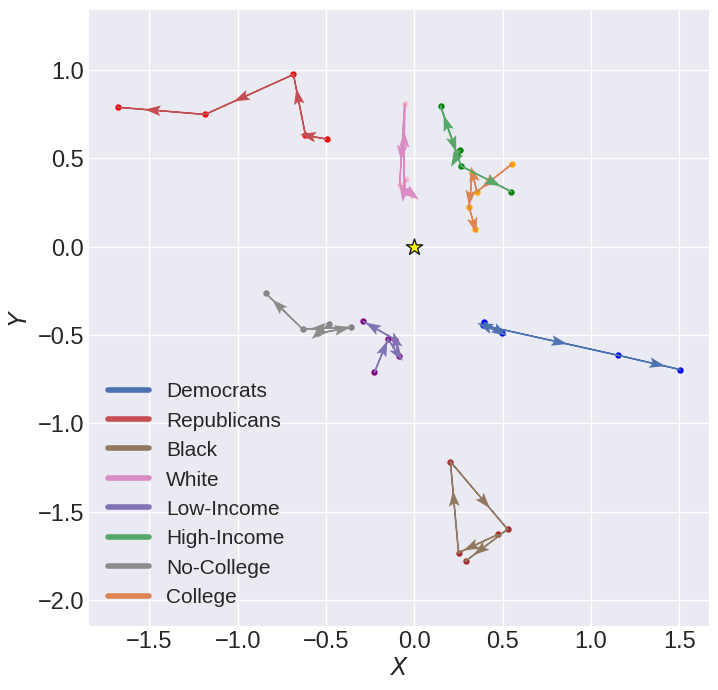

In [66]:
plt.style.use('seaborn-dark')
plotCentersWhole(['party', 'race', 'affluence', 'education'])

In [59]:
def plotCentersWholeDrift(objs):
    """ Plot centers of a sample of communities for the whole year subset in the same space

    Parameters:
    objs -- list of the attributes under study
    """
    attributes = list()
    for categ in objs:
        for sub in subcats[categ]:
            attributes.append(sub)
    
    markers = ['$A$', '$B$', '$C$', '$D$', '$E$']
    colors = ['C0', 'C3', 'C5', 'C6', 'C4', 'C2', 'C7', 'C1']
    edco = ['blue', 'red', 'brown', 'pink', 'purple', 'green', 'gray', 'orange']
    centroids = list()
    plt.figure(figsize=(8,8))
    for k in range(len(yearsSubset)):
        for i,categ in enumerate(objs):
            for j,sub in enumerate(subcats[categ]):
                center = meanPoints(np.array(attributesData[categ][k][sub]))
                plt.scatter(center[0], center[1], marker='.', c=edco[j + 2*i], s=50)
                centroids.append(np.array(center))
                
    items = len(yearsSubset) - 1
    for k in range(items):
        for i,categ in enumerate(objs):
            for j in range(len(subcats[categ])):
                c1 = centroids[2*k*items + j + 2*i]
                c2 = centroids[2*(k + 1)*items + j + 2*i]
                diff = c2 - c1
                plus = c2 + c1
                plt.arrow(c1[0], c1[1], diff[0], diff[1], color=colors[j + 2*i])
                plt.arrow(plus[0]/2, plus[1]/2, 0.01*diff[0], 0.01*diff[1], color=colors[j + 2*i], 
                          shape='full', lw=0, head_width=.06, overhang=0.2)
                
    custom_lines = [Line2D([0], [0], color=colors[c], lw=4) for c in range(len(colors))]
    plt.legend(custom_lines, attributes, loc='lower right', fontsize=14)
    plt.axis('equal')
    plt.xticks(fontsize=17)
    plt.yticks(fontsize=17)
    plt.grid()
    plt.show()
#    plt.savefig('../centers_communities_arrows_static.pdf', bbox_inches="tight")

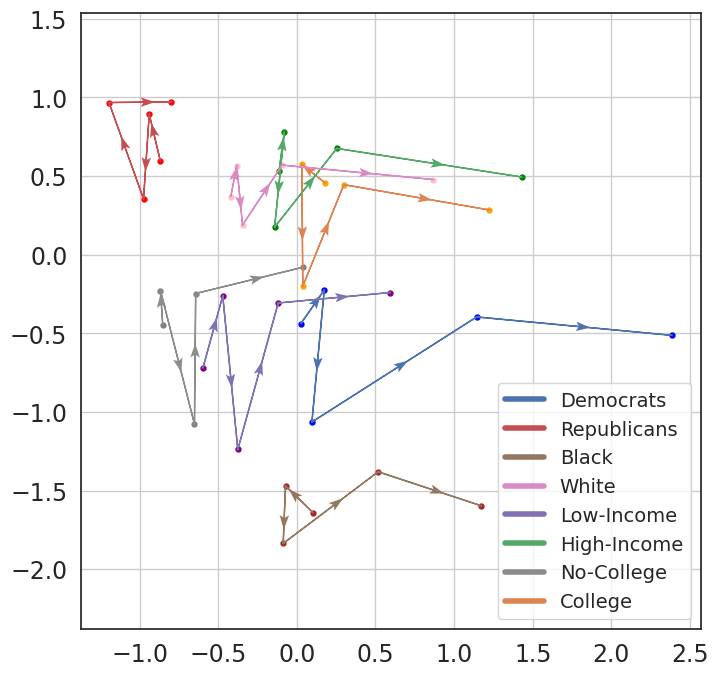

In [60]:
plotCentersWholeDrift(['party', 'race', 'affluence', 'education'])

Numerical location.

In [55]:
def locationCenters(objs):
    """ Return center coords for every community in dictionary form for the last year of the subset

    Parameters:
    objs -- list of the attributes under study
    """
    attr = dict()
    for categ in objs:
        for sub in subcats[categ]:
            center = (meanPoints(np.array(attributesData[categ][3][sub])))
            attr[sub] = center[0], center[1]
        
    return attr

In [56]:
attr = locationCenters(['party', 'race', 'affluence', 'education'])

print(math.dist(attr['Republicans'], attr['College']))
print(math.dist(attr['Republicans'], attr['No-College']))
print(math.dist(attr['Democrats'], attr['College']))
print(math.dist(attr['Democrats'], attr['No-College']))

1.5822243302690775
1.3337922270035496
1.1919638216534967
1.792957724242605


Comparison of distances between attribute centers.

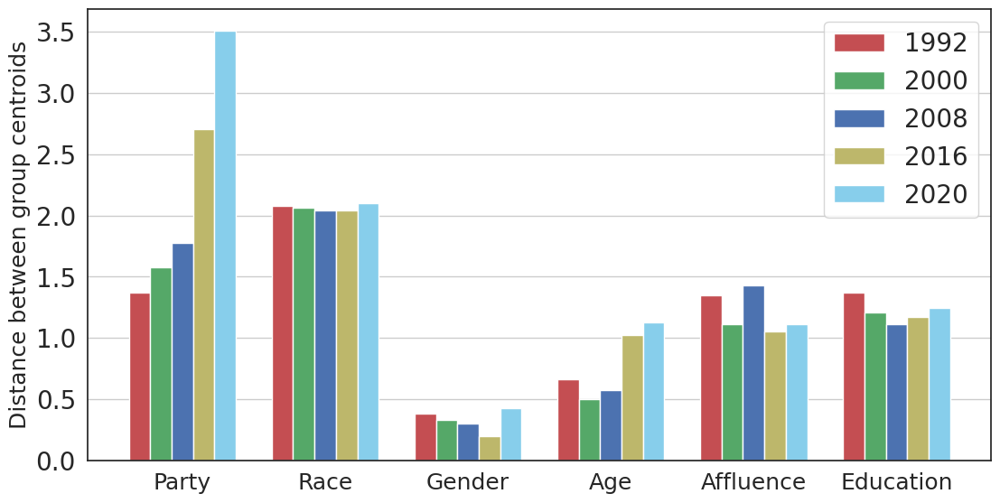

In [63]:
categs =  list(attributesData.keys()) # all attribute names
col_names = ["Year"] + [sub.capitalize() for sub in categs]
distances = list() # to contain distances between centers
errdist = list() # to contain error distance
for i in range(len(yearsSubset)):
    distances.append([yearsSubset[i]])
    errdist.append([yearsSubset[i]])
    for att in categs:
        coords = list()
        errors = list()
        # compute distance between both centers in the community
        for sub in subcats[att]:
            points = np.array(attributesData[att][i][sub])
            coords.append(meanPoints(points))
            errors.append(np.std(points, axis=0)/np.sqrt(len(points)))
        distances[i].append(math.dist(coords[0], coords[1]))
        errdist[i].append(np.sqrt(np.dot(errors[0], errors[0]) + np.dot(errors[1], errors[1])))
# print(tabulate(distances, headers=col_names))

# plot distances
colors = ['r','g','b', 'darkkhaki', 'skyblue', 'purple', 'olive', 'pink', 'orange']
fig = plt.figure(figsize=(10,5))
x = np.arange(len(col_names[1:]))
ax = fig.add_axes([0,0,1,1])

for i in range(len(yearsSubset)):
    ax.bar((x-0.3) + (i*0.75/len(yearsSubset)), distances[i][1:], color=colors[i], label=yearsSubset[i],
            width = 0.75/len(yearsSubset))
           #, yerr=errdist[i][1:], error_kw=dict(lw=1, capsize=3, capthick=1))

ax.grid(axis='y')

ax.set_xticks(x)
ax.set_xticklabels(col_names[1:], fontsize=18)
# ax.set_yticks([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5],
#                labels=['0.0', ' ', '1.0', ' ', '2.0', ' ', '3.0', ' '])
ax.tick_params(axis='y', labelsize=20)
ax.set_ylabel("Distance between group centroids", fontsize=18)

ax.legend(loc='best', fontsize=20)
#plt.savefig('../distances_attributes.pdf', bbox_inches="tight")

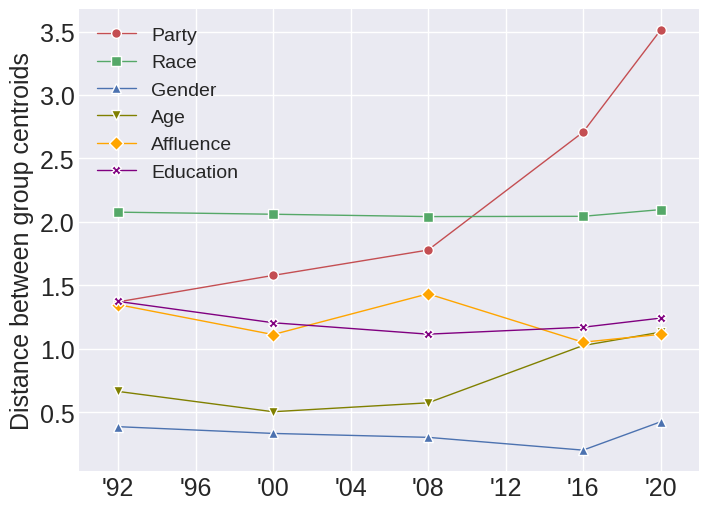

In [52]:
categs =  list(attributesData.keys()) # all attribute names
col_names = ["Year"] + [sub.capitalize() for sub in categs]
distances = list() # to contain distances between centers
for n,att in enumerate(categs):
    distances.append([att])
    for i in range(len(yearsSubset)):
        coords = list()
        # compute distance between both centers in the community
        for sub in subcats[att]:
            points = np.array(attributesData[att][i][sub])
            coords.append(meanPoints(points))
        distances[n].append(math.dist(coords[0], coords[1]))


colors = ['r','g','b', 'olive', 'orange', 'purple', 'darkkhaki', 'pink', 'skyblue']
markers=['o', 's', '^', 'v', 'D', 'X']
# fig = plt.figure(figsize=(8,5))
# x = np.arange(len(yearsSubset))
# ax = fig.add_axes([0,0,1,1])

# ax.grid(color='white')
# ax.set_xticks(x)
# ax.set_xticklabels(yearsSubset, fontsize=18)
# ax.set_xlim([-0.3, 4.3])
# ax.tick_params(axis='y', labelsize=20)
# ax.set_ylabel("Distance between group centroids", fontsize=18)

# for n,att in enumerate(categs):
#     plt.plot(x, distances[n][1:], color=colors[n], label=att.capitalize(), 
#              marker=markers[n], markersize=8, linestyle='-', markeredgecolor='white')

# ax.legend(loc='upper left', fontsize=14)
# ax.set_facecolor('aliceblue')

fig, ax = plt.subplots(figsize=(8,6))
ax.grid()
ax.set_xticks([1992, 1996, 2000, 2004, 2008, 2012, 2016, 2020])
ax.set_xticklabels(['\'92', '\'96', '\'00', '\'04', '\'08', '\'12', '\'16', '\'20'], fontsize=18)
ax.set_xlim([1990, 2022])
ax.tick_params(axis='y', labelsize=18)
ax.set_ylabel("Distance between group centroids", fontsize=18)

for n,att in enumerate(categs):
    plt.plot(yearsSubset, distances[n][1:], color=colors[n], label=att.capitalize(), 
             marker=markers[n], markersize=7, linestyle='-', linewidth=1,
             markeredgecolor='white', markeredgewidth=1)

ax.legend(loc='upper left', fontsize=14)
plt.style.use('seaborn-dark')
plt.show()
#plt.savefig('../distances_attributes_sns.pdf', bbox_inches="tight")

In [91]:
def getHeatMapDist(objs):
    """ Plot heat map of the distance between communities for each attribute and each year of the subset

    Parameters:
    objs -- list of the attributes under study
    """
    t = len(yearsSubset)
    distDic = dict()
    for categ in objs:
        dist = np.array([])
        for k in range(t):
            coords = list()
            for sub in subcats[categ]:
                coords.append(meanPoints(np.array(attributesData[categ][k][sub])))
            dist = np.append(dist, math.dist(coords[0], coords[1]))
        distDic[categ] = dist
    distData = pd.DataFrame(data=distDic, index=yearsSubset)
    
    fig, ax = plt.subplots(figsize=(10,10))
    sns.heatmap(distData, annot=True, annot_kws={"size":20}, fmt=".2f", square=True, 
                linewidths=.5, cbar_kws={"shrink": .5})
    #.set(title=f"Radius of gyration")

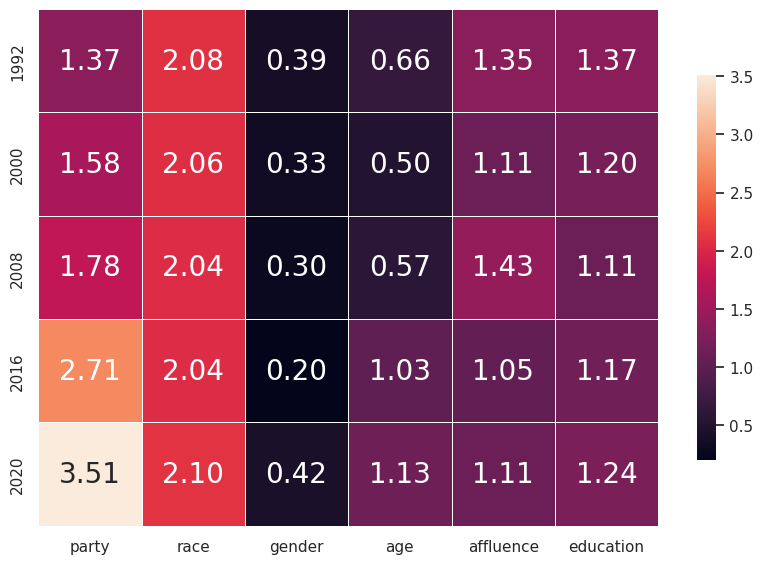

In [92]:
getHeatMapDist(['party', 'race', 'gender', 'age', 'affluence', 'education'])

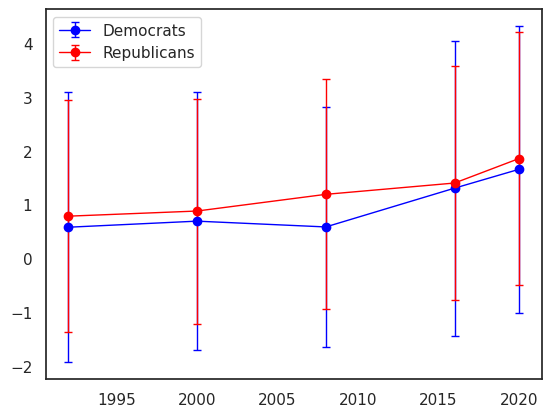

In [73]:
centerGlob = np.array([[0,0]])
for k in range(len(yearsSubset)):
    attributesYear = np.array([[0,0]])
    for sub in np.array(list(attributesData['party'][k].keys())):
        attributesYear = np.concatenate((attributesYear, attributesData['party'][k][sub]), axis=0)
    attributesYear = np.delete(attributesYear, 0, axis=0)
    center = meanPoints(attributesYear)
    centerGlob = np.concatenate((centerGlob, [np.array(center)]), axis=0)
centerGlob = np.delete(centerGlob, 0, axis=0)

categ = 'party'
dist = np.empty([len(yearsSubset), 2])
Rg = np.empty([len(yearsSubset), 2])
for k in range(len(yearsSubset)):
    for i,sub in enumerate(subcats[categ]):
        subUsers = np.array(attributesData[categ][k][sub])
        center = meanPoints(subUsers)
        dist[k,i] = math.dist(center, centerGlob[k])
        Rg[k,i] = np.sqrt(np.var(subUsers[:,0]) + np.var(subUsers[:,1]))

plt.errorbar(yearsSubset, dist[:,0], color='blue', label=subcats[categ][0], marker='o', linestyle='-', 
             yerr=Rg[:,0], lw=1, capsize=3, capthick=1)
plt.errorbar(yearsSubset, dist[:,1], color='red', label=subcats[categ][1], marker='o', linestyle='-', 
             yerr=Rg[:,1], lw=1, capsize=3, capthick=1)
plt.legend()

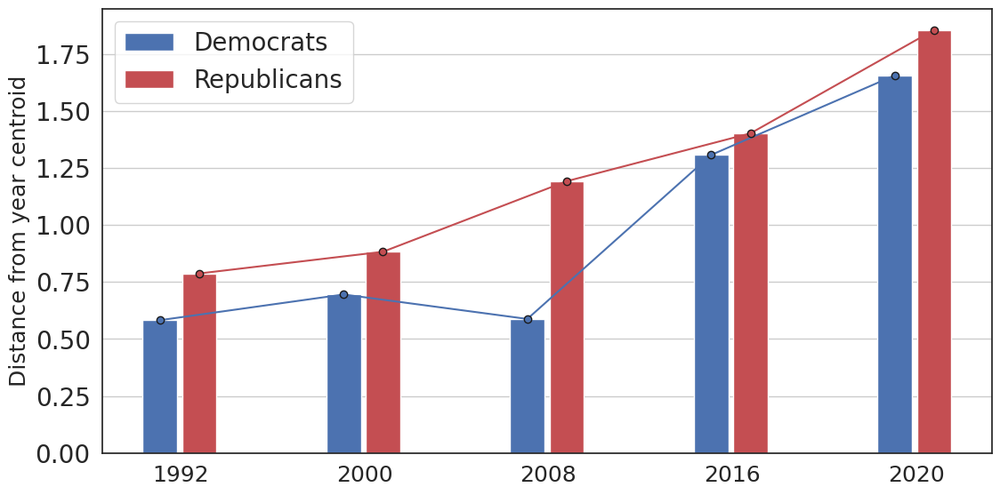

In [94]:
centerGlob = np.array([[0,0]])
errGlob = np.array([[0,0]])
for k in range(len(yearsSubset)):
    attributesYear = np.array([[0,0]])
    for sub in np.array(list(attributesData['party'][k].keys())):
        attributesYear = np.concatenate((attributesYear, attributesData['party'][k][sub]), axis=0)
    attributesYear = np.delete(attributesYear, 0, axis=0)
    errGlob = np.concatenate((errGlob, [np.std(attributesYear, axis=0)/np.sqrt(len(attributesYear))]), axis=0)
    center = meanPoints(attributesYear)
    centerGlob = np.concatenate((centerGlob, [np.array(center)]), axis=0)
centerGlob = np.delete(centerGlob, 0, axis=0)
errGlob = np.delete(errGlob, 0, axis=0)

categ = 'party'
dist = np.empty([len(yearsSubset), 2])
errdist = np.empty([len(yearsSubset), 2])
for k in range(len(yearsSubset)):
    for i,sub in enumerate(subcats[categ]):
        points = np.array(attributesData[categ][k][sub])
        center = meanPoints(points)
        error = np.std(points, axis=0)/np.sqrt(len(points))
        dist[k,i] = math.dist(center, centerGlob[k])
        errdist[k,i] = np.sqrt(np.dot(error, error) + np.dot(errGlob[k], errGlob[k]))

# plot distances
colors = ['b','r']
fig = plt.figure(figsize=(10,5))
x = np.arange(len(yearsSubset))
ax = fig.add_axes([0,0,1,1])

for i in range(2):
    ax.bar((x-0.115) + (i*0.75/3.5), dist[:,i], color=colors[i], label=subcats[categ][i],
            width = 0.75/4.)
           #, yerr=errdist[:,i], error_kw=dict(lw=1, capsize=3, capthick=1))

ax.grid(axis='y')

ax.set_xticks(x)
ax.set_xticklabels(yearsSubset, fontsize=18)
# ax.set_yticks([0.0, 0.25, 0.5, 0.75, 1.0, 1.25, 1.5, 1.75, 2.0],
#                labels=['0.0', ' ', '0.5', ' ', '1.0', ' ', '1.5', ' ', '2.0'])
ax.tick_params(axis='y', labelsize=20)
ax.set_ylabel("Distance from year centroid", fontsize=18)

plt.plot((x-0.115), dist[:,0], color='b', marker='o', markeredgecolor='k', linestyle='-')
plt.plot((x-0.115) + (0.75/3.5), dist[:,1], color='r', marker='o', markeredgecolor='k', linestyle='-')

ax.legend(loc='best', fontsize=20)
#plt.savefig('../distances_party.pdf', bbox_inches="tight")

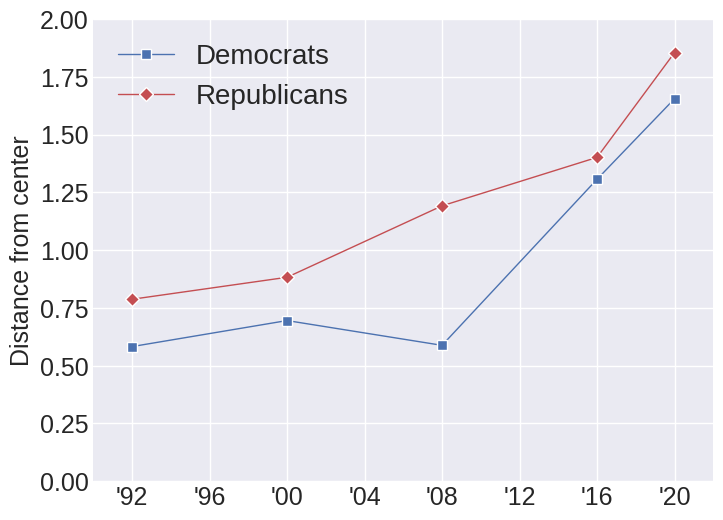

In [68]:
centerGlob = np.array([[0,0]])
for k in range(len(yearsSubset)):
    attributesYear = np.array([[0,0]])
    for sub in np.array(list(attributesData['party'][k].keys())):
        attributesYear = np.concatenate((attributesYear, attributesData['party'][k][sub]), axis=0)
    attributesYear = np.delete(attributesYear, 0, axis=0)
    center = meanPoints(attributesYear)
    centerGlob = np.concatenate((centerGlob, [np.array(center)]), axis=0)
centerGlob = np.delete(centerGlob, 0, axis=0)

categ = 'party'
dist = np.empty([len(yearsSubset), 2])
for k in range(len(yearsSubset)):
    for i,sub in enumerate(subcats[categ]):
        points = np.array(attributesData[categ][k][sub])
        center = meanPoints(points)
        dist[k,i] = math.dist(center, centerGlob[k])

fig, ax = plt.subplots(figsize=(8,6))
ax.grid()
ax.set_xticks([1992, 1996, 2000, 2004, 2008, 2012, 2016, 2020])
ax.set_xticklabels(['\'92', '\'96', '\'00', '\'04', '\'08', '\'12', '\'16', '\'20'], fontsize=18)
ax.set_xlim([1990, 2022])
ax.set_ylim([0.0, 2.0])
# ax.set_yticks([0.0, 0.25, 0.5, 0.75, 1.0, 1.25, 1.5, 1.75, 2.0],
#                labels=['0.0', ' ', '0.5', ' ', '1.0', ' ', '1.5', ' ', '2.0'])
ax.tick_params(axis='y', labelsize=18)
ax.set_ylabel("Distance from center", fontsize=18)

colors = ['b', 'r']
markers=['s', 'D']
for i in range(2):
    plt.plot(yearsSubset, dist[:,i], color=colors[i], label=subcats['party'][i], 
             marker=markers[i], markersize=7, linestyle='-', linewidth=1,
             markeredgecolor='white', markeredgewidth=1)

ax.legend(loc='upper left', fontsize=20)
plt.style.use('seaborn-dark')
plt.show()
#plt.savefig('../distances_party_sns.pdf', bbox_inches="tight")

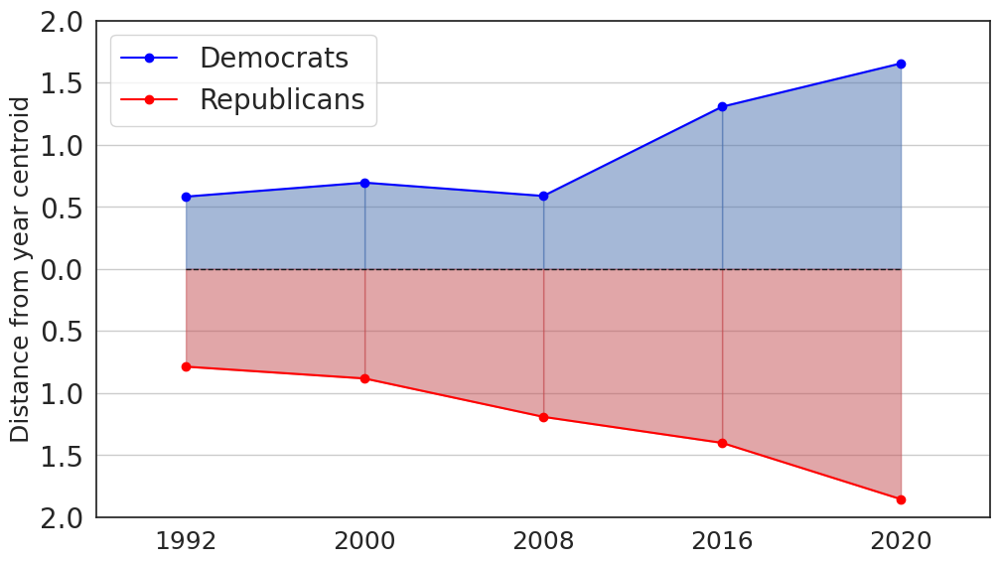

In [106]:
centerGlob = np.array([[0,0]])
for k in range(len(yearsSubset)):
    attributesYear = np.array([[0,0]])
    for sub in np.array(list(attributesData['party'][k].keys())):
        attributesYear = np.concatenate((attributesYear, attributesData['party'][k][sub]), axis=0)
    attributesYear = np.delete(attributesYear, 0, axis=0)
    center = meanPoints(attributesYear)
    centerGlob = np.concatenate((centerGlob, [np.array(center)]), axis=0)
centerGlob = np.delete(centerGlob, 0, axis=0)

categ = 'party'
dist = np.empty([len(yearsSubset), 2])
for k in range(len(yearsSubset)):
    for i,sub in enumerate(subcats[categ]):
        center = meanPoints(np.array(attributesData[categ][k][sub]))
        dist[k,i] = math.dist(center, centerGlob[k])

# plot distances
colors = ['b','r']
fig = plt.figure(figsize=(9,5))
x = np.arange(len(yearsSubset))
ax = fig.add_axes([0,0,1,1])

# for i in range(2):
#     ax.bar((x-0.115) + (i*0.75/3.5), 0., color=colors[i], width = 0.1)

plt.axhline(0, 0.1, 0.9, color='k', linewidth=1, ls='--')
for k in range(len(yearsSubset)-1):
    plt.fill_between(np.array([k, k+1]), np.array([dist[k,0], dist[k+1,0]]), color='C0', alpha=0.5)
    plt.fill_between(np.array([k, k+1]), np.array([-dist[k,1], -dist[k+1,1]]), color='C3', alpha=0.5)

ax.set_xticks(x)
ax.set_xticklabels(yearsSubset, fontsize=18)
ax.set_ylabel("Distance from year centroid", fontsize=18)

plt.plot(x, dist[:,0], color='blue', label=subcats[categ][0], marker='o', linestyle='-')
plt.plot(x, -dist[:,1], color='red', label=subcats[categ][1], marker='o', linestyle='-')

ax.legend()
ax.grid(axis='y')
ax.set_xlim([-0.5, 4.5])
ax.set_ylim([-2, 2])
labelist = ['2.0', '1.5', '1.0', '0.5']
ax.set_yticks(np.linspace(-2.0, 2.0, 9), labelist + ['0.0'] + list(reversed(labelist)))
ax.tick_params(axis='y', labelsize=20)
ax.legend(loc='best', fontsize=20)
#plt.savefig('../distances_party_shadows.pdf', bbox_inches="tight")

In [96]:
num = np.zeros(len(yearsSubset))
for k in range(len(yearsSubset)):
    for sub in np.array(list(attributesData['party'][k].keys())):
        num[k] += len(attributesData['party'][k][sub])
print(num.astype(int))

[2485 1807 2322 2500 2500]


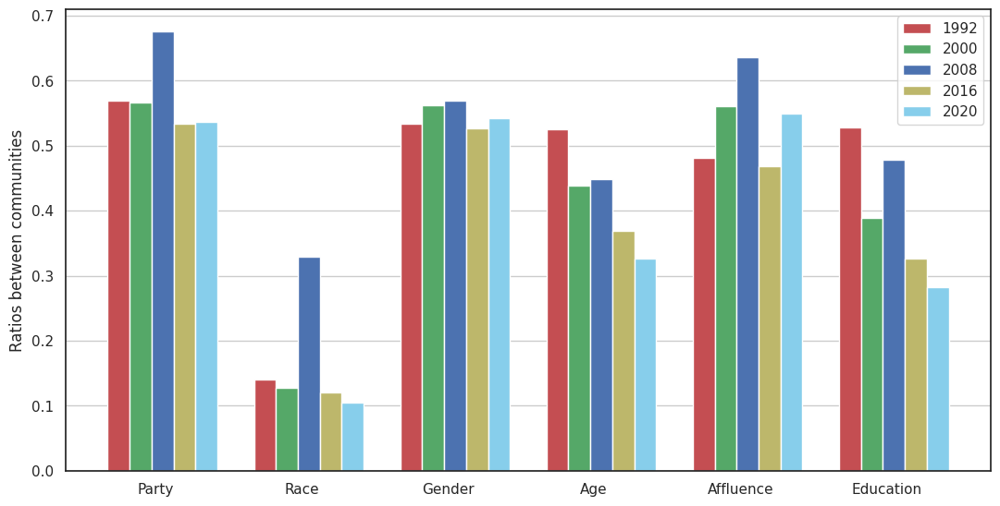

In [97]:
categs =  list(attributesData.keys()) # all attribute names
col_names = ["Year"] + [sub.capitalize() for sub in categs]
ratios = list() # to contain ratios between communities
for i in range(len(yearsSubset)):
    ratios.append([yearsSubset[i]])
    for att in categs:
        num = list()
        # compute ratio between number of users of both communities
        for sub in subcats[att]:
            points = attributesData[att][i][sub]
            num.append(len(attributesData[att][i][sub]))
        ratios[i].append(num[0]/(num[0] + num[1]))
# print(tabulate(distances, headers=col_names))

# plot distances
colors = ['r','g','b', 'darkkhaki', 'skyblue', 'purple', 'olive', 'pink', 'orange']
fig = plt.figure(figsize=(10,5))
x = np.arange(len(col_names[1:]))
ax = fig.add_axes([0,0,1,1])

for i in range(len(yearsSubset)):
    ax.bar((x-0.25) + (i*0.75/len(yearsSubset)), ratios[i][1:], color=colors[i], label=yearsSubset[i], width = 0.75/len(yearsSubset))

ax.grid(axis='y')

ax.set_xticks(x)
ax.set_xticklabels(col_names[1:])
ax.set_ylabel("Ratios between communities")

ax.legend()

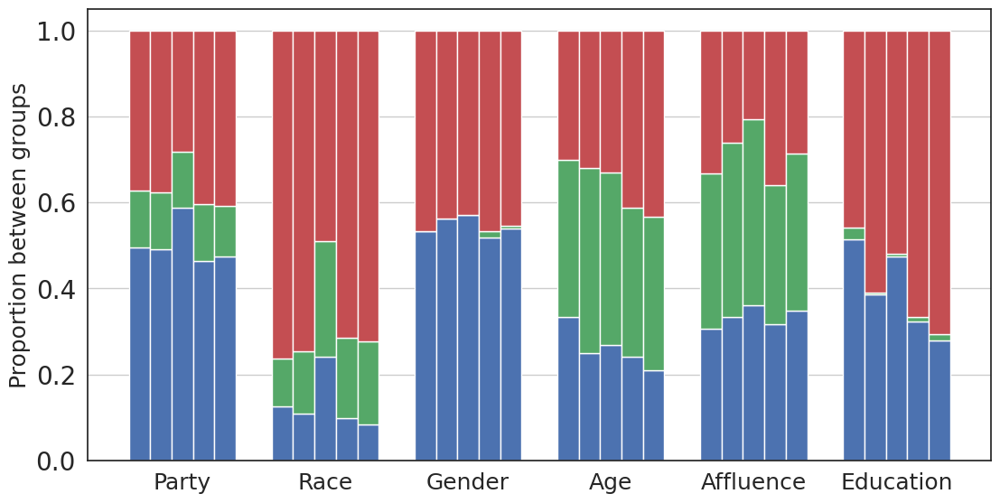

In [49]:
tot = np.zeros(len(yearsSubset))
for k in range(len(yearsSubset)):
    for sub in np.array(list(attributesData['party'][k].keys())):
        tot[k] += len(attributesData['party'][k][sub])

categs =  list(attributesData.keys()) # all attribute names
col_names = ["Year"] + [sub.capitalize() for sub in categs]
ratio1, ratio2, other = list(), list(), list() # to contain ratios between communities
for i in range(len(yearsSubset)):
    ratio1.append([yearsSubset[i]])
    ratio2.append([yearsSubset[i]])
    other.append([yearsSubset[i]])
    for att in categs:
        num = list()
        # compute ratio between number of users of both communities
        for sub in subcats[att]:
            points = attributesData[att][i][sub]
            num.append(len(attributesData[att][i][sub]))
        ratio1[i].append(num[0]/tot[i])
        ratio2[i].append(num[1]/tot[i])
        other[i].append(1.0 - (num[0] + num[1])/tot[i])
# print(tabulate(distances, headers=col_names))

# plot distances
colors = ['r','g','b', 'darkkhaki', 'skyblue', 'purple', 'olive', 'pink', 'orange']
fig = plt.figure(figsize=(10,5))
x = np.arange(len(col_names[1:]))
ax = fig.add_axes([0,0,1,1])

for i in range(len(yearsSubset)):
    ax.bar((x-0.3) + (i*0.75/len(yearsSubset)), ratio1[i][1:], color='b', width = 0.75/len(yearsSubset))
    ax.bar((x-0.3) + (i*0.75/len(yearsSubset)), other[i][1:], color='g', width = 0.75/len(yearsSubset), 
           bottom=ratio1[i][1:])
    ax.bar((x-0.3) + (i*0.75/len(yearsSubset)), ratio2[i][1:], color='r', width = 0.75/len(yearsSubset), 
           bottom=np.array(ratio1[i][1:]) + np.array(other[i][1:]))

ax.grid(axis='y')

ax.tick_params(axis='y', labelsize=20)
ax.set_xticks(x)
ax.set_xticklabels(col_names[1:], fontsize=18)
ax.set_ylabel("Proportion between groups", fontsize=18)
plt.show()
#plt.savefig('../proportions_groups.pdf', bbox_inches="tight")

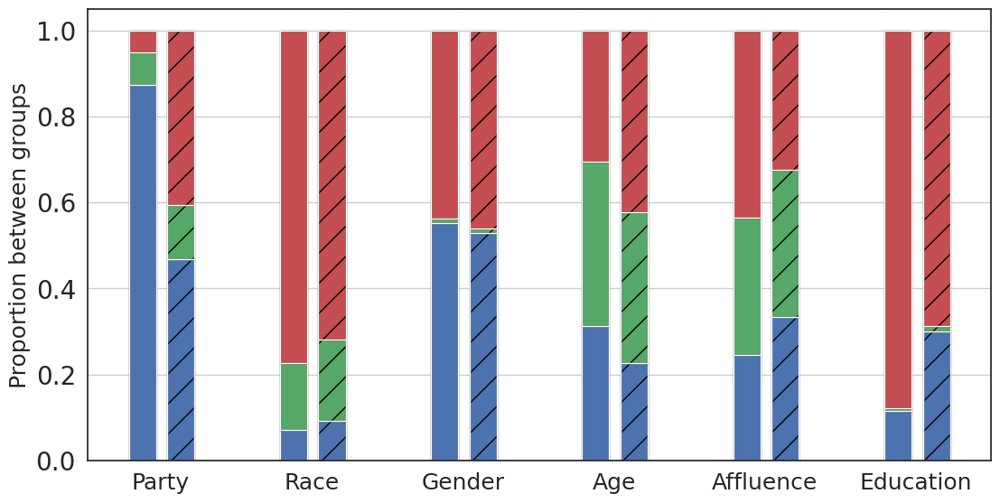

In [97]:
# FOR X > 3.0
tot = len([p for p in points2d[:,0] if p > 3.0])

categs =  list(attributesData.keys()) # all attribute names
col_names = ["Year"] + [sub.capitalize() for sub in categs]
ratio1g3, ratio2g3, otherg3 = list(), list(), list() # to contain ratios between communities
ratio1g3.append(3)
ratio2g3.append(3)
otherg3.append(3)
for n,att in enumerate(categs):
    num = list()
    # compute ratio between number of users of both communities
    for sub in subcats[att]:
        points = np.array([[0,0]])
        for i in range(len(yearsSubset)):
            points = np.concatenate((points, attributesData[att][i][sub]), axis=0)
        points = np.delete(points, 0, axis=0)
        num.append(len([p for p in points if p[0] > 3.0]))
    ratio1g3.append(num[0]/tot)
    ratio2g3.append(num[1]/tot)
    otherg3.append(1.0 - (num[0] + num[1])/tot)

ratio1g3 = np.array(ratio1g3, dtype=float)
ratio2g3 = np.array(ratio2g3, dtype=float)
otherg3 = np.array(otherg3, dtype=float)

ratio1g3 = np.array([ratio1g3, (np.array(ratio1[3], dtype=float) + np.array(ratio1[4], dtype=float))*0.5])
ratio2g3 = np.array([ratio2g3, (np.array(ratio2[3], dtype=float) + np.array(ratio2[4], dtype=float))*0.5])
otherg3 = np.array([otherg3, (np.array(other[3], dtype=float) + np.array(other[4], dtype=float))*0.5])


# plot distances
colors = ['r','g','b', 'darkkhaki', 'skyblue', 'purple', 'olive', 'pink', 'orange']
fill = ['', '/']
fig = plt.figure(figsize=(10,5))
x = np.arange(len(col_names[1:]))
ax = fig.add_axes([0,0,1,1])
ample = 0.18

for i in range(2):
    ax.bar((x-0.12) + (i*0.15)*1.7, ratio1g3[i][1:], color='b', edgecolor='black', width = ample, hatch=fill[i])
    ax.bar((x-0.12) + (i*0.15)*1.7, ratio1g3[i][1:], color='none', width = ample)
    ax.bar((x-0.12) + (i*0.15)*1.7, otherg3[i][1:], color='g', edgecolor='black', width = ample, hatch=fill[i], 
           bottom=ratio1g3[i][1:])
    ax.bar((x-0.12) + (i*0.15)*1.7, otherg3[i][1:], color='none', width = ample, 
           bottom=ratio1g3[i][1:])
    ax.bar((x-0.12) + (i*0.15)*1.7, ratio2g3[i][1:], color='r', edgecolor='black', width = ample, hatch=fill[i], 
           bottom=np.array(ratio1g3[i][1:]) + np.array(otherg3[i][1:]))
    ax.bar((x-0.12) + (i*0.15)*1.7, ratio2g3[i][1:], color='none', width = ample, 
           bottom=np.array(ratio1g3[i][1:]) + np.array(otherg3[i][1:]))

ax.grid(axis='y')
ax.tick_params(axis='y', labelsize=20)
ax.set_xticks(x)
ax.set_xticklabels(col_names[1:], fontsize=18)
ax.set_ylabel("Proportion between groups", fontsize=18)
plt.show()
#plt.savefig('../proportions_groups_novelregion.pdf', bbox_inches="tight")

In [98]:
tot

1259

In [82]:
print(ratio1g3)
print(ratio2g3)

[[3.00000000e+00 8.73709293e-01 7.14853058e-02 5.51231136e-01
  3.12946783e-01 2.46227164e-01 1.15965052e-01]
 [2.01800000e+03 4.68200000e-01 9.14000000e-02 5.28800000e-01
  2.25600000e-01 3.33200000e-01 3.00800000e-01]]
[[3.00000000e+00 5.16282764e-02 7.72835584e-01 4.37648928e-01
  3.05003971e-01 4.34471803e-01 8.78474980e-01]
 [2.01800000e+03 4.06600000e-01 7.18800000e-01 4.60400000e-01
  4.23200000e-01 3.23400000e-01 6.87000000e-01]]


Coordinates of every community center.

In [100]:
categs = list(attributesData.keys())

col_names = list(["Year"])
for cat in categs:
    for sc in subcats[cat]:
        col_names.append(sc)
coords = list()
for i in range(len(yearsSubset)):
    coords.append([yearsSubset[i]])
    for cat in categs:
        for sub in subcats[cat]:
            points = attributesData[cat][i][sub]
            p = meanPoints(np.array(points))
            coords[i].append((str(round(p[0], 2)), str(round(p[1], 2))))
            
coords
print(tabulate(coords, headers=col_names))

  Year  Democrats          Republicans        Black               White              Female              Male                17-34               55+                 Low-Income          High-Income        No-College          College
------  -----------------  -----------------  ------------------  -----------------  ------------------  ------------------  ------------------  ------------------  ------------------  -----------------  ------------------  ----------------
  1992  ('0.02', '-0.44')  ('-0.87', '0.6')   ('0.1', '-1.64')    ('-0.42', '0.37')  ('-0.32', '-0.18')  ('-0.43', '0.18')   ('-0.18', '-0.15')  ('-0.83', '-0.06')  ('-0.6', '-0.72')   ('-0.11', '0.53')  ('-0.85', '-0.45')  ('0.18', '0.46')
  2000  ('0.17', '-0.23')  ('-0.94', '0.89')  ('-0.07', '-1.47')  ('-0.38', '0.57')  ('-0.24', '0.14')   ('-0.42', '0.42')   ('-0.14', '0.12')   ('-0.63', '0.23')   ('-0.47', '-0.26')  ('-0.08', '0.78')  ('-0.87', '-0.23')  ('0.03', '0.57')
  2008  ('0.1', '-1.06')   ('-0.97', '0.35') 

# Null model

p-value approach.

In [145]:
# get all community names to display
categs = list(attributesData.keys())
col_names = list(["Year"])
for c in categs:
    for sc in subcats[c]:
        col_names.append(sc)

dat = list()
# simulate random centers
numOfSimulations = 50000 # stakeholder, use number of simulations > 10,000 although it is slow
for i in range(len(yearsSubset)): # make simulation for every year
    dat.append([yearsSubset[i]])
    for categ in list(attributesData.keys()): # run simulation for every attribute
        subs = subcats[categ] # get communities to simulate
        comm1 = np.array(attributesData[categ][i][subs[0]]) # first community of the attribute
        comm2 = np.array(attributesData[categ][i][subs[1]]) # second community of the attribute
        lenComm1 = len(comm1)
        lenComm2 = len(comm2)
        ratio = lenComm1 / (lenComm1 + lenComm2) # % of points to be of community1
        c1 = meanPoints(comm1)
        c2 = meanPoints(comm2)
        # print(f"Year {yearsSubset[i]} : {subs[0]} Q: {lenComm1} C: {c1} /////  {subs[1]} Q: {lenComm2} C: {c2} ")
        join = np.concatenate((comm1,comm2))
        threshold = int(len(join) * ratio) 
        centers1 = list() 
        centers2 = list()
        # find centers for random labelling, preserving ratio of the data (same ratio of users in each community)
        for _ in range(numOfSimulations):
            np.random.shuffle(join)
            centers1.append(meanPoints(join[:threshold]))
            centers2.append(meanPoints(join[threshold:]))
        centers1 = np.array(centers1)
        centers2 = np.array(centers2)
        # center of problability cloud centers
        probCloud1Center = meanPoints(centers1)
        probCloud2Center = meanPoints(centers2)
        
        # find p-value, the probability of obtaining the observed result if we assume that the null hypothesis
        # is correct
        x1, y1 = centers1[:,0], centers1[:,1]
        x2, y2 = centers2[:,0], centers2[:,1]
        cov1 = np.mean(x1*y1) - np.mean(x1)*np.mean(y1)
        cov2 = np.mean(x2*y2) - np.mean(x2)*np.mean(y2)
        Rg1 = np.array([[np.var(x1), cov1], [cov1, np.var(y1)]])
        Rg2 = np.array([[np.var(x2), cov2], [cov2, np.var(y2)]])
        pval1 = np.exp(-0.5*(mahalanobis(np.array(c1), np.array(probCloud1Center), inv(Rg1)))**2)
        pval2 = np.exp(-0.5*(mahalanobis(np.array(c2), np.array(probCloud2Center), inv(Rg2)))**2)
        dat[i].append(f'{pval1:>.2e}') # p-value comm1
        dat[i].append(f'{pval2:>.2e}') # p-value comm2

print('==========')
print(f"p-value,  # iterations = {numOfSimulations}")
print('==========')
print(tabulate(dat, headers=col_names))
# print(col_names)
# print(dat)

p-value,  # iterations = 50000
  Year    Democrats    Republicans      Black      White    Female      Male     17-34       +55        LI        HI    No College    College
------  -----------  -------------  ---------  ---------  --------  --------  --------  --------  --------  --------  ------------  ---------
  1992    1.95e-80       1.95e-80   4.24e-100  4.24e-100  1.33e-08  1.33e-08  7.37e-15  7.37e-15  1.39e-55  1.39e-55      2.43e-76   2.43e-76
  2000    7.54e-76       7.54e-76   4.17e-67   4.17e-67   6.59e-05  6.59e-05  1.74e-05  1.74e-05  7.69e-28  7.69e-28      8.16e-47   8.16e-47
  2008    1.99e-112      1.99e-112  1.71e-118  1.71e-118  4.43e-05  4.43e-05  1.3e-10   1.3e-10   6.9e-47   6.9e-47       4.01e-57   4.01e-57
  2016    5.57e-194      5.57e-194  3.01e-72   3.01e-72   0.0156    0.0156    8.72e-20  8.72e-20  2.59e-36  2.59e-36      1.64e-43   1.64e-43
  2020    4.68e-241      4.68e-241  2.71e-73   2.71e-73   5.57e-07  5.31e-07  2.31e-15  2.31e-15  1.24e-31  1.24e-31 

p-distance approach.

In [63]:
# get all community names to display
categs = list(attributesData.keys())
col_names = list(["Year"])
for c in categs:
    for sc in subcats[c]:
        col_names.append(sc)

dat = list()
# simulate random centers
numOfSimulations = 100 # stakeholder, use number of simulations > 10,000 although it is slow
for i in range(len(yearsSubset)): # make simulation for every year
    dat.append([yearsSubset[i]])
    for categ in list(attributesData.keys()): # run simulation for every attribute
        subs = subcats[categ] # get communities to simulate
        comm1 = np.array(attributesData[categ][i][subs[0]]) # first community of the attribute
        comm2 = np.array(attributesData[categ][i][subs[1]]) # second community of the attribute
        lenComm1 = len(comm1)
        lenComm2 = len(comm2)
        c1 = meanPoints(comm1)
        c2 = meanPoints(comm2)
        # print(f"Year {yearsSubset[i]} : {subs[0]} Q: {lenComm1} C: {c1} /////  {subs[1]} Q: {lenComm2} C: {c2} ")
        join = np.concatenate((comm1,comm2))
        centers1 = list() 
        centers2 = list()
        # find centers for random labelling, preserving ratio of the data (same ratio of users in each community)
        for _ in range(numOfSimulations):
            np.random.shuffle(join)
            ratio = lenComm1 / (lenComm1 + lenComm2) # % of points to be of community1
            threshold = int(len(join) * ratio) 
            centers1.append(meanPoints(join[:threshold]))
            centers2.append(meanPoints(join[threshold:]))
        centers1 = np.array(centers1)
        centers2 = np.array(centers2)
        # center of problability cloud centers
        probCloud1Center = meanPoints(centers1)
        probCloud2Center = meanPoints(centers2)

        # compute distance between every center and the center of the cloud
        centerDist1 = [math.dist(x, probCloud1Center) for x in centers1]
        centerDist2 = [math.dist(x, probCloud2Center) for x in centers2]
        
        # find "p-distance", distance threshold below which we find the 95% of points inside the probability cloud
        centerDist1.sort()
        centerDist2.sort()
        threshold1 = centerDist1[int(len(centerDist1)*0.95)]
        threshold2 = centerDist2[int(len(centerDist2)*0.95)]
        cDist1 = math.dist(c1, probCloud1Center)
        cDist2 = math.dist(c2, probCloud2Center)
        dat[i].append((str(round(cDist1, 2)), str(round(threshold1, 2)))) # (distance to real center, p-distance) comm1
        dat[i].append((str(round(cDist2, 2)), str(round(threshold2, 2)))) # (distance to real center, p-distance) comm2

        # uncomment to check if a comunity can reject the null hypothesis
        # print(f"Year {yearsSubset[i]} : {subs[0]} Center Distance: {cDist1} P 0.05: {threshold1} /////  {subs[1]} Center Distance: {cDist2} P 0.05: {threshold2} //// {cDist1>threshold1} {cDist2>threshold2}")
print('==========')
print(f"(Distance to center, Further 0.05 distance),  # iterations = {numOfSimulations}")
print('==========')
print(tabulate(dat, headers=col_names))

(Distance to center, Further 0.05 distance),  # iterations = 100
  Year  Democrats         Republicans       White             Black             Female            Male              17-34             55+               Poor              Rich              No College        College
------  ----------------  ----------------  ----------------  ----------------  ----------------  ----------------  ----------------  ----------------  ----------------  ----------------  ----------------  ----------------
  1992  ('0.59', '0.07')  ('0.78', '0.1')   ('0.29', '0.04')  ('1.78', '0.25')  ('0.18', '0.08')  ('0.2', '0.1')    ('0.31', '0.11')  ('0.35', '0.12')  ('0.7', '0.11')   ('0.65', '0.1')   ('0.65', '0.09')  ('0.73', '0.1')
  2000  ('0.68', '0.08')  ('0.89', '0.11')  ('0.26', '0.04')  ('1.79', '0.27')  ('0.15', '0.08')  ('0.19', '0.1')   ('0.28', '0.14')  ('0.22', '0.11')  ('0.48', '0.11')  ('0.61', '0.14')  ('0.73', '0.11')  ('0.46', '0.07')
  2008  ('0.58', '0.06')  ('1.2', '0.12')   ('0.67', 

# 2D K-S test

Code source: https://github.com/syrte/ndtest/

In [56]:
from __future__ import division
import numpy as np
from numpy import random
from scipy.spatial.distance import pdist, cdist
from scipy.stats import kstwobign, pearsonr
from scipy.stats import genextreme

__all__ = ['ks2d2s', 'estat', 'estat2d']


def ks2d2s(x1, y1, x2, y2, nboot=None, extra=False):
    '''Two-dimensional Kolmogorov-Smirnov test on two samples. 
    Parameters
    ----------
    x1, y1 : ndarray, shape (n1, )
        Data of sample 1.
    x2, y2 : ndarray, shape (n2, )
        Data of sample 2. Size of two samples can be different.
    nboot : None or int
        Number of bootstrap resample to estimate the p-value. A large number is expected.
        If None, an approximate analytic estimate will be used.
    extra: bool, optional
        If True, KS statistic is also returned. Default is False.
    Returns
    -------
    p : float
        Two-tailed p-value.
    D : float, optional
        KS statistic, returned if keyword `extra` is True.
    Notes
    -----
    This is the two-sided K-S test. Small p-values means that the two samples are significantly different. 
    Note that the p-value is only an approximation as the analytic distribution is unkonwn. The approximation
    is accurate enough when N > ~20 and p-value < ~0.20 or so. When p-value > 0.20, the value may not be accurate,
    but it certainly implies that the two samples are not significantly different. (cf. Press 2007)
    References
    ----------
    Peacock, J.A. 1983, Two-Dimensional Goodness-of-Fit Testing in Astronomy, MNRAS, 202, 615-627
    Fasano, G. and Franceschini, A. 1987, A Multidimensional Version of the Kolmogorov-Smirnov Test, MNRAS, 225, 155-170
    Press, W.H. et al. 2007, Numerical Recipes, section 14.8
    '''
    assert (len(x1) == len(y1)) and (len(x2) == len(y2))
    n1, n2 = len(x1), len(x2)
    D = avgmaxdist(x1, y1, x2, y2)

    if nboot is None:
        sqen = np.sqrt(n1 * n2 / (n1 + n2))
        r1 = pearsonr(x1, y1)[0]
        r2 = pearsonr(x2, y2)[0]
        r = np.sqrt(1 - 0.5 * (r1**2 + r2**2))
        d = D * sqen / (1 + r * (0.25 - 0.75 / sqen))
        p = kstwobign.sf(d)
    else:
        n = n1 + n2
        x = np.concatenate([x1, x2])
        y = np.concatenate([y1, y2])
        d = np.empty(nboot, 'f')
        for i in range(nboot):
            idx = random.choice(n, n, replace=True)
            ix1, ix2 = idx[:n1], idx[n1:]
            #ix1 = random.choice(n, n1, replace=True)
            #ix2 = random.choice(n, n2, replace=True)
            d[i] = avgmaxdist(x[ix1], y[ix1], x[ix2], y[ix2])
        p = np.sum(d > D).astype('f') / nboot
    if extra:
        return p, D
    else:
        return p


def avgmaxdist(x1, y1, x2, y2):
    D1 = maxdist(x1, y1, x2, y2)
    D2 = maxdist(x2, y2, x1, y1)
    return (D1 + D2) / 2


def maxdist(x1, y1, x2, y2):
    n1 = len(x1)
    D1 = np.empty((n1, 4))
    for i in range(n1):
        a1, b1, c1, d1 = quadct(x1[i], y1[i], x1, y1)
        a2, b2, c2, d2 = quadct(x1[i], y1[i], x2, y2)
        D1[i] = [a1 - a2, b1 - b2, c1 - c2, d1 - d2]

    # re-assign the point to maximize difference,
    # the discrepancy is significant for N < ~50
    D1[:, 0] -= 1 / n1

    dmin, dmax = -D1.min(), D1.max() + 1 / n1
    return max(dmin, dmax)


def quadct(x, y, xx, yy):
    n = len(xx)
    ix1, ix2 = xx <= x, yy <= y
    a = np.sum(ix1 & ix2) / n
    b = np.sum(ix1 & ~ix2) / n
    c = np.sum(~ix1 & ix2) / n
    d = 1 - a - b - c
    return a, b, c, d


def estat2d(x1, y1, x2, y2, **kwds):
    return estat(np.c_[x1, y1], np.c_[x2, y2], **kwds)


def estat(x, y, nboot=1000, replace=False, method='log', fitting=False):
    '''
    Energy distance statistics test.
    Reference
    ---------
    Aslan, B, Zech, G (2005) Statistical energy as a tool for binning-free
      multivariate goodness-of-fit tests, two-sample comparison and unfolding.
      Nuc Instr and Meth in Phys Res A 537: 626-636
    Szekely, G, Rizzo, M (2014) Energy statistics: A class of statistics
      based on distances. J Stat Planning & Infer 143: 1249-1272
    Brian Lau, multdist, https://github.com/brian-lau/multdist
    '''
    n, N = len(x), len(x) + len(y)
    stack = np.vstack([x, y])
    stack = (stack - stack.mean(0)) / stack.std(0)
    if replace:
        rand = lambda x: random.randint(x, size=x)
    else:
        rand = random.permutation

    en = energy(stack[:n], stack[n:], method)
    en_boot = np.zeros(nboot, 'f')
    for i in range(nboot):
        idx = rand(N)
        en_boot[i] = energy(stack[idx[:n]], stack[idx[n:]], method)

    if fitting:
        param = genextreme.fit(en_boot)
        p = genextreme.sf(en, *param)
        return p, en, param
    else:
        p = (en_boot >= en).sum() / nboot
        return p, en, en_boot


def energy(x, y, method='log'):
    dx, dy, dxy = pdist(x), pdist(y), cdist(x, y)
    n, m = len(x), len(y)
    if method == 'log':
        dx, dy, dxy = np.log(dx), np.log(dy), np.log(dxy)
    elif method == 'gaussian':
        raise NotImplementedError
    elif method == 'linear':
        pass
    else:
        raise ValueError
    z = dxy.sum() / (n * m) - dx.sum() / n**2 - dy.sum() / m**2
    # z = ((n*m)/(n+m)) * z # ref. SR
    return z

In [57]:
categs = list(attributesData.keys())
col_names = list(["Year"])
for c in categs:
    col_names.append(c)
dat = list()

for i in range(len(yearsSubset)):
    dat.append([yearsSubset[i]])
    for categ in list(attributesData.keys()):
        subs = subcats[categ]
        comm1 = np.array(attributesData[categ][i][subs[0]]) # community 1 of attribute
        comm2 = np.array(attributesData[categ][i][subs[1]]) # community 2 of attribute


        x1, y1 = comm1[:,0], comm1[:,1]
        x2, y2 = comm2[:,0], comm2[:,1]
        p, D = ks2d2s(x1, y1, x2, y2, extra=True) # kolmogorov-smirnov test results
        dat[i].append((f"{p:.3g}", f"{D:.3g}"))

print(f"(p-value, KS score)")
print(tabulate(dat, headers=col_names))

(p-value, KS score)
  Year  party                   race                   gender                 age                    affluence              education
------  ----------------------  ---------------------  ---------------------  ---------------------  ---------------------  ---------------------
  1992  ('3.83e-32', '0.319')   ('5.81e-46', '0.533')  ('1.95e-05', '0.118')  ('2.62e-08', '0.184')  ('1.17e-29', '0.353')  ('1.57e-40', '0.337')
  2000  ('9.6e-31', '0.364')    ('7.06e-33', '0.553')  ('7.8e-05', '0.13')    ('0.000329', '0.158')  ('9.89e-17', '0.32')   ('1.97e-23', '0.302')
  2008  ('1.03e-47', '0.425')   ('3.63e-73', '0.571')  ('0.000199', '0.11')   ('2.28e-06', '0.17')   ('4.39e-25', '0.368')  ('1.75e-29', '0.294')
  2016  ('4.38e-93', '0.539')   ('1.25e-36', '0.525')  ('0.0259', '0.0725')   ('7.64e-09', '0.193')  ('4.11e-19', '0.274')  ('2.95e-22', '0.262')
  2020  ('3.27e-126', '0.624')  ('2.64e-36', '0.557')  ('8.82e-05', '0.11')   ('1.85e-07', '0.183')  ('1.27e-16', '0

In [66]:
def plotDendogramKS(objs):
    """ Plot dendogram of a sample of communities according to KS score for the whole year subset

    Parameters:
    objs -- list of the attributes under study
    """
    for k in range(len(yearsSubset)):
        comun = list()
        comunDic = dict()
        for categ in objs:
            for sub in subcats[categ]:
                comun.append(sub)
                comunDic[sub] = attributesData[categ][k][sub]

        comSize = len(comun)
        KSscore = np.array([])
        for i in range(comSize):
            for j in range(i+1, comSize):
                comm1 = np.array(comunDic[comun[i]])
                comm2 = np.array(comunDic[comun[j]])
                x1, y1 = comm1[:,0], comm1[:,1]
                x2, y2 = comm2[:,0], comm2[:,1]
                p, D = ks2d2s(x1, y1, x2, y2, extra=True)
                KSscore = np.append(KSscore, D)

        Z = linkage(KSscore, 'single', optimal_ordering=True)
        plt.figure(figsize=(10,4))
        dn = dendrogram(Z, labels=comun)
        plt.title(str(yearsSubset[k]) + '  KS score')
        plt.show()

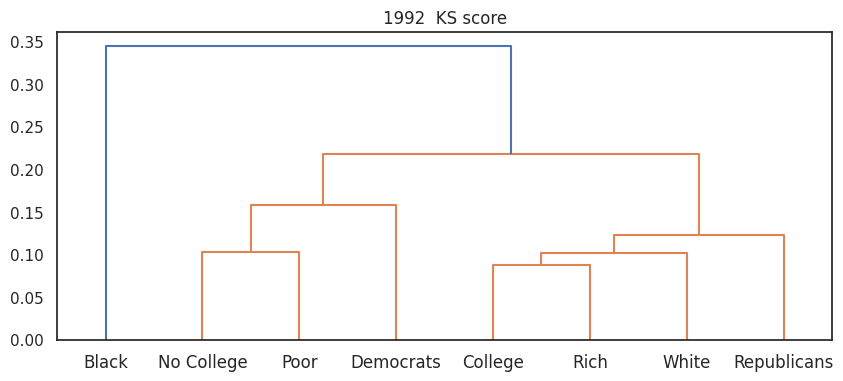

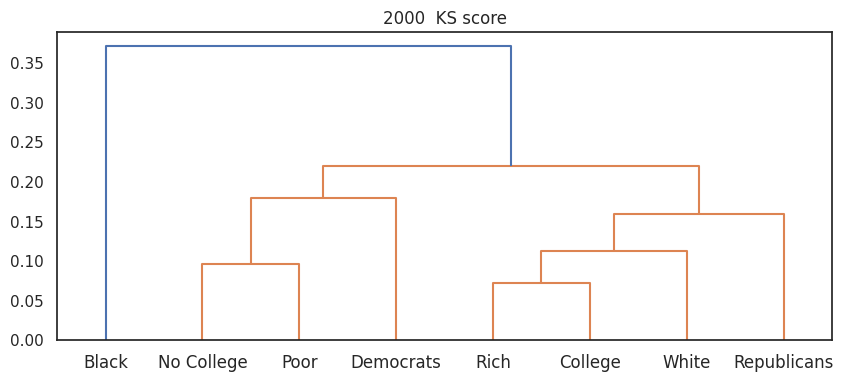

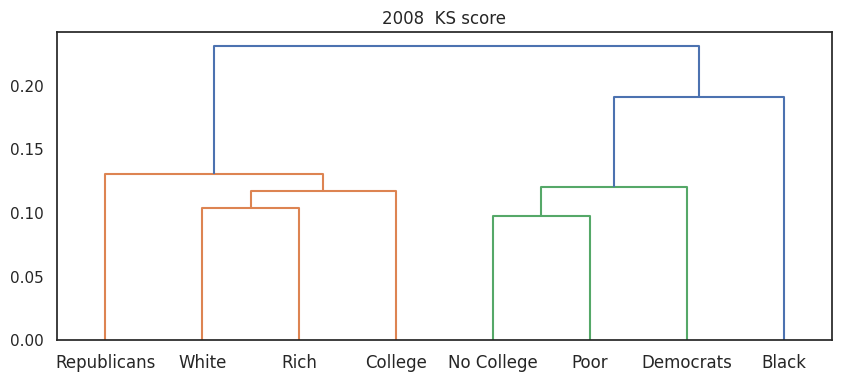

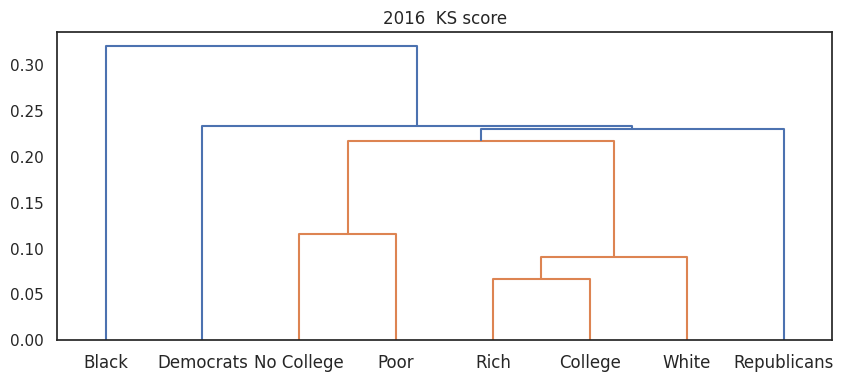

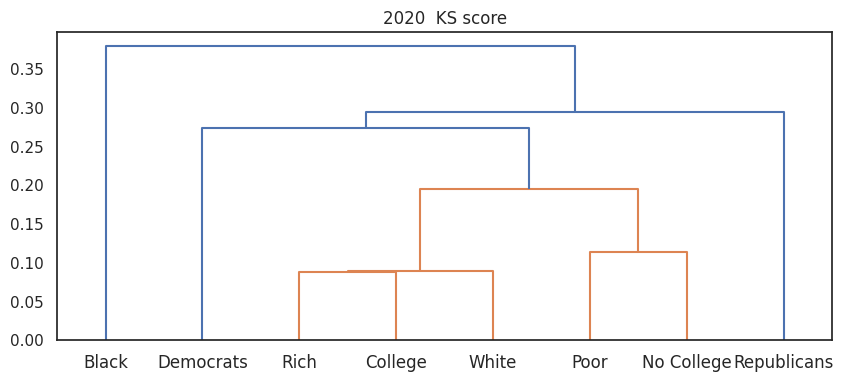

In [67]:
plotDendogramKS(['party', 'race', 'affluence', 'education'])

In [68]:
def getHeatMapKS(comun, objs):
    """ Plot heat map of a sample of communities according to KS score for the whole year subset

    Parameters:
    comun -- list of communities ordered by the dendogram
    objs -- list of the attributes under study
    """
    for k in range(len(yearsSubset)):
        comunDic = dict()
        for categ in objs:
            for sub in subcats[categ]:
                comunDic[sub] = attributesData[categ][k][sub]

        comSize = len(comun)
        KSscore = np.zeros((comSize,comSize))
        KSdic = dict()
        for i in range(comSize):
            for j in range(comSize):
                comm1 = np.array(comunDic[comun[i]])
                comm2 = np.array(comunDic[comun[j]])
                x1, y1 = comm1[:,0], comm1[:,1]
                x2, y2 = comm2[:,0], comm2[:,1]
                p, D = ks2d2s(x1, y1, x2, y2, extra=True)
                KSscore[i,j] = D
            KSdic[comun[i]] = KSscore[i,:]
        KSdata = pd.DataFrame(data=KSdic, index=comun)

        mask = np.triu(np.ones_like(KSscore, dtype=bool))
        plt.figure(figsize=(8,3))
        cmap = sns.diverging_palette(230, 20, as_cmap=True)
        plot = sns.heatmap(KSdata, mask=mask, cmap=cmap, center=0, square=True, linewidths=.5, 
                           cbar_kws={"shrink": .5}).set(title=str(yearsSubset[k]) + "  KS score")
        plt.show()

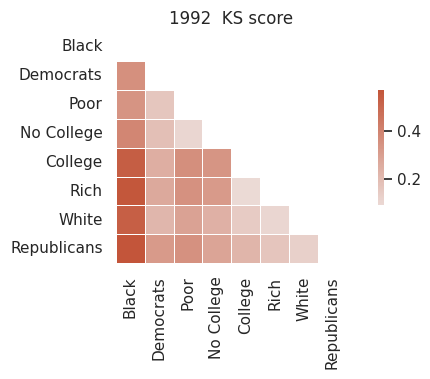

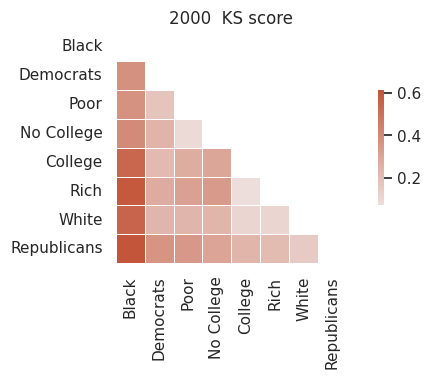

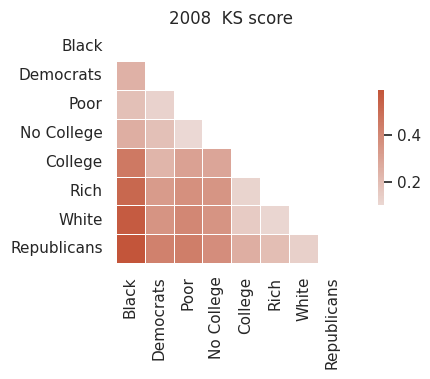

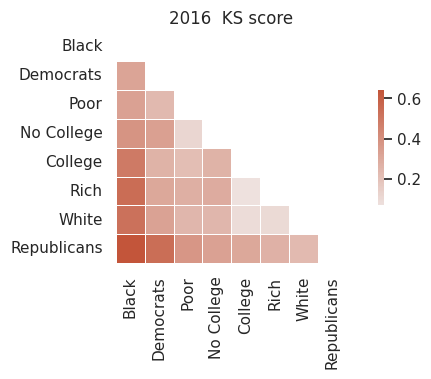

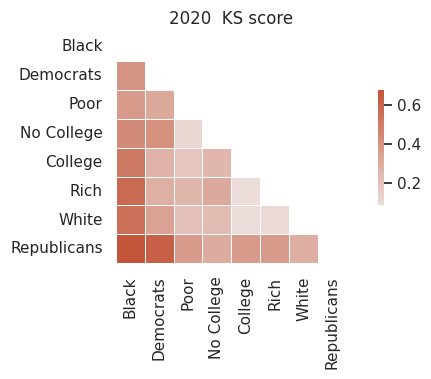

In [69]:
comun = ['Black', 'Democrats', 'Low-Income', 'No-College', 'College', 'High-Income', 'White', 'Republicans']
getHeatMapKS(comun, ['party', 'race', 'affluence', 'education'])

In [70]:
def getMSTKS(comun, objs):
    """ Plot MST of a sample of communities according to KS score for the whole year subset

    Parameters:
    comun -- list of communities ordered by the dendogram
    objs -- list of the attributes under study
    """
    for k in range(len(yearsSubset)):
        comunDic = dict()
        for categ in objs:
            for sub in subcats[categ]:
                comunDic[sub] = attributesData[categ][k][sub]

        comSize = len(comun)
        graphscore = np.zeros((comSize,comSize))
        comunLabels = dict()
        for i in range(comSize):
            comunLabels[i] = comun[i]
            for j in range(i+1, comSize):
                comm1 = np.array(comunDic[comun[i]])
                comm2 = np.array(comunDic[comun[j]])
                x1, y1 = comm1[:,0], comm1[:,1]
                x2, y2 = comm2[:,0], comm2[:,1]
                p, D = ks2d2s(x1, y1, x2, y2, extra=True)
                graphscore[i,j] = D

        MST = minimum_spanning_tree(graphscore)
        G = nx.from_numpy_matrix(MST)
        plt.figure(figsize=(4,4))
        nx.draw_networkx(G, labels=comunLabels, node_color='C1')
        plt.title(str(yearsSubset[k]) + '  KS score')
        plt.show()

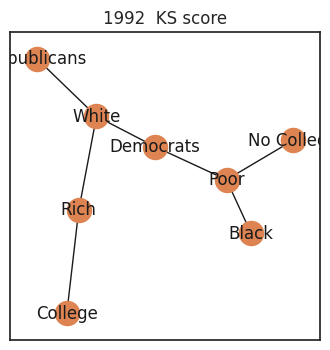

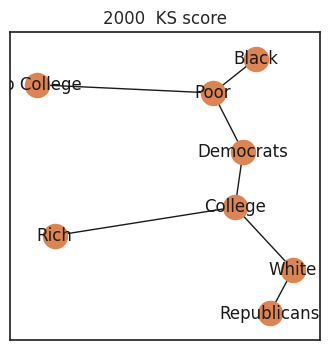

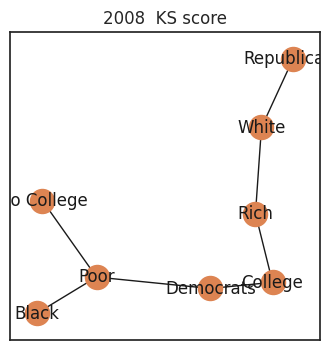

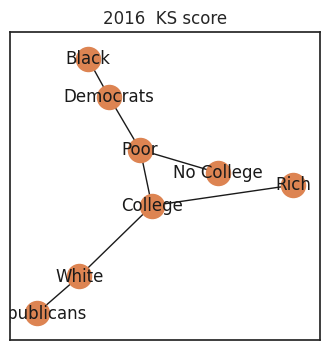

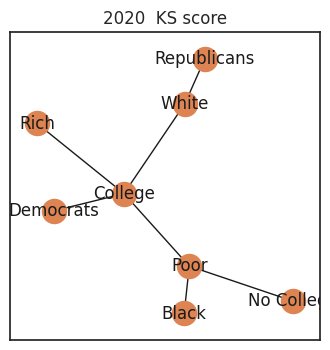

In [71]:
comun = ['Black', 'Democrats', 'Low-Income', 'No-College', 'College', 'High-Income', 'White', 'Republicans']
getMSTKS(comun, ['party', 'race', 'affluence', 'education'])

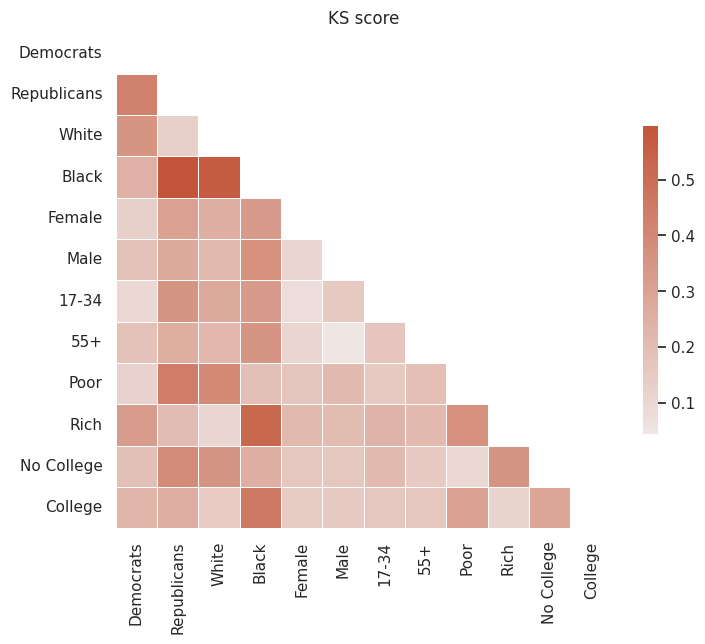

In [72]:
# year 2008
comun = list()
comunDic = dict()
for categ in list(attributesData.keys()):
    subs = subcats[categ]
    comun.append(subs[0])
    comun.append(subs[1])
    comunDic[subs[0]] = attributesData[categ][2][subs[0]]
    comunDic[subs[1]] = attributesData[categ][2][subs[1]]

comSize = len(comun)
KSscore = np.zeros((comSize,comSize))
KSdic = dict()
for i in range(comSize):
    for j in range(comSize):
        comm1 = np.array(comunDic[comun[i]])
        comm2 = np.array(comunDic[comun[j]])
        x1, y1 = comm1[:,0], comm1[:,1]
        x2, y2 = comm2[:,0], comm2[:,1]
        p, D = ks2d2s(x1, y1, x2, y2, extra=True)
        KSscore[i,j] = D
    KSdic[comun[i]] = KSscore[i,:]
KSdata = pd.DataFrame(data=KSdic, index=comun)

mask = np.triu(np.ones_like(KSscore, dtype=bool))
plt.figure(figsize=(8,8))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
plot = sns.heatmap(KSdata, mask=mask, cmap=cmap, center=0, square=True, linewidths=.5, 
                   cbar_kws={"shrink": .5}).set(title=f"KS score")

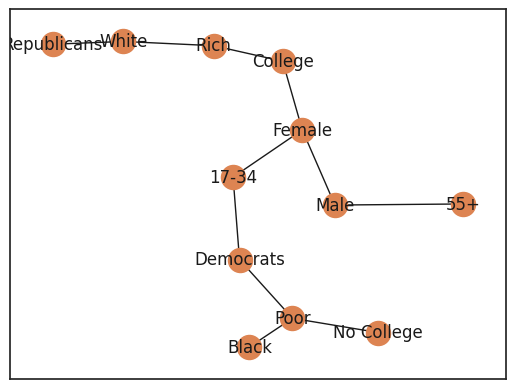

In [73]:
# year 2008
graphscore = np.zeros((comSize,comSize))
comunLabels = dict()
for i in range(comSize):
    comunLabels[i] = comun[i]
    for j in range(i+1, comSize):
        graphscore[i,j] = KSscore[i,j]

MST = minimum_spanning_tree(graphscore)
G = nx.from_numpy_matrix(MST)

plt.figure()
nx.draw_networkx(G, labels=comunLabels, node_color='C1')
plt.show()

In [78]:
objs = list(attributesData.keys())
comunDic = dict()
for categ in objs:
    for sub in subcats[categ]:
        subUsers = np.array([[0,0]])
        for k in range(len(yearsSubset)):
            subUsers = np.concatenate((subUsers, attributesData[categ][k][sub]), axis=0)
        subUsers = np.delete(subUsers, 0, axis=0)
        comunDic[sub] = subUsers

comun = list(subcats.values())
comun = [item for sublist in comun for item in sublist]
comSize = len(comun)
KSscore = np.zeros((comSize,comSize))
KSdic = dict()
for i in range(comSize):
    for j in range(comSize):
        comm1 = comunDic[comun[i]]
        comm2 = comunDic[comun[j]]
        x1, y1 = comm1[:,0], comm1[:,1]
        x2, y2 = comm2[:,0], comm2[:,1]
        p, D = ks2d2s(x1, y1, x2, y2, extra=True)
        KSscore[i,j] = D
    KSdic[comun[i]] = KSscore[i,:]
KSdata = pd.DataFrame(data=KSdic, index=comun)

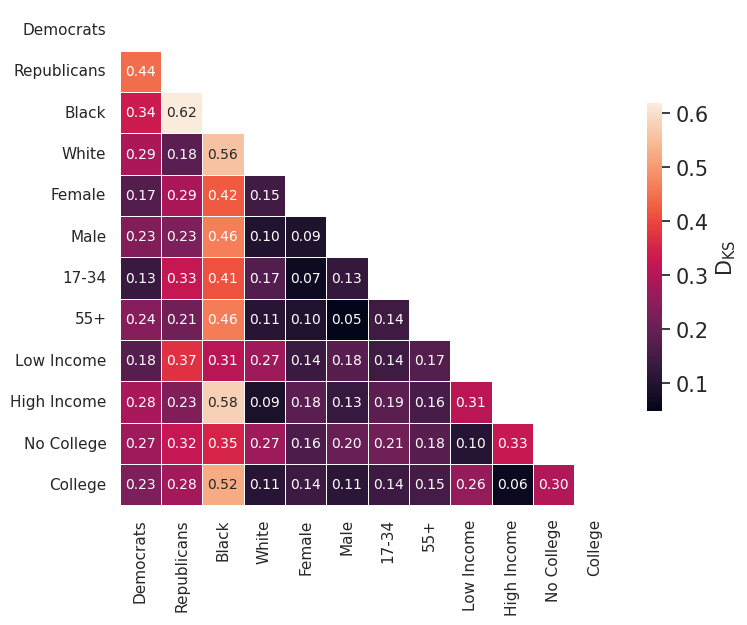

In [79]:
mask = np.triu(np.ones_like(KSscore, dtype=bool))
fig, ax = plt.subplots(figsize=(8,8))
heat = sns.heatmap(KSdata, mask=mask, annot=True, annot_kws={"size":10}, fmt=".2f", square=True, 
            linewidths=.5, cbar_kws={"shrink": .5, "label": r'$\mathregular{D_{KS}}$'})
cbar = heat.collections[0].colorbar
cbar.ax.tick_params(labelsize=15)
heat.figure.axes[-1].yaxis.label.set_size(15)
#plt.savefig('../KSdistance_groups.pdf', bbox_inches="tight")

In [104]:
objs = ['party', 'race', 'affluence', 'education']
comunDic = dict()
for categ in objs:
    for sub in subcats[categ]:
        subUsers = np.array([[0,0]])
        for k in range(len(yearsSubset)):
            subUsers = np.concatenate((subUsers, attributesData[categ][k][sub]), axis=0)
        subUsers = np.delete(subUsers, 0, axis=0)
        comunDic[sub] = subUsers

comun = ['Democrats', 'Republicans', 'Black', 'White', 'Low-Income', 'High-Income', 'No-College', 'College']
comSize = len(comun)
KSscore = np.zeros((comSize,comSize))
KSdic = dict()
for i in range(comSize):
    for j in range(comSize):
        comm1 = comunDic[comun[i]]
        comm2 = comunDic[comun[j]]
        x1, y1 = comm1[:,0], comm1[:,1]
        x2, y2 = comm2[:,0], comm2[:,1]
        p, D = ks2d2s(x1, y1, x2, y2, extra=True)
        KSscore[i,j] = D
    KSdic[comun[i]] = KSscore[i,:]
KSdata = pd.DataFrame(data=KSdic, index=comun)

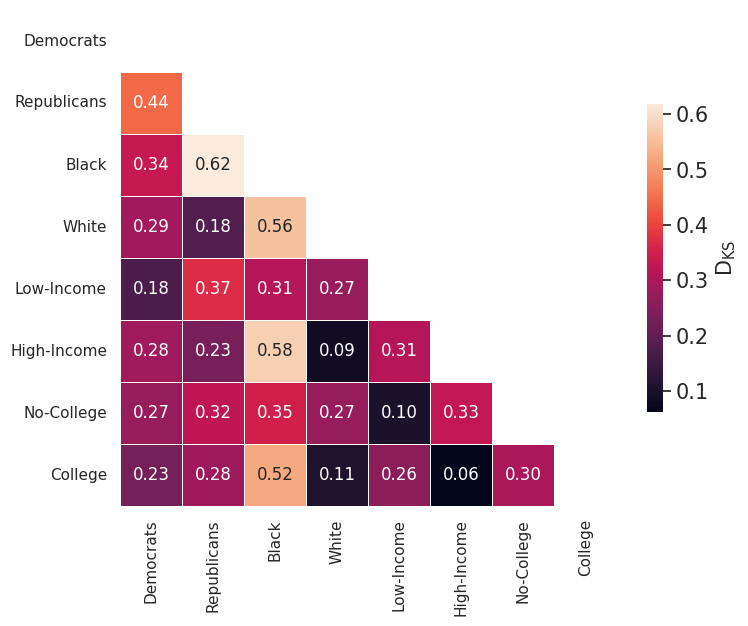

In [106]:
mask = np.triu(np.ones_like(KSscore, dtype=bool))
fig, ax = plt.subplots(figsize=(8,8))
heat = sns.heatmap(KSdata, mask=mask, annot=True, annot_kws={"size":12}, fmt=".2f", square=True, 
            linewidths=.5, cbar_kws={"shrink": .5, "label": r'$\mathregular{D_{KS}}$'})
cbar = heat.collections[0].colorbar
cbar.ax.tick_params(labelsize=15)
heat.figure.axes[-1].yaxis.label.set_size(15)
#plt.savefig('../KSdistance_groups.pdf', bbox_inches="tight")

# Own work

In [105]:
def plotContoursSubset(objs):
    """ Plot contour lines of a sample of communities for the year 2008

    Parameters:
    objs -- list(dictionary for an attribute) each dictionary of the form {community: list(users)}
    """
    nbins = 1000
    cnt = 0
    plt.figure(figsize=(8,8))
    for categ in objs:
        for sub in np.array(list(categ[2].keys()))[:2]:
            users = np.array(categ[2][sub])
            x = users[:,0]
            y = users[:,1]
            k = gaussian_kde([x,y])
            xi, yi = np.mgrid[x.min():x.max():nbins*1j, y.min():y.max():nbins*1j]
            zi = k(np.vstack([xi.flatten(), yi.flatten()]))
            CS = plt.contour(xi, yi, zi.reshape(xi.shape), levels=[0.95*np.max(zi)], colors='C' + str(cnt))
            cnt += 1
            
            center = meanPoints(users)
            plt.scatter(center[0],center[1], label=sub)
    plt.xlim([-2.5, 0.5])
    plt.ylim([-3.5, 1])
    plt.show()

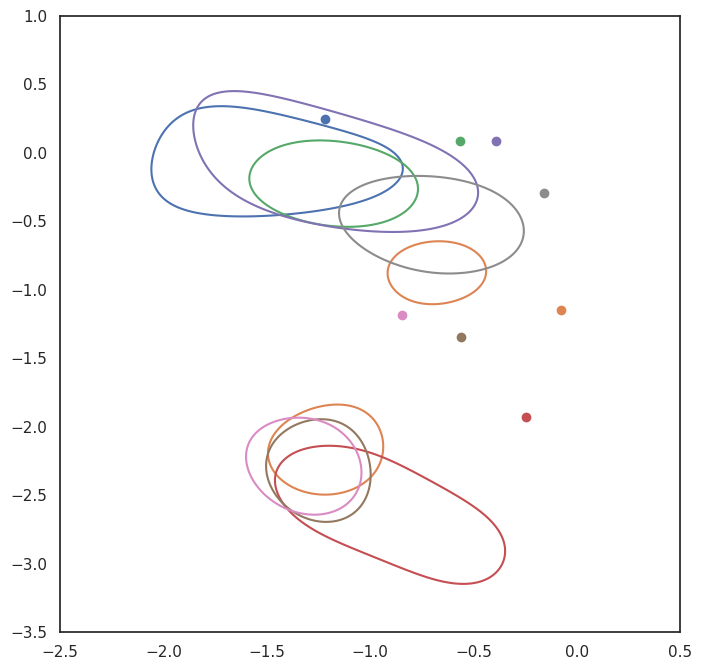

In [106]:
plotContoursSubset([dens_perParty, dens_perRace, dens_perIncome, dens_perEducation])

In [131]:
def power_precision(A, cut):

    pre = 1e6
    b_k = np.random.rand(A.shape[1])
    eig = np.zeros(2)

    while pre >= cut:
        # calculate the matrix-by-vector product Ab
        b_k1 = np.dot(A, b_k)

        # calculate the norm
        b_k1_norm = np.linalg.norm(b_k1)

        # re normalize the vector
        b_k = b_k1 / b_k1_norm
        
        # eigenvalue via Rayleigh quotient
        eig[1] = np.dot(b_k.T, np.dot(A, b_k))/np.linalg.norm(b_k)
        pre = np.absolute(eig[1] - eig[0])
        eig[0] = eig[1]

    return eig[1], b_k

In [132]:
def plotDispersionSubset(objs):
    """ Plot dispersion ellipse of a sample of communities for the whole year subset

    Parameters:
    objs -- list of the attributes under study
    """
    cnt = 0
    plt.figure(figsize=(8,8))
    for categ in objs:
        for sub in subcats[categ]:
            users = np.array([[0,0]])
            for k in range(len(yearsSubset)):
                users = np.concatenate((users, attributesData[categ][k][sub]), axis=0)
                users = np.delete(users, 0, axis=0)
            x = users[:,0]
            y = users[:,1]
            cov = np.mean(x*y) - np.mean(x)*np.mean(y)
            Rg = np.array([[np.var(x), cov], [cov, np.var(y)]])
            eig_g, b_k = power_precision(Rg, 1e-10)
            eig_p = eig_g - np.sqrt((np.var(x) - np.var(y))**2 + (2.*cov)**2)
            
            center = meanPoints(users)
            plt.scatter(center[0],center[1], label=sub)
            
            semi_g = np.sqrt(eig_g)
            semi_p = np.sqrt(eig_p)
            plt.arrow(center[0],center[1], semi_g*b_k[0],semi_g*b_k[1], color='C' + str(cnt), 
                      head_width=0.05, head_length=0.05)
            plt.arrow(center[0],center[1], -semi_p*b_k[1],semi_p*b_k[0], color='C' + str(cnt), 
                      head_width=0.05, head_length=0.05)
            cnt += 1
            print(f'{sub:>11}    {semi_p/semi_g:>.4f}')
    plt.axis('equal')
    plt.show()

  Democrats    0.6254
Republicans    0.9094
      Black    0.7931
      White    0.6409
 Low Income    0.8432
High Income    0.6078
 No College    0.9734
    College    0.6616


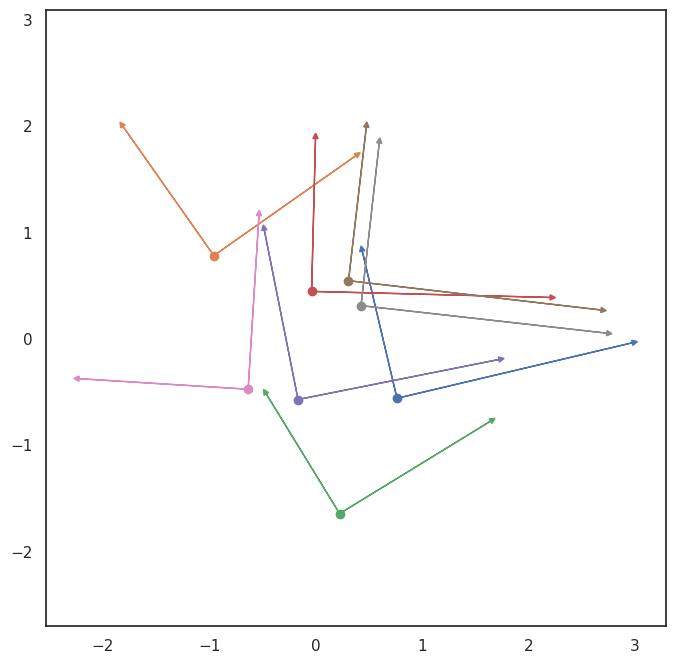

In [133]:
plotDispersionSubset(['party', 'race', 'affluence', 'education'])

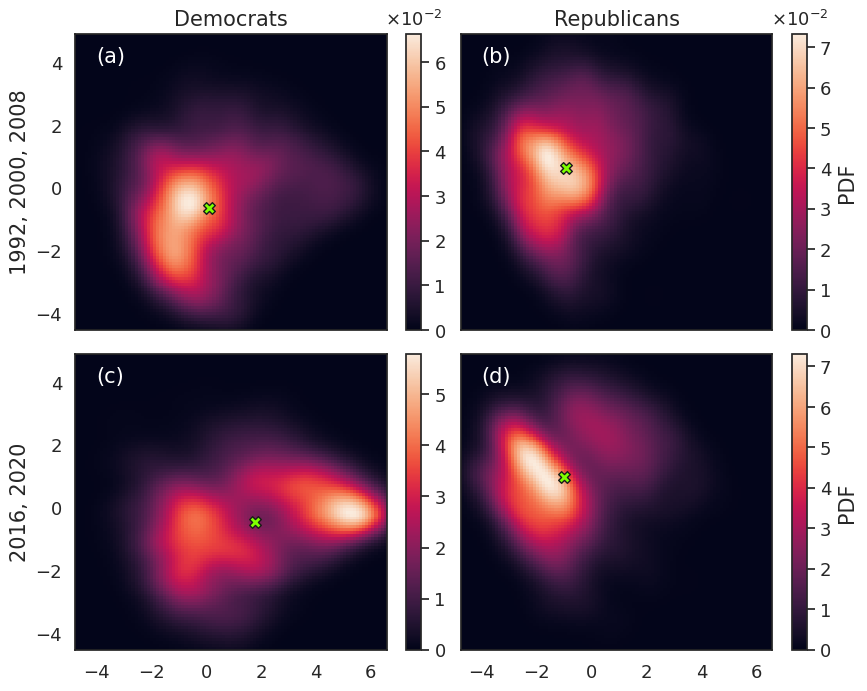

In [55]:
categ = 'party'
minYear = list()
maxYear = list()
kernels = dict()
centers = dict()
fig, ax = plt.subplots(2,2, sharex = True, sharey = True, figsize=(10,8))
fig.subplots_adjust(hspace=0.08)
fig.subplots_adjust(wspace=-0.01)

# Plot limits
for sub in subcats[categ]:

    # years 1992, 2000, 2008
    subUsers = np.array([[0,0]])
    for k in range(len(yearsSubset) - 2):
        subUsers = np.concatenate((subUsers, attributesData[categ][k][sub]), axis=0)
    subUsers = np.delete(subUsers, 0, axis=0)
    x1 = subUsers[:,0]
    minYear.append(x1.min())
    maxYear.append(x1.max())
    y1 = subUsers[:,1]
    minYear.append(y1.min())
    maxYear.append(y1.max())
    kernels[sub + '1'] = gaussian_kde([x1,y1])
    centers[sub + '1'] = meanPoints(subUsers)

    # years 2016, 2020
    subUsers = np.array([[0,0]])
    for k in range(3,5):
        subUsers = np.concatenate((subUsers, attributesData[categ][k][sub]), axis=0)
    subUsers = np.delete(subUsers, 0, axis=0)
    x2 = subUsers[:,0]
    minYear.append(x2.min())
    maxYear.append(x2.max())
    y2 = subUsers[:,1]
    minYear.append(y2.min())
    maxYear.append(y2.max())
    kernels[sub + '2'] = gaussian_kde([x2,y2])
    centers[sub + '2'] = meanPoints(subUsers)

xmin, xmax = np.amin(minYear[::2]), np.amax(maxYear[::2])
ymin, ymax = np.amin(minYear[1::2]), np.amax(maxYear[1::2])
    

# Representation
nbins = 100
ticks = [[0.0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06], [0.0, 0.01, 0.02, 0.03, 0.04, 0.05],
         [0.0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07], [0.0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07]]
labels = [['0', '1', '2', '3', '4', '5', '6'], ['0', '1', '2', '3', '4', '5'],
         ['0', '1', '2', '3', '4', '5', '6', '7'], ['0', '1', '2', '3', '4', '5', '6', '7']]
annot = ['(a)', '(c)', '(b)', '(d)']
for n,sub in enumerate(subcats[categ]):
    xi, yi = np.mgrid[xmin:xmax:nbins*1j, ymin:ymax:nbins*1j]
    zi = kernels[sub + '1'](np.vstack([xi.flatten(), yi.flatten()]))

    im = ax[0,n].pcolormesh(xi, yi, zi.reshape(xi.shape), shading='auto')
    ax[0,n].scatter(centers[sub + '1'][0], centers[sub + '1'][1], marker='X', 
                    c='chartreuse', ec='k', s=70)
    ax[0,n].tick_params(axis='y', labelsize=13)
    cbar = fig.colorbar(im, ax=ax[0,n], ticks=ticks[2*n])
    cbar.ax.set_yticklabels(labels[2*n])
    cbar.ax.tick_params(labelsize=13)
    if n == 1:
        cbar.ax.set_ylabel('PDF', fontsize=15)
    else:
        ax[0,n].set_ylabel('1992, 2000, 2008', fontsize=15)
#    cbar.ax.tick_params(labelsize=15)
    cbar.ax.set_title(r'$\mathregular{\times 10^{-2}}$', fontsize=13)
#    ax[0,n].set_aspect(1.0)
#    ax[0,n].axis('off')
    ax[0,n].set_title(sub.capitalize(), fontsize=15)
    ax[0,n].annotate(annot[2*n], xy=(-4,4), color='w', fontsize=15)


    xi, yi = np.mgrid[xmin:xmax:nbins*1j, ymin:ymax:nbins*1j]
    zi = kernels[sub + '2'](np.vstack([xi.flatten(), yi.flatten()]))

    im = ax[1,n].pcolormesh(xi, yi, zi.reshape(xi.shape), shading='auto')
    ax[1,n].scatter(centers[sub + '2'][0], centers[sub + '2'][1], marker='X', 
                    c='chartreuse', ec='k', s=70)
    ax[1,n].tick_params(axis='y', labelsize=13)
    ax[1,n].tick_params(axis='x', labelsize=13)
    cbar = fig.colorbar(im, ax=ax[1,n], ticks=ticks[2*n+1])
    cbar.ax.set_yticklabels(labels[2*n+1])
    cbar.ax.tick_params(labelsize=13)
    if n == 1:
        cbar.ax.set_ylabel('PDF', fontsize=15)
    else:
        ax[1,n].set_ylabel('2016, 2020', fontsize=15)
#    ax[1,n].set_aspect(1.0)
#    ax[1,n].axis('off')
    ax[1,n].annotate(annot[2*n+1], xy=(-4,4), color='w', fontsize=15)
    
plt.show()
#plt.savefig('../displacement_party.pdf', bbox_inches="tight")

[2.42745389 2.37670063 2.31196107 2.77795348 3.0138774 ]


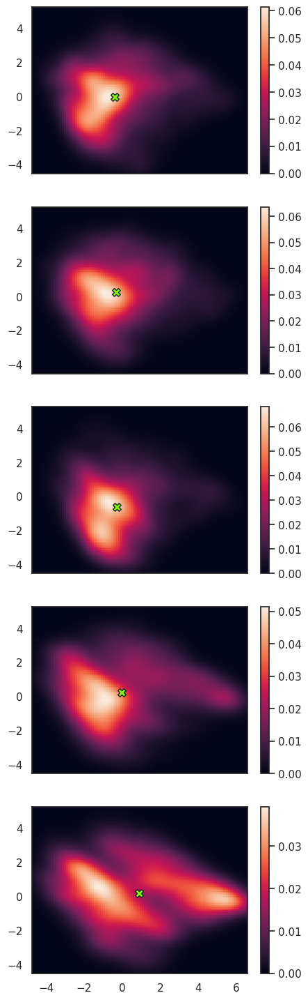

In [89]:
categ = 'party'
groups = np.array(list(attributesData[categ][0].keys()))
minYear = list()
maxYear = list()
kernels = list()
centers = list()
Rg = np.array([])
fig, ax = plt.subplots(5,1, sharex = True, figsize=(5,18))
# fig.subplots_adjust(hspace=0.08)
# fig.subplots_adjust(wspace=-0.01)

# Plot limits
for k in range(len(yearsSubset)):

    subUsers = np.array([[0,0]])
    for sub in groups:
        subUsers = np.concatenate((subUsers, attributesData[categ][k][sub]), axis=0)
    subUsers = np.delete(subUsers, 0, axis=0)
    x1 = subUsers[:,0]
    minYear.append(x1.min())
    maxYear.append(x1.max())
    y1 = subUsers[:,1]
    minYear.append(y1.min())
    maxYear.append(y1.max())
    kernels.append(gaussian_kde([x1,y1]))
    centers.append(meanPoints(subUsers))
    Rg = np.append(Rg, np.sqrt(np.var(x1) + np.var(y1)))

xmin, xmax = np.amin(minYear[::2]), np.amax(maxYear[::2])
ymin, ymax = np.amin(minYear[1::2]), np.amax(maxYear[1::2])
print(Rg)
    

# Representation
nbins = 100
# ticks = [[0.0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06], [0.0, 0.01, 0.02, 0.03, 0.04, 0.05],
#          [0.0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07], [0.0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07]]
# labels = [['0', '1', '2', '3', '4', '5', '6'], ['0', '1', '2', '3', '4', '5'],
#          ['0', '1', '2', '3', '4', '5', '6', '7'], ['0', '1', '2', '3', '4', '5', '6', '7']]
# annot = ['(a)', '(c)', '(b)', '(d)']
for k in range(len(yearsSubset)):
    xi, yi = np.mgrid[xmin:xmax:nbins*1j, ymin:ymax:nbins*1j]
    zi = kernels[k](np.vstack([xi.flatten(), yi.flatten()]))

    im = ax[k].pcolormesh(xi, yi, zi.reshape(xi.shape), shading='auto')
    ax[k].scatter(centers[k][0], centers[k][1], marker='X', c='chartreuse', ec='k', s=70)
#     ax[0,n].tick_params(axis='y', labelsize=13)
#     cbar = fig.colorbar(im, ax=ax[0,n], ticks=ticks[2*n])
    cbar = fig.colorbar(im, ax=ax[k])
#     cbar.ax.set_yticklabels(labels[2*n])
#     cbar.ax.tick_params(labelsize=13)
#     if n == 1:
#         cbar.ax.set_ylabel('PDF', fontsize=15)
#     else:
#         ax[0,n].set_ylabel('1992, 2000, 2008', fontsize=15)
# #    cbar.ax.tick_params(labelsize=15)
#     cbar.ax.set_title(r'$\mathregular{\times 10^{-2}}$', fontsize=13)
# #    ax[0,n].set_aspect(1.0)
# #    ax[0,n].axis('off')
#     ax[0,n].set_title(sub.capitalize(), fontsize=15)
#     ax[0,n].annotate(annot[2*n], xy=(-4,4), color='w', fontsize=15)
    
plt.show()

In [98]:
# Closest respondents to left and right blobs of 2020
xsort = xi.flatten()[np.argsort(zi)[::-1]][0:100]
ysort = yi.flatten()[np.argsort(zi)[::-1]][0:100]
xmaxRep, ymaxRep = xsort[xsort < 0][0], ysort[xsort < 0][0]
xmaxDem, ymaxDem = xsort[xsort > 0][0], ysort[xsort > 0][0]

distRep = []
distDem = []
for i in range(2500):
    distRep.append(math.dist([xmaxRep, ymaxRep], [subUsers[i,0], subUsers[i,1]]))
    distDem.append(math.dist([xmaxDem, ymaxDem], [subUsers[i,0], subUsers[i,1]]))

indRep = []
indDem = []
total = 250
argRep = np.argsort(distRep)
argDem = np.argsort(distDem)
for i in range(total):
    indRep.append([subUsers[argRep[i],0], subUsers[argRep[i],1]])
    indDem.append([subUsers[argDem[i],0], subUsers[argDem[i],1]])

print(len(indRep), len(indDem))

250 250


In [99]:
# Answers to questions
questions = dfsCombined.iloc[:, :29].values
quesRep = []
quesDem = []
for i in range(total):
    quesRep.append(questions[np.where(points2d == indRep[i])[0][0]])
    quesDem.append(questions[np.where(points2d == indDem[i])[0][0]])

quesRep = np.array(quesRep).T
quesDem = np.array(quesDem).T

In [100]:
quesRep.shape

(29, 250)

Text(0.5, 1.0, 'Left vs right 2020 blobs')

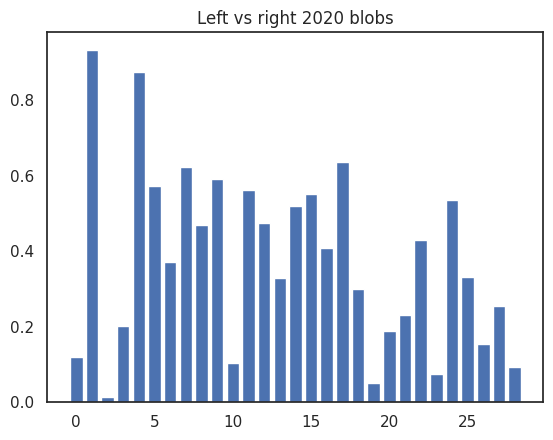

In [142]:
diff = np.array([np.sum(quesRep, axis=1), np.sum(quesDem, axis=1)])/total
#diff = np.abs(np.sum(quesRep, axis=1) - np.sum(quesDem, axis=1))/total
plt.bar(range(29), np.abs(diff[0] - diff[1]))
plt.title('Left vs right 2020 blobs')

In [146]:
great = np.argsort(np.abs(diff[0] - diff[1]))[::-1][:7]
for i in great:
    print(round(diff[0][i], 3), round(diff[1][i], 3), dict_q[i])

0.938 0.004 Child attribute: curiosity vs good manners
0.97 0.096 Child attribute: independence vs respect for elders
0.705 0.069 Blacks should not be favored
0.807 0.183 Death penalty
0.135 0.725 Preference on blacks when hiring
0.32 0.892 Federal spending: welfare programs
0.389 0.95 Blacks have it difficult to succeed


In [109]:
dict_q = {}
list_q = list(dfsCombined.columns[:-7])
for i in range(29):
    dict_q[i] = list_q[i]

In [110]:
dict_q

{0: 'Child attribute: considerate vs well-behaved',
 1: 'Child attribute: curiosity vs good manners',
 2: 'Presidency and congress splitted',
 3: 'Protection to homosexuals',
 4: 'Child attribute: independence vs respect for elders',
 5: 'Federal spending: welfare programs',
 6: 'Should adjust view of moral behavior to changes',
 7: 'Death penalty',
 8: 'Should worry less about how equal people are',
 9: 'Preference on blacks when hiring',
 10: 'Elections make government pay attention',
 11: 'Blacks have it difficult to succeed',
 12: 'Authority of the bible',
 13: 'Life unfair by default',
 14: 'Blacks gotten less than deserved',
 15: 'Blacks must try harder',
 16: 'Federal spending: poor people',
 17: 'Blacks should not be favored',
 18: 'Federal spending: environment',
 19: 'Federal spending: social security',
 20: 'Federal spending: public schools',
 21: 'All should be treated equally',
 22: 'Federal spending: dealing with crime',
 23: 'Federal wasted money',
 24: 'Should be more e

In [147]:
# Respondents
sub2008 = np.array([[0,0]])
for sub in groups:
    sub2008 = np.concatenate((sub2008, attributesData[categ][2][sub]), axis=0)
sub2008 = np.delete(sub2008, 0, axis=0)

sub2020 = np.array([[0,0]])
for sub in groups:
    sub2020 = np.concatenate((sub2020, attributesData[categ][4][sub]), axis=0)
sub2020 = np.delete(sub2020, 0, axis=0)

# Questions
ques2008 = []
ques2020 = []
for i in range(2322):
    ques2008.append(questions[np.where(points2d == sub2008[i,:])[0][0]])
    ques2020.append(questions[np.where(points2d == sub2020[i,:])[0][0]])

ques2008 = np.array(ques2008).T
ques2020 = np.array(ques2020).T

In [148]:
ques2008.shape

(29, 2322)

Text(0.5, 1.0, 'All 2008 vs 2020')

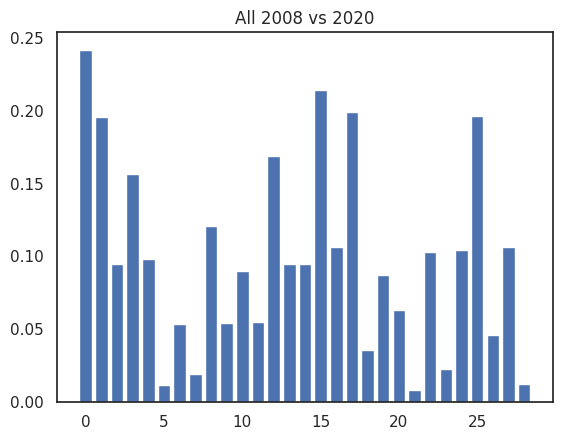

In [149]:
diff = np.array([np.sum(ques2008, axis=1), np.sum(ques2020, axis=1)])/2322
plt.bar(range(29), np.abs(diff[0] - diff[1]))
plt.title('All 2008 vs 2020')

In [150]:
great = np.argsort(np.abs(diff[0] - diff[1]))[::-1][:7]
for i in great:
    print(round(diff[0][i], 3), round(diff[1][i], 3), dict_q[i])

0.481 0.239 Child attribute: considerate vs well-behaved
0.614 0.399 Blacks must try harder
0.699 0.499 Blacks should not be favored
0.12 0.316 Better economy than past year
0.755 0.559 Child attribute: curiosity vs good manners
0.65 0.481 Authority of the bible
0.687 0.843 Protection to homosexuals


In [151]:
# Respondents
subBefore = np.array([[0,0]])
for sub in groups:
    subBefore = np.concatenate((subBefore, attributesData[categ][0][sub]), axis=0)
    subBefore = np.concatenate((subBefore, attributesData[categ][1][sub]), axis=0)
    subBefore = np.concatenate((subBefore, attributesData[categ][2][sub]), axis=0)
subBefore = np.delete(subBefore, 0, axis=0)

random.seed(9708 + 1)
subBefore = np.delete(subBefore, random.sample(range(len(subBefore)), len(subBefore) - 5000), axis=0)

subAfter = np.array([[0,0]])
for sub in groups:
    subAfter = np.concatenate((subAfter, attributesData[categ][3][sub]), axis=0)
    subAfter = np.concatenate((subAfter, attributesData[categ][4][sub]), axis=0)
subAfter = np.delete(subAfter, 0, axis=0)

# Questions
quesBefore = []
quesAfter = []
for i in range(5000):
    quesBefore.append(questions[np.where(points2d == subBefore[i,:])[0][0]])
    quesAfter.append(questions[np.where(points2d == subAfter[i,:])[0][0]])

quesBefore = np.array(quesBefore).T
quesAfter = np.array(quesAfter).T

In [152]:
quesBefore.shape

(29, 5000)

Text(0.5, 1.0, 'All [1992, 2000, 2008] vs [2016, 2020]')

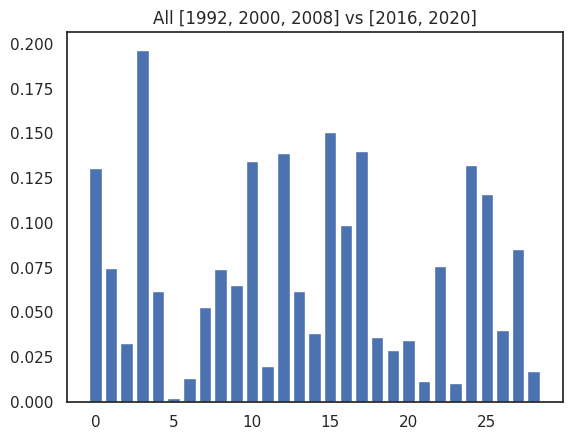

In [154]:
diff = np.array([np.sum(quesBefore, axis=1), np.sum(quesAfter, axis=1)])/5000
plt.bar(range(29), np.abs(diff[0] - diff[1]))
plt.title('All [1992, 2000, 2008] vs [2016, 2020]')

In [155]:
great = np.argsort(np.abs(diff[0] - diff[1]))[::-1][:7]
for i in great:
    print(round(diff[0][i], 3), round(diff[1][i], 3), dict_q[i])

0.627 0.823 Protection to homosexuals
0.608 0.457 Blacks must try harder
0.701 0.561 Blacks should not be favored
0.634 0.495 Authority of the bible
0.672 0.537 Elections make government pay attention
0.789 0.656 Should be more emphasis on traditional values
0.432 0.302 Child attribute: considerate vs well-behaved


In [105]:
# Democratic respondents
sub = 'Democrats'
subBefore = attributesData[categ][0][sub]
subBefore = np.concatenate((subBefore, attributesData[categ][1][sub]), axis=0)
subBefore = np.concatenate((subBefore, attributesData[categ][2][sub]), axis=0)

subAfter = attributesData[categ][3][sub]
subAfter = np.concatenate((subAfter, attributesData[categ][4][sub]), axis=0)

# Questions
total = len(subAfter)
random.seed(9708 + 2)
subBefore = np.delete(subBefore, random.sample(range(len(subBefore)), len(subBefore) - total), axis=0)
quesBefore = []
quesAfter = []
for i in range(total):
    quesBefore.append(questions[np.where(points2d == subBefore[i,:])[0][0]])
    quesAfter.append(questions[np.where(points2d == subAfter[i,:])[0][0]])

quesBefore = np.array(quesBefore).T
quesAfter = np.array(quesAfter).T

In [106]:
quesBefore.shape

(29, 2341)

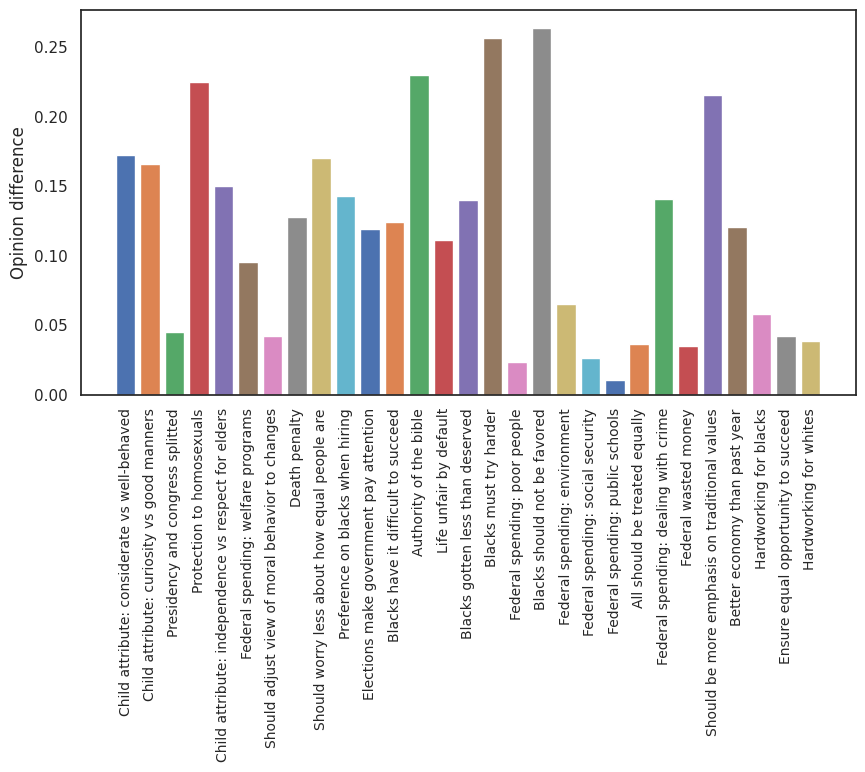

In [143]:
diff = np.array([np.sum(quesBefore, axis=1), np.sum(quesAfter, axis=1)])/2341

fig, ax = plt.subplots(figsize=(10,5))
for i in range(29):
    ax.bar(i, np.abs(diff[0] - diff[1])[i])

ax.set_xticks(np.arange(29))
ax.set_xticklabels(list(dict_q.values()), rotation=90, fontsize=10)
ax.set_ylabel('Opinion difference')
#ax.set_title('Democrats [1992, 2000, 2008] vs [2016, 2020]')
plt.show()

In [111]:
great = np.argsort(np.abs(diff[0] - diff[1]))[::-1][:7]
for i in great:
    print(round(diff[0][i], 3), round(diff[1][i], 3), dict_q[i])

0.656 0.392 Blacks should not be favored
0.558 0.301 Blacks must try harder
0.63 0.4 Authority of the bible
0.681 0.905 Protection to homosexuals
0.749 0.534 Should be more emphasis on traditional values
0.442 0.269 Child attribute: considerate vs well-behaved
0.457 0.287 Should worry less about how equal people are


In [78]:
def plotDendogramSubset(objs):
    """ Plot dendogram of a sample of communities according to Euclidean distance for the whole year subset

    Parameters:
    objs -- list of the attributes under study
    """
    for k in range(len(yearsSubset)):
        comun = list()
        centers = np.array([[0, 0]])
        for categ in objs:
            for sub in subcats[categ]:
                comun.append(sub)
                centroid = meanPoints(np.array(attributesData[categ][k][sub]))
                centers = np.concatenate((centers, [np.array(centroid)]), axis=0)
        centers = np.delete(centers, 0, axis=0)

        Z = linkage(centers, 'single', optimal_ordering=True)
        plt.figure(figsize=(10,4))
        dn = dendrogram(Z, labels=comun)
        plt.title(str(yearsSubset[k]) + '  distance between centroids')
        plt.show()

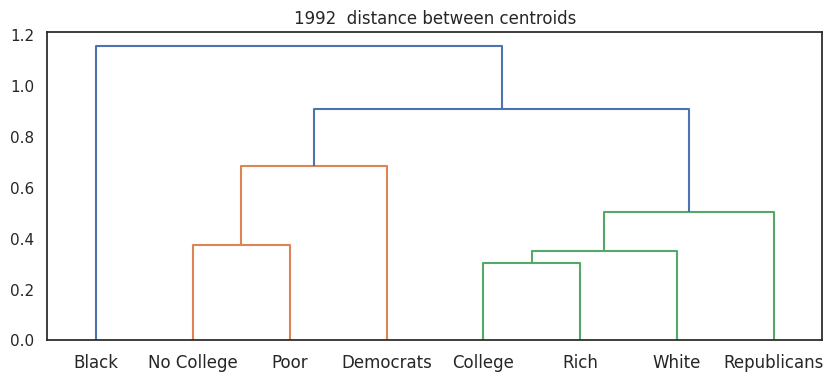

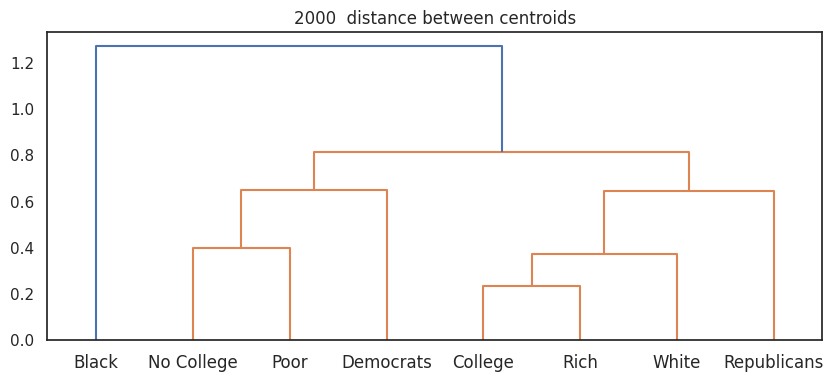

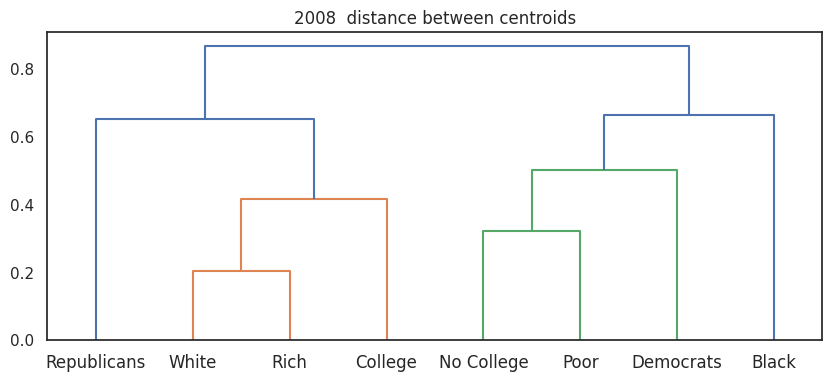

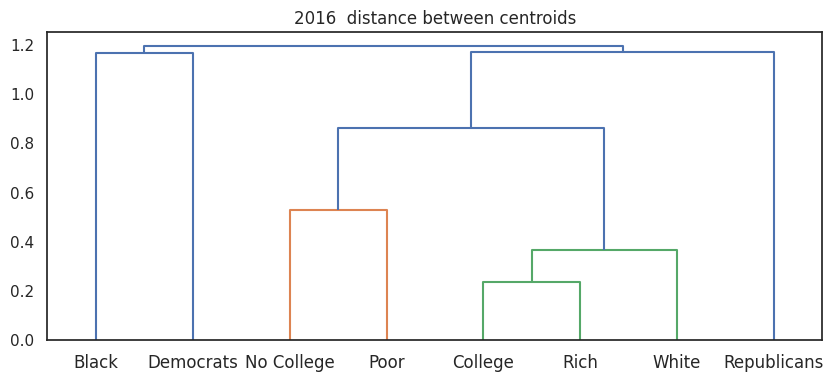

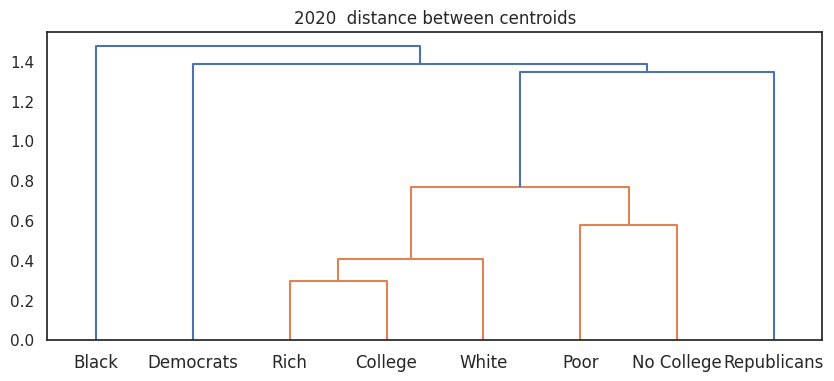

In [79]:
plotDendogramSubset(['party', 'race', 'affluence', 'education'])

In [80]:
def getHeatMapSubset(comun, objs):
    """ Plot heat map of a sample of communities according to Euclidean distance for the whole year subset

    Parameters:
    comun -- list of communities ordered by the dendogram
    objs -- list of the attributes under study
    """
    for k in range(len(yearsSubset)):
        centroids = dict()
        for categ in objs:
            for sub in subcats[categ]:
                center = meanPoints(np.array(attributesData[categ][k][sub]))
                centroids[sub] = center[0], center[1]

        comSize = len(comun)
        centdist = np.zeros((comSize,comSize))
        centDic = dict()
        for i in range(comSize):
            for j in range(comSize):
                centdist[i,j] = math.dist(centroids[comun[i]], centroids[comun[j]])
            centDic[comun[i]] = centdist[i,:]
        centData = pd.DataFrame(data=centDic, index=comun)

        mask = np.triu(np.ones_like(centdist, dtype=bool))
        plt.figure(figsize=(8,3))
        cmap = sns.diverging_palette(230, 20, as_cmap=True)
        plot = sns.heatmap(centData, mask=mask, cmap=cmap, center=0, square=True, linewidths=.5, 
                           cbar_kws={"shrink": .5}).set(title=str(yearsSubset[k]) + "  distance between centroids")

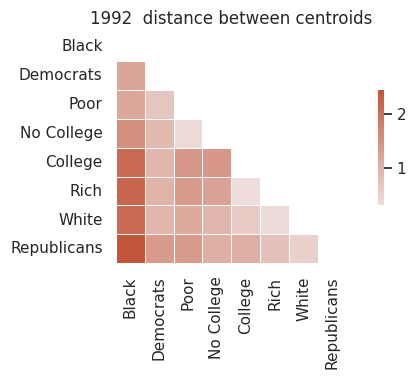

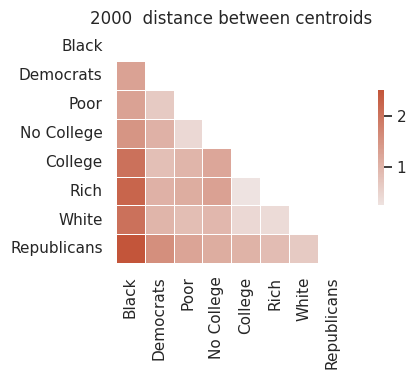

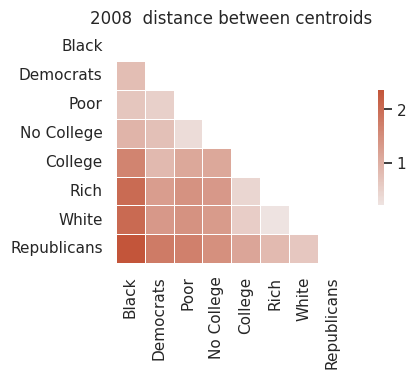

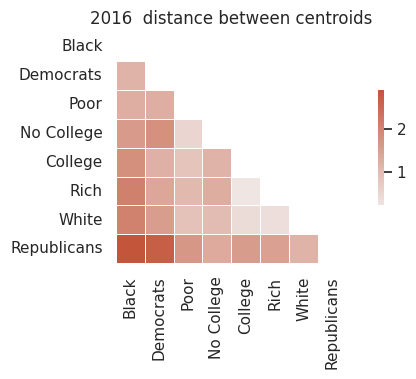

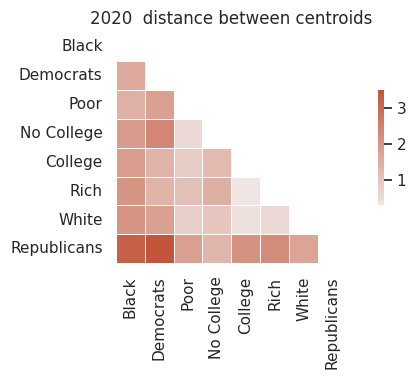

In [81]:
comun = ['Black', 'Democrats', 'Low-Income', 'No-College', 'College', 'High-Income', 'White', 'Republicans']
getHeatMapSubset(comun, ['party', 'race', 'affluence', 'education'])

In [82]:
def getMSTSubset(comun, objs):
    """ Plot MST of a sample of communities according to Euclidean distance for the whole year subset

    Parameters:
    comun -- list of communities ordered by the dendogram
    objs -- list of the attributes under study
    """
    for k in range(len(yearsSubset)):
        centroids = dict()
        for categ in objs:
            for sub in subcats[categ]:
                center = meanPoints(np.array(attributesData[categ][k][sub]))
                centroids[sub] = center[0], center[1]

        comSize = len(comun)
        graphdist = np.zeros((comSize,comSize))
        comunLabels = dict()
        for i in range(comSize):
            comunLabels[i] = comun[i]
            for j in range(i+1, comSize):
                graphdist[i,j] = math.dist(centroids[comun[i]], centroids[comun[j]])

        MST = minimum_spanning_tree(graphdist)
        G = nx.from_numpy_matrix(MST)
        plt.figure(figsize=(4,4))
        nx.draw_networkx(G, labels=comunLabels, node_color='C1')
        plt.title(str(yearsSubset[k]) + '  distance between centroids')

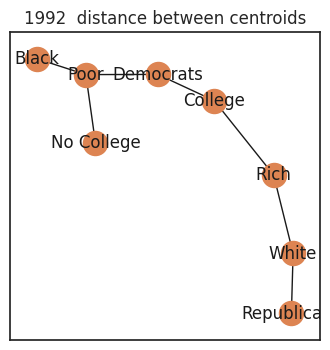

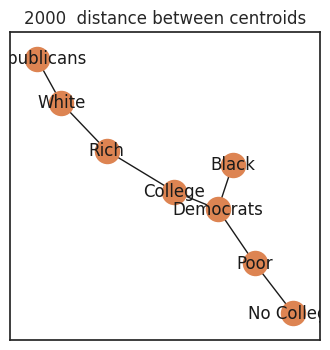

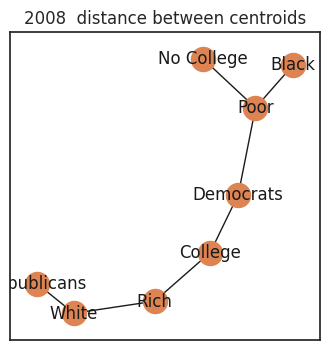

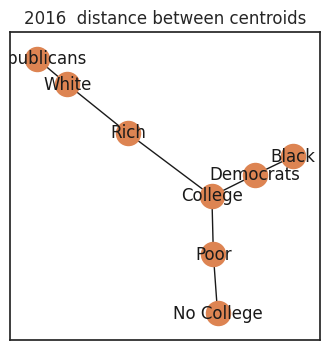

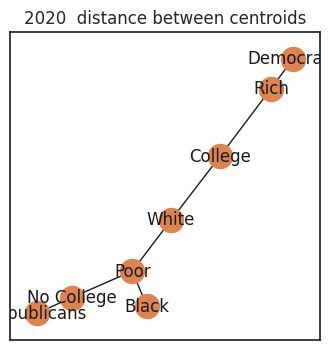

In [83]:
comun = ['Black', 'Democrats', 'Low-Income', 'No-College', 'College', 'High-Income', 'White', 'Republicans']
getMSTSubset(comun, ['party', 'race', 'affluence', 'education'])

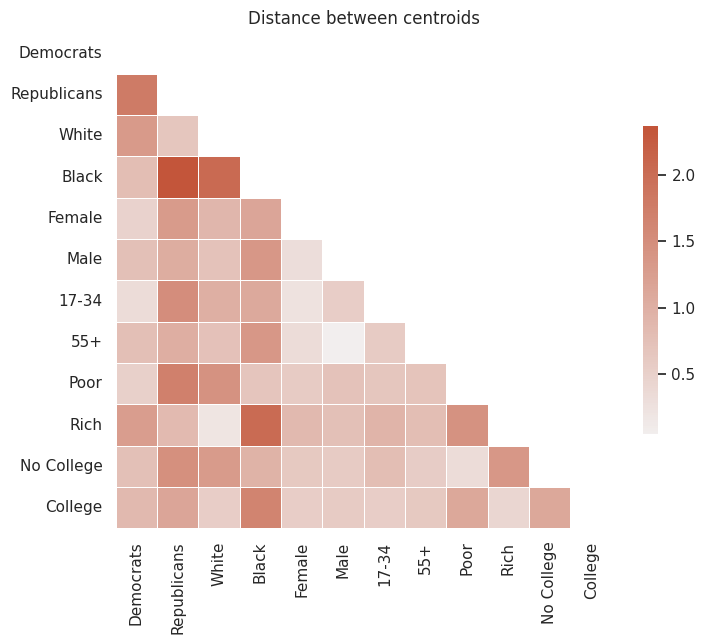

In [84]:
# year 2008
comun = list()
centroids = dict()
for categ in list(attributesData.keys()):
    subs = subcats[categ]
    comun.append(subs[0])
    comun.append(subs[1])
    center0 = meanPoints(np.array(attributesData[categ][2][subs[0]]))
    center1 = meanPoints(np.array(attributesData[categ][2][subs[1]]))
    centroids[subs[0]] = center0[0], center0[1]
    centroids[subs[1]] = center1[0], center1[1]

comSize = len(comun)
centdist = np.zeros((comSize,comSize))
centDic = dict()
for i in range(comSize):
    for j in range(comSize):
        centdist[i,j] = math.dist(centroids[comun[i]], centroids[comun[j]])
    centDic[comun[i]] = centdist[i,:]
centData = pd.DataFrame(data=centDic, index=comun)

mask = np.triu(np.ones_like(centdist, dtype=bool))
plt.figure(figsize=(8,8))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
plot = sns.heatmap(centData, mask=mask, cmap=cmap, center=0, square=True, linewidths=.5, 
                   cbar_kws={"shrink": .5}).set(title=f"Distance between centroids")

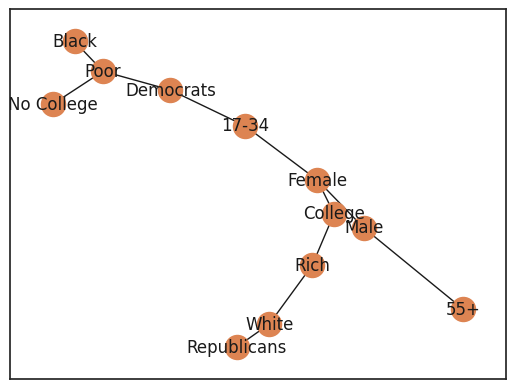

In [85]:
# year 2008
graphdist = np.zeros((comSize,comSize))
comunLabels = dict()
for i in range(comSize):
    comunLabels[i] = comun[i]
    for j in range(i+1, comSize):
        graphdist[i,j] = centdist[i,j]

MST = minimum_spanning_tree(graphdist)
G = nx.from_numpy_matrix(MST)

plt.figure()
nx.draw_networkx(G, labels=comunLabels, node_color='C1')
plt.show()

In [92]:
KSD = np.array([])
Edist = np.array([])
for k in range(len(yearsSubset)):
    comun = list()
    comunDic = dict()
    centroids = dict()
    for categ in list(attributesData.keys()):
        subs = subcats[categ]
        comun.append(subs[0])
        comun.append(subs[1])
        comunDic[subs[0]] = attributesData[categ][k][subs[0]]
        comunDic[subs[1]] = attributesData[categ][k][subs[1]]
        center0 = meanPoints(np.array(attributesData[categ][k][subs[0]]))
        center1 = meanPoints(np.array(attributesData[categ][k][subs[1]]))
        centroids[subs[0]] = center0[0], center0[1]
        centroids[subs[1]] = center1[0], center1[1]

    comSize = len(comun)
    KSscore = np.array([])
    centdist = np.array([])
    for i in range(comSize):
        for j in range(i+1, comSize):
            comm1 = np.array(comunDic[comun[i]])
            comm2 = np.array(comunDic[comun[j]])
            x1, y1 = comm1[:,0], comm1[:,1]
            x2, y2 = comm2[:,0], comm2[:,1]
            p, D = ks2d2s(x1, y1, x2, y2, extra=True)
            KSscore = np.append(KSscore, D)
            centdist = np.append(centdist, math.dist(centroids[comun[i]], centroids[comun[j]]))
    KSD = np.append(KSD, KSscore)
    Edist = np.append(Edist, centdist)

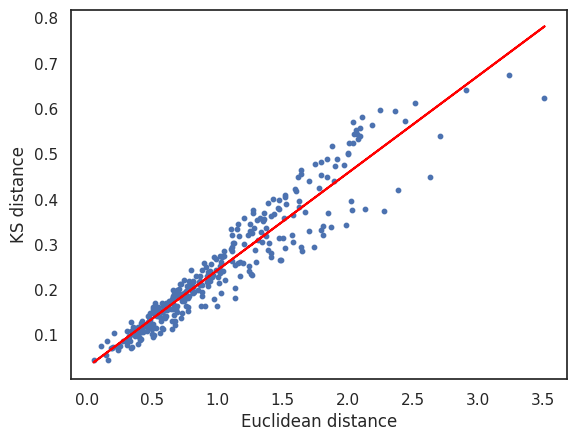

In [94]:
plt.scatter(Edist, KSD, s=10.0)
plt.ylabel('KS distance')
plt.xlabel('Euclidean distance')
dist = linregress(Edist, KSD)
plt.plot(Edist, dist.slope*Edist + dist.intercept, linestyle='-', color='red')
#plt.savefig('../KSdistance_Euclidean.pdf', bbox_inches="tight")

In [107]:
def getHeatMapRg(objs):
    """ Plot heat map of the radius of gyration of a sample of communities for each year of the subset

    Parameters:
    objs -- list of the attributes under study
    """
    t = len(yearsSubset)
    RgDic = dict()
    for categ in objs:
        for sub in subcats[categ]:
            Rg = np.array([])
            for k in range(t):
                subUsers = np.array(attributesData[categ][k][sub])
                x = subUsers[:,0]
                y = subUsers[:,1]
                Rg = np.append(Rg, np.sqrt(np.var(x) + np.var(y)))
            RgDic[sub] = Rg
    RgData = pd.DataFrame(data=RgDic, index=yearsSubset)
    
    fig, ax = plt.subplots(figsize=(10,10))
    heat = sns.heatmap(RgData, annot=True, annot_kws={"size":11}, fmt=".2f", square=True, 
                linewidths=.5, cbar_kws={"shrink": .5, "label": r'$\mathregular{R_g}$'})
    cbar = heat.collections[0].colorbar
    cbar.ax.tick_params(labelsize=15)
    heat.set_xticklabels(heat.get_xticklabels(), rotation=45)
    heat.figure.axes[-1].yaxis.label.set_size(15)
    #.set(title=f"Radius of gyration")

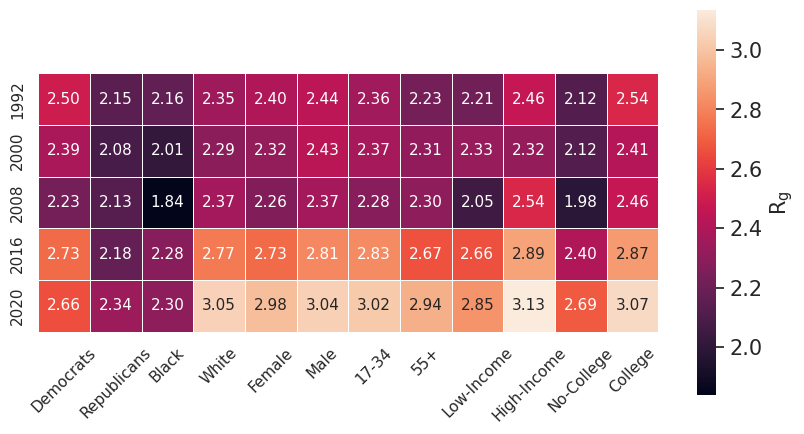

In [109]:
getHeatMapRg(['party', 'race', 'gender', 'age', 'affluence', 'education'])
plt.savefig('../radius_gyration.pdf', bbox_inches="tight")

In [96]:
def plotDendogramAll(objs):
    """ Plot dendogram of a sample of communities according to Euclidean distance

    Parameters:
    objs -- list of the attributes under study
    """
    comun = list()
    centers = np.array([[0,0]])
    for categ in objs:
        for sub in subcats[categ]:
            comun.append(sub)
            subUsers = np.array([[0,0]])
            for k in range(len(yearsSubset)):
                subUsers = np.concatenate((subUsers, attributesData[categ][k][sub]), axis=0)
            subUsers = np.delete(subUsers, 0, axis=0)
            centroid = meanPoints(subUsers)
            centers = np.concatenate((centers, [np.array(centroid)]), axis=0)
    centers = np.delete(centers, 0, axis=0)

    Z = linkage(centers, 'single', optimal_ordering=True)
    print(Z)
    plt.figure(figsize=(10,6))
    dn = dendrogram(Z, labels=comun)
    plt.title('Distance between centroids')
    plt.show()

[[ 7.          5.          0.26144005  2.        ]
 [ 8.          3.          0.36257167  3.        ]
 [ 6.          4.          0.4801284   2.        ]
 [10.          0.          0.92972796  3.        ]
 [11.          9.          0.93585382  6.        ]
 [12.          1.          0.97819951  7.        ]
 [ 2.         13.          1.14169356  8.        ]]


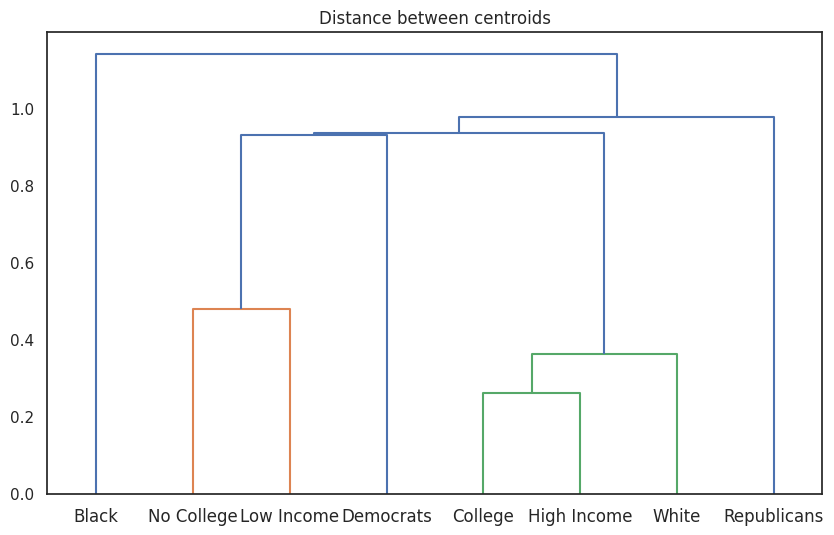

In [97]:
plotDendogramAll(['party', 'race', 'affluence', 'education'])

In [177]:
def getMSTAll(comun, objs):
    """ Plot MST of a sample of communities according to Euclidean distance

    Parameters:
    comun -- list of communities ordered by the dendogram
    objs -- list of the attributes under study
    """
    centroids = dict()
    for categ in objs:
        for sub in subcats[categ]:
            subUsers = np.array([[0,0]])
            for k in range(len(yearsSubset)):
                subUsers = np.concatenate((subUsers, attributesData[categ][k][sub]), axis=0)
            subUsers = np.delete(subUsers, 0, axis=0)
            center = meanPoints(subUsers)
            centroids[sub] = center[0], center[1]

    comSize = len(comun)
    graphdist = np.zeros((comSize,comSize))
    comunLabels = dict()
    itemLabels = dict()
    for i in range(comSize):
        comunLabels[i] = comun[i]
        itemLabels[comun[i]] = i
        for j in range(i+1, comSize):
            graphdist[i,j] = math.dist(centroids[comun[i]], centroids[comun[j]])
    
    # community colors
    up = ['Republicans', 'White', 'High-Income', 'College']
    down = ['Democrats', 'Black', 'Low-Income', 'No-College']
    colors = np.zeros(8, dtype=str)
    for i in range(int(len(comun)/2)):
        colors[itemLabels[up[i]]] = 'r'
        colors[itemLabels[down[i]]] = 'b'

    MST = minimum_spanning_tree(graphdist)
    G = nx.from_numpy_array(MST)
    fig, ax = plt.subplots(figsize=(6,6))
    nx.draw_networkx_nodes(G, node_color=colors, node_size=250, pos=nx.spring_layout(G, seed=9708), ax=ax)
    nx.draw_networkx_edges(G, edgelist=[(itemLabels['Republicans'], itemLabels['White']), 
                               (itemLabels['White'], itemLabels['High Income']), 
                               (itemLabels['High Income'], itemLabels['College'])], edge_color='r', 
                 width=2, pos=nx.spring_layout(G, seed=9708), ax=ax)
    nx.draw_networkx_edges(G, edgelist=[(itemLabels['College'], itemLabels['Democrats'])], edge_color='lightgreen', 
                 width=2, pos=nx.spring_layout(G, seed=9708), ax=ax)
    nx.draw_networkx_edges(G, edgelist=[(itemLabels['Democrats'], itemLabels['Low Income']), 
                               (itemLabels['Low Income'], itemLabels['No College']), 
                               (itemLabels['Low Income'], itemLabels['Black'])], edge_color='b', 
                 width=2, pos=nx.spring_layout(G, seed=9708), ax=ax)
    nx.draw_networkx_labels(G, labels=comunLabels, pos=nx.spring_layout(G, seed=9708), ax=ax)
#     nx.draw_networkx(G, labels=comunLabels, node_color='C1', node_size=250, 
#                      pos=nx.spring_layout(G, seed=9708), ax=ax)
#     ax.set_title('Distance between centroids')
#     ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
    ax.set_xlim(-1.35, 1.28)
    ax.axis('off')

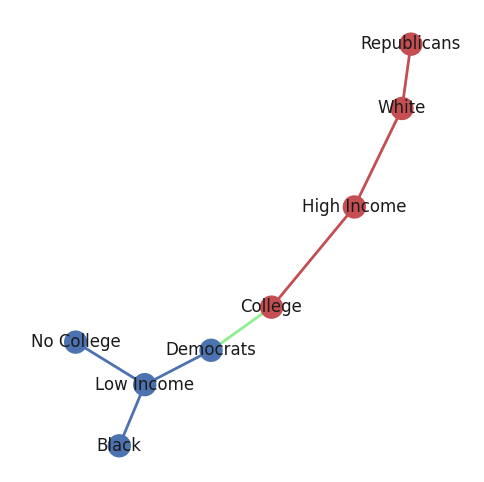

In [178]:
comun = ['Black', 'Democrats', 'Low-Income', 'No-College', 'College', 'High-Income', 'White', 'Republicans']
getMSTAll(comun, ['party', 'race', 'affluence', 'education'])

In [179]:
def getMSTAllDKS(comun, objs):
    """ Plot MST of a sample of communities according to KS score

    Parameters:
    comun -- list of communities ordered by the dendogram
    objs -- list of the attributes under study
    """
    comunDic = dict()
    for categ in objs:
        for sub in subcats[categ]:
            subUsers = np.array([[0,0]])
            for k in range(len(yearsSubset)):
                subUsers = np.concatenate((subUsers, attributesData[categ][k][sub]), axis=0)
            subUsers = np.delete(subUsers, 0, axis=0)
            comunDic[sub] = subUsers

    comSize = len(comun)
    graphscore = np.zeros((comSize,comSize))
    comunLabels = dict()
    itemLabels = dict()
    for i in range(comSize):
        comunLabels[i] = comun[i]
        itemLabels[comun[i]] = i
        for j in range(i+1, comSize):
            comm1 = comunDic[comun[i]]
            comm2 = comunDic[comun[j]]
            x1, y1 = comm1[:,0], comm1[:,1]
            x2, y2 = comm2[:,0], comm2[:,1]
            p, D = ks2d2s(x1, y1, x2, y2, extra=True)
            graphscore[i,j] = D
    

    MST = minimum_spanning_tree(graphscore)
    G = nx.from_numpy_array(MST)
    fig, ax = plt.subplots(figsize=(6,6))
    nx.draw_networkx(G, labels=comunLabels, node_color='C1', node_size=250, 
                     pos=nx.spring_layout(G, seed=9708), ax=ax)
#     ax.set_title('Distance between centroids')
#     ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
#     ax.set_xlim(-1.35, 1.28)
#     ax.axis('off')

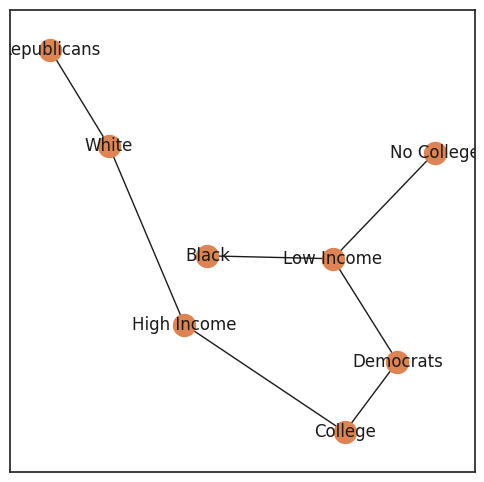

In [180]:
comun = ['Black', 'Democrats', 'Low-Income', 'No-College', 'College', 'High-Income', 'White', 'Republicans']
getMSTAllDKS(comun, ['party', 'race', 'affluence', 'education'])

Text(0, 0.5, 'Distance between centroids')

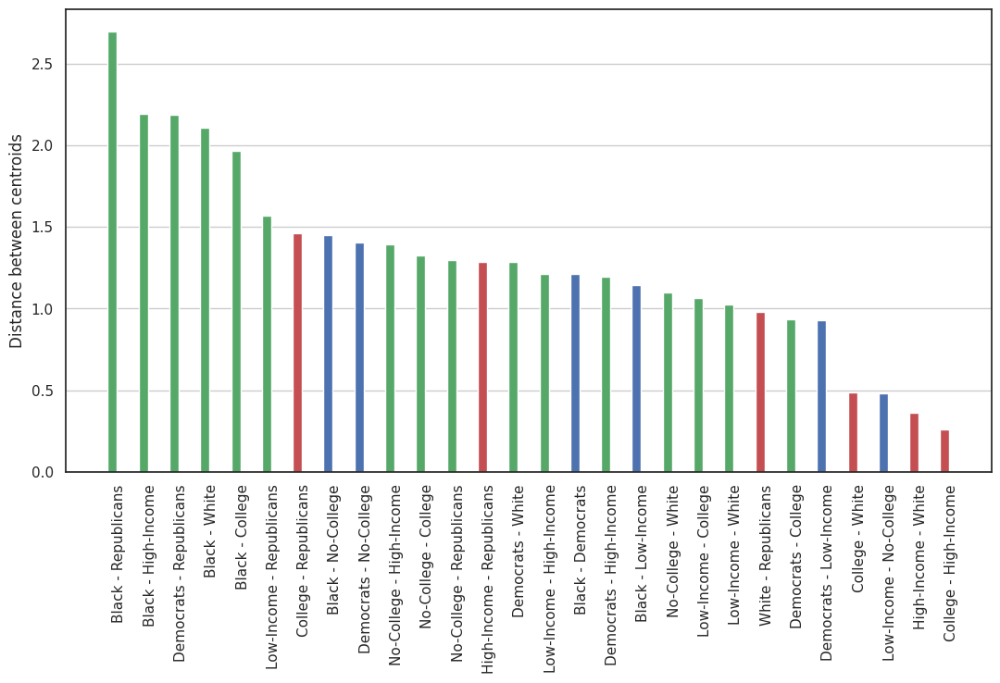

In [53]:
objs = ['party', 'race', 'affluence', 'education']
centroids = dict()
for categ in objs:
    for sub in subcats[categ]:
        subUsers = np.array([[0,0]])
        for k in range(len(yearsSubset)):
            subUsers = np.concatenate((subUsers, attributesData[categ][k][sub]), axis=0)
        subUsers = np.delete(subUsers, 0, axis=0)
        center = meanPoints(subUsers)
        centroids[sub] = center[0], center[1]

comun = ['Black', 'Democrats', 'Low-Income', 'No-College', 'College', 'High-Income', 'White', 'Republicans']
comSize = len(comun)
centdist = np.array([])
one = list()
two = list()
labels = list()
colors = list()
for i in range(comSize):
    for j in range(i+1, comSize):
        centdist = np.append(centdist, math.dist(centroids[comun[i]], centroids[comun[j]]))
        one.append(i)
        two.append(j)
        labels.append(comun[i] + ' - ' + comun[j])
        if i <= 3 and j <= 3:
            colors.append('b')
        elif i <= 3 and j > 3:
            colors.append('g')
        elif i > 3:
            colors.append('r')


# plot distances
fig = plt.figure(figsize=(10,5))
x = np.arange(len(labels))
ax = fig.add_axes([0,0,1,1])

order = np.argsort(centdist)[::-1]
labelsSorted = []
for n,i in enumerate(order):
    ax.bar(n, centdist[i], color=colors[i], width = 0.3)
    labelsSorted.append(labels[i])

ax.grid(axis='y')

ax.set_xticks(x)
ax.set_xticklabels(labelsSorted)
plt.setp(ax.get_xticklabels(), rotation=90, horizontalalignment='left')
ax.set_ylabel("Distance between centroids")

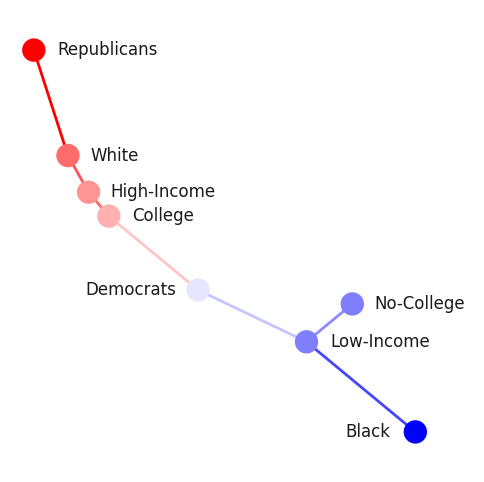

In [54]:
centroids = dict()
for categ in objs:
    for sub in subcats[categ]:
        subUsers = np.array([[0,0]])
        for k in range(len(yearsSubset)):
            subUsers = np.concatenate((subUsers, attributesData[categ][k][sub]), axis=0)
        subUsers = np.delete(subUsers, 0, axis=0)
        center = meanPoints(subUsers)
        centroids[sub] = center[0], center[1]

comSize = len(comun)
graphdist = np.zeros((comSize,comSize))
comunLabels = dict()
itemLabels = dict()
for i in range(comSize):
    comunLabels[i] = comun[i]
    itemLabels[comun[i]] = i
    for j in range(i+1, comSize):
        graphdist[i,j] = math.dist(centroids[comun[i]], centroids[comun[j]])


MST = minimum_spanning_tree(graphdist)
G = nx.from_numpy_array(MST)
pos = dict()
sep = lambda ang: np.array([-np.cos(np.deg2rad(ang)), np.sin(np.deg2rad(ang))])
pos[itemLabels['Low-Income']] = np.array([0.,0.])
pos[itemLabels['Black']] = pos[itemLabels['Low-Income']] + np.array([-1,-1])*sep(45)*G.edges[2,0]['weight']
pos[itemLabels['No-College']] = pos[itemLabels['Low-Income']] + np.array([-1,1])*sep(45)*G.edges[2,3]['weight']
pos[itemLabels['Democrats']] = pos[itemLabels['Low-Income']] + sep(30)*G.edges[2,1]['weight']
pos[itemLabels['College']] = pos[itemLabels['Democrats']] + sep(45)*G.edges[1,4]['weight']
pos[itemLabels['High-Income']] = pos[itemLabels['College']] + sep(55)*G.edges[4,5]['weight']
pos[itemLabels['White']] = pos[itemLabels['High-Income']] + sep(65)*G.edges[5,6]['weight']
pos[itemLabels['Republicans']] = pos[itemLabels['White']] + sep(75)*G.edges[6,7]['weight']

# colorIndex = np.empty(len(comun))
# colorIndex[itemLabels['Black']] = 0
# colorIndex[itemLabels['Low-Income']] = 0.4801284
# colorIndex[itemLabels['No-College']] = colorIndex[itemLabels['Low-Income']]
# colorIndex[itemLabels['Democrats']] = 0.92972796
# colorIndex[itemLabels['College']] = colorIndex[itemLabels['Democrats']] + 0.26144005
# colorIndex[itemLabels['High-Income']] = colorIndex[itemLabels['College']]
# colorIndex[itemLabels['White']] = colorIndex[itemLabels['Democrats']] + 0.36257167
# colorIndex[itemLabels['Republicans']] = colorIndex[itemLabels['Democrats']] + 0.97819951

colorIndex = np.empty(len(comun))
colorIndex[itemLabels['Black']] = 0
colorIndex[itemLabels['Low-Income']] = G.edges[2,0]['weight']
colorIndex[itemLabels['No-College']] = colorIndex[itemLabels['Low-Income']]
colorIndex[itemLabels['Democrats']] = colorIndex[itemLabels['Low-Income']] + G.edges[2,1]['weight']
colorIndex[itemLabels['College']] = colorIndex[itemLabels['Democrats']] + G.edges[1,4]['weight']
colorIndex[itemLabels['High-Income']] = colorIndex[itemLabels['College']] + G.edges[4,5]['weight']
colorIndex[itemLabels['White']] = colorIndex[itemLabels['High-Income']] + G.edges[5,6]['weight']
colorIndex[itemLabels['Republicans']] = colorIndex[itemLabels['White']] + G.edges[6,7]['weight']

colorEdge = np.empty(len(comun) - 1)
colorEdge[0] = colorIndex[itemLabels['Low-Income']]/2.
colorEdge[1] = colorIndex[itemLabels['Low-Income']]
colorEdge[2] = colorIndex[itemLabels['Low-Income']] + G.edges[2,1]['weight']/2.
colorEdge[3] = colorIndex[itemLabels['Democrats']] + G.edges[1,4]['weight']/2.
colorEdge[4] = colorIndex[itemLabels['College']] + G.edges[4,5]['weight']
colorEdge[5] = colorIndex[itemLabels['High-Income']] + G.edges[5,6]['weight']/2.
colorEdge[6] = colorIndex[itemLabels['White']] + G.edges[6,7]['weight']/2.

posLabel = dict()
desp = [-0.35, -0.5, 0.55, 0.5, 0.4, 0.55, 0.35, 0.55]
for n,i in enumerate(comun):
    posLabel[itemLabels[i]] = pos[itemLabels[i]] + np.array([desp[n], 0])

fig, ax = plt.subplots(figsize=(6,6))
# nx.draw_networkx(G, labels=comunLabels, node_color=colorIndex, node_size=250, 
#                  pos=pos, ax=ax, cmap=matplotlib.colormaps['bwr'])
nx.draw_networkx_nodes(G, node_color=colorIndex, node_size=250, pos=pos, ax=ax, cmap=matplotlib.colormaps['bwr'])
nx.draw_networkx_edges(G, edgelist=[(itemLabels['Black'], itemLabels['Low-Income']), 
                                    (itemLabels['Low-Income'], itemLabels['No-College']), 
                                    (itemLabels['Low-Income'], itemLabels['Democrats']), 
                                    (itemLabels['Democrats'], itemLabels['College']), 
                                    (itemLabels['College'], itemLabels['High-Income']), 
                                    (itemLabels['High-Income'], itemLabels['White']), 
                                    (itemLabels['White'], itemLabels['Republicans'])], 
                       edge_color=colorEdge, width=2, pos=pos, ax=ax, 
                       edge_cmap=matplotlib.colormaps['bwr'], edge_vmin=0, edge_vmax=colorEdge[-1])
nx.draw_networkx_labels(G, labels=comunLabels, pos=posLabel, ax=ax)

#ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_xlim(-2.2, 1.25)
ax.axis('off')
plt.show()
#plt.savefig('../MST.pdf', bbox_inches="tight")

In [58]:
comunDic = dict()
for categ in objs:
    for sub in subcats[categ]:
        subUsers = np.array([[0,0]])
        for k in range(len(yearsSubset)):
            subUsers = np.concatenate((subUsers, attributesData[categ][k][sub]), axis=0)
        subUsers = np.delete(subUsers, 0, axis=0)
        comunDic[sub] = subUsers

comSize = len(comun)
graphscore = np.zeros((comSize,comSize))
comunLabels = dict()
itemLabels = dict()
for i in range(comSize):
    comunLabels[i] = comun[i]
    itemLabels[comun[i]] = i
    for j in range(i+1, comSize):
        comm1 = comunDic[comun[i]]
        comm2 = comunDic[comun[j]]
        x1, y1 = comm1[:,0], comm1[:,1]
        x2, y2 = comm2[:,0], comm2[:,1]
        p, D = ks2d2s(x1, y1, x2, y2, extra=True)
        graphscore[i,j] = D

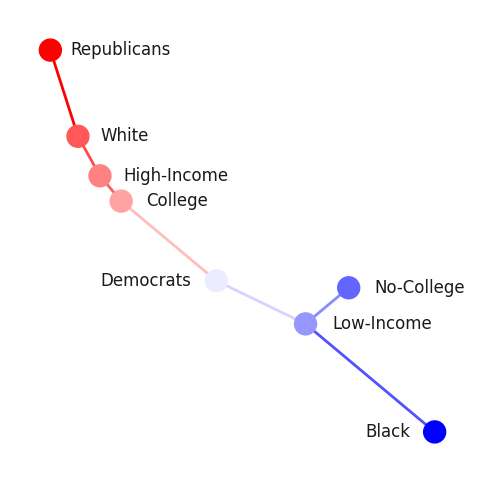

In [59]:
MST = minimum_spanning_tree(graphscore)
G = nx.from_numpy_array(MST)
pos = dict()
sep = lambda ang: np.array([-np.cos(np.deg2rad(ang)), np.sin(np.deg2rad(ang))])
pos[itemLabels['Low-Income']] = np.array([0.,0.])
pos[itemLabels['Black']] = pos[itemLabels['Low-Income']] + np.array([-1,-1])*sep(45)*G.edges[2,0]['weight']
pos[itemLabels['No-College']] = pos[itemLabels['Low-Income']] + np.array([-1,1])*sep(45)*G.edges[2,3]['weight']
pos[itemLabels['Democrats']] = pos[itemLabels['Low-Income']] + sep(30)*G.edges[2,1]['weight']
pos[itemLabels['College']] = pos[itemLabels['Democrats']] + sep(45)*G.edges[1,4]['weight']
pos[itemLabels['High-Income']] = pos[itemLabels['College']] + sep(55)*G.edges[4,5]['weight']
pos[itemLabels['White']] = pos[itemLabels['High-Income']] + sep(65)*G.edges[5,6]['weight']
pos[itemLabels['Republicans']] = pos[itemLabels['White']] + sep(75)*G.edges[6,7]['weight']

colorIndex = np.empty(len(comun))
colorIndex[itemLabels['Black']] = 0
colorIndex[itemLabels['Low-Income']] = G.edges[2,0]['weight']
colorIndex[itemLabels['No-College']] = colorIndex[itemLabels['Low-Income']] - G.edges[2,3]['weight']
colorIndex[itemLabels['Democrats']] = colorIndex[itemLabels['Low-Income']] + G.edges[2,1]['weight']
colorIndex[itemLabels['College']] = colorIndex[itemLabels['Democrats']] + G.edges[1,4]['weight']
colorIndex[itemLabels['High-Income']] = colorIndex[itemLabels['College']] + G.edges[4,5]['weight']
colorIndex[itemLabels['White']] = colorIndex[itemLabels['High-Income']] + G.edges[5,6]['weight']
colorIndex[itemLabels['Republicans']] = colorIndex[itemLabels['White']] + G.edges[6,7]['weight']

colorEdge = np.empty(len(comun) - 1)
colorEdge[0] = colorIndex[itemLabels['Low-Income']]/2.
colorEdge[1] = (colorIndex[itemLabels['Low-Income']] + colorIndex[itemLabels['No-College']])/2.
colorEdge[2] = colorIndex[itemLabels['Low-Income']] + G.edges[2,1]['weight']/2.
colorEdge[3] = colorIndex[itemLabels['Democrats']] + G.edges[1,4]['weight']/2.
colorEdge[4] = colorIndex[itemLabels['College']] + G.edges[4,5]['weight']
colorEdge[5] = colorIndex[itemLabels['High-Income']] + G.edges[5,6]['weight']/2.
colorEdge[6] = colorIndex[itemLabels['White']] + G.edges[6,7]['weight']/2.

posLabel = dict()
desp = [-0.08, -0.12, 0.13, 0.12, 0.095, 0.13, 0.08, 0.12]
for n,i in enumerate(comun):
    posLabel[itemLabels[i]] = pos[itemLabels[i]] + np.array([desp[n], 0])

fig, ax = plt.subplots(figsize=(6,6))
nx.draw_networkx_nodes(G, node_color=colorIndex, node_size=250, pos=pos, ax=ax, 
                       cmap=matplotlib.colormaps['bwr'])
nx.draw_networkx_edges(G, edgelist=[(itemLabels['Black'], itemLabels['Low-Income']), 
                                    (itemLabels['Low-Income'], itemLabels['No-College']), 
                                    (itemLabels['Low-Income'], itemLabels['Democrats']), 
                                    (itemLabels['Democrats'], itemLabels['College']), 
                                    (itemLabels['College'], itemLabels['High-Income']), 
                                    (itemLabels['High-Income'], itemLabels['White']), 
                                    (itemLabels['White'], itemLabels['Republicans'])], 
                       edge_color=colorEdge, width=2, pos=pos, ax=ax, 
                       edge_cmap=matplotlib.colormaps['bwr'], edge_vmin=0, edge_vmax=colorEdge[-1])
nx.draw_networkx_labels(G, labels=comunLabels, pos=posLabel, ax=ax)

ax.axis('off')
plt.show()
#plt.savefig('../MST_DKS.pdf', bbox_inches="tight")

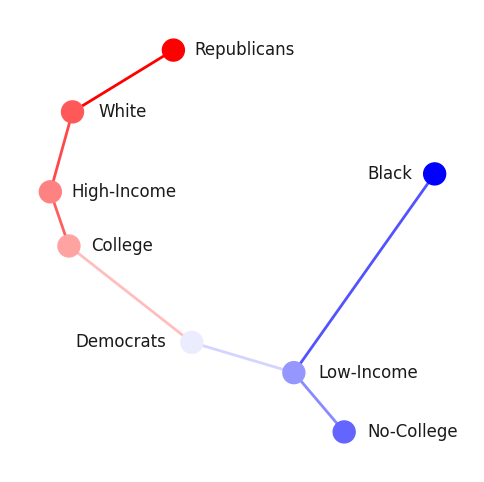

In [87]:
MST = minimum_spanning_tree(graphscore)
G = nx.from_numpy_array(MST)
pos = dict()
sep = lambda ang: np.array([-np.cos(np.deg2rad(ang)), np.sin(np.deg2rad(ang))])
pos[itemLabels['Low-Income']] = np.array([0.,0.])
pos[itemLabels['Black']] = pos[itemLabels['Low-Income']] + np.array([-1,1])*sep(40)*G.edges[2,0]['weight']
pos[itemLabels['No-College']] = pos[itemLabels['Low-Income']] + np.array([-1,-1])*sep(35)*G.edges[2,3]['weight']
pos[itemLabels['Democrats']] = pos[itemLabels['Low-Income']] + sep(10)*G.edges[2,1]['weight']
pos[itemLabels['College']] = pos[itemLabels['Democrats']] + sep(25)*G.edges[1,4]['weight']
pos[itemLabels['High-Income']] = pos[itemLabels['College']] + sep(60)*G.edges[4,5]['weight']
pos[itemLabels['White']] = pos[itemLabels['High-Income']] + sep(115)*G.edges[5,6]['weight']
pos[itemLabels['Republicans']] = pos[itemLabels['White']] + sep(160)*G.edges[6,7]['weight']

colorIndex = np.empty(len(comun))
colorIndex[itemLabels['Black']] = 0
colorIndex[itemLabels['Low-Income']] = G.edges[2,0]['weight']
colorIndex[itemLabels['No-College']] = colorIndex[itemLabels['Low-Income']] - G.edges[2,3]['weight']
colorIndex[itemLabels['Democrats']] = colorIndex[itemLabels['Low-Income']] + G.edges[2,1]['weight']
colorIndex[itemLabels['College']] = colorIndex[itemLabels['Democrats']] + G.edges[1,4]['weight']
colorIndex[itemLabels['High-Income']] = colorIndex[itemLabels['College']] + G.edges[4,5]['weight']
colorIndex[itemLabels['White']] = colorIndex[itemLabels['High-Income']] + G.edges[5,6]['weight']
colorIndex[itemLabels['Republicans']] = colorIndex[itemLabels['White']] + G.edges[6,7]['weight']

colorEdge = np.empty(len(comun) - 1)
colorEdge[0] = colorIndex[itemLabels['Low-Income']]/2.
colorEdge[1] = (colorIndex[itemLabels['Low-Income']] + colorIndex[itemLabels['No-College']])/2.
colorEdge[2] = colorIndex[itemLabels['Low-Income']] + G.edges[2,1]['weight']/2.
colorEdge[3] = colorIndex[itemLabels['Democrats']] + G.edges[1,4]['weight']/2.
colorEdge[4] = colorIndex[itemLabels['College']] + G.edges[4,5]['weight']
colorEdge[5] = colorIndex[itemLabels['High-Income']] + G.edges[5,6]['weight']/2.
colorEdge[6] = colorIndex[itemLabels['White']] + G.edges[6,7]['weight']/2.

posLabel = dict()
desp = [-0.075, -0.12, 0.125, 0.115, 0.09, 0.125, 0.085, 0.12]
for n,i in enumerate(comun):
    posLabel[itemLabels[i]] = pos[itemLabels[i]] + np.array([desp[n], 0])

fig, ax = plt.subplots(figsize=(6,6))
nx.draw_networkx_nodes(G, node_color=colorIndex, node_size=250, pos=pos, ax=ax, 
                       cmap=matplotlib.colormaps['bwr'])
nx.draw_networkx_edges(G, edgelist=[(itemLabels['Black'], itemLabels['Low-Income']), 
                                    (itemLabels['Low-Income'], itemLabels['No-College']), 
                                    (itemLabels['Low-Income'], itemLabels['Democrats']), 
                                    (itemLabels['Democrats'], itemLabels['College']), 
                                    (itemLabels['College'], itemLabels['High-Income']), 
                                    (itemLabels['High-Income'], itemLabels['White']), 
                                    (itemLabels['White'], itemLabels['Republicans'])], 
                       edge_color=colorEdge, width=2, pos=pos, ax=ax, 
                       edge_cmap=matplotlib.colormaps['bwr'], edge_vmin=0, edge_vmax=colorEdge[-1])
nx.draw_networkx_labels(G, labels=comunLabels, pos=posLabel, ax=ax)

ax.axis('off')
plt.show()
#plt.savefig('../MST_DKS_2.pdf', bbox_inches="tight")